## 1. Automate the mapping process

In [ ]:
!pip install geopandas mapclassify pysal splot matplotlib_scalebar cartopy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 28.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 4.8 MB/s eta 0:00:00
  Created wheel for cartopy: filename=Cartopy-0.21.1-cp310-cp310-linux_x86_64.whl size=11102747 sha256=087ee5a777791200c75e333333b2000865490350d06fcf955d3469aa8b528eb1
  Stored in directory: /root/.cache/pip/wheels/30/b0/1a/1c1909e00c76653dc4e2ff48555257c0eb2d1698280c8d9955
Successfully built cartopy


### 1.1 Draw thematic maps


#### 1.1.1 Generate a basic choropleth map of the US population

Prompt: How to write Python code to draw a choropleth map of US population?

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# Read the US states shapefile
states_shapefile = gpd.read_file('usa_states.geojson')

# Read the US population data
population_data = pd.read_csv('us_population.csv')

# Merge the population data with the states shapefile
states_shapefile = states_shapefile.merge(population_data, left_on='NAME', right_on='state')

# Normalize the population data for better visualization
states_shapefile['population_norm'] = states_shapefile['population'] / states_shapefile['population'].max()

# Plot the choropleth map
fig, ax = plt.subplots(1, figsize=(12, 8))
states_shapefile.plot(column='population_norm', cmap='coolwarm_r', linewidth=0.8, edgecolor='0.8', ax=ax, legend=True)
ax.set_title('Choropleth Map of US Population')
ax.set_axis_off()
plt.show()


ERROR:fiona._env:usa_states.geojson: No such file or directory


DriverError: ignored

Revised with the prompt: can you use some existed urls to plot?


ValueError: ignored

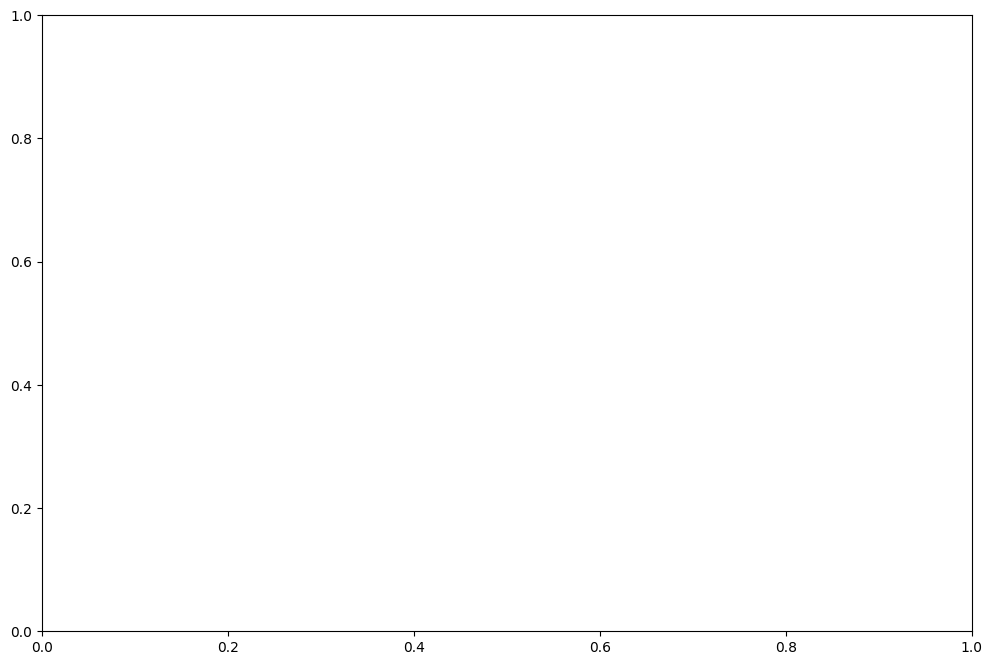

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import requests
from io import StringIO

# Download the US states shapefile (GeoJSON)
url_shapefile = "https://eric.clst.org/assets/wiki/uploads/Stuff/gz_2010_us_040_00_5m.json"
states_shapefile = gpd.read_file(url_shapefile)

# Download US population data (CSV)
url_population = "https://raw.githubusercontent.com/jakevdp/data-USstates/master/state-population.csv"
response = requests.get(url_population)
population_data = pd.read_csv(StringIO(response.text))

# Filter the population data to the most recent year
population_data = population_data[population_data['year'] == population_data['year'].max()]

# Merge the population data with the states shapefile
states_shapefile = states_shapefile.merge(population_data, left_on='NAME', right_on='state/region')

# Normalize the population data for better visualization
states_shapefile['population_norm'] = states_shapefile['population'] / states_shapefile['population'].max()

# Plot the choropleth map
fig, ax = plt.subplots(1, figsize=(12, 8))
states_shapefile.plot(column='population_norm', cmap='coolwarm_r', linewidth=0.8, edgecolor='0.8', ax=ax, legend=True)
ax.set_title('Choropleth Map of US Population')
ax.set_axis_off()
plt.show()


Revised prompt: Can you use other urls? The current data provided do not have a match with column "NAMES" and "state/region".

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import requests
from io import StringIO

# Download the US states shapefile (GeoJSON)
url_shapefile = "https://raw.githubusercontent.com/nvkelso/natural-earth-vector/master/geojson/ne_50m_admin_1_states_provinces_lakes.geojson"
states_shapefile = gpd.read_file(url_shapefile)

# Filter the shapefile to US states only
states_shapefile = states_shapefile[states_shapefile["iso_a2"] == "US"]

# Download US population data (CSV) from the Census Bureau's API
url_population = "https://api.census.gov/data/2019/pep/population?get=NAME,POP&for=state:*"
response = requests.get(url_population)
population_data = pd.read_csv(StringIO(response.text), skiprows=1, names=["state", "population", "state_code"])

# Merge the population data with the states shapefile
states_shapefile = states_shapefile.merge(population_data, left_on="postal", right_on="state_code")

# Normalize the population data for better visualization
states_shapefile["population_norm"] = states_shapefile["population"] / states_shapefile["population"].max()

# Plot the choropleth map
fig, ax = plt.subplots(1, figsize=(12, 8))
states_shapefile.plot(column="population_norm", cmap="coolwarm_r", linewidth=0.8, edgecolor="0.8", ax=ax, legend=True)
ax.set_title("Choropleth Map of US Population")
ax.set_axis_off()
plt.show()


ValueError: ignored

Correction: ValueError: You are trying to merge on object and float64 columns. If you wish to proceed you should use pd.concat

ValueError: ignored

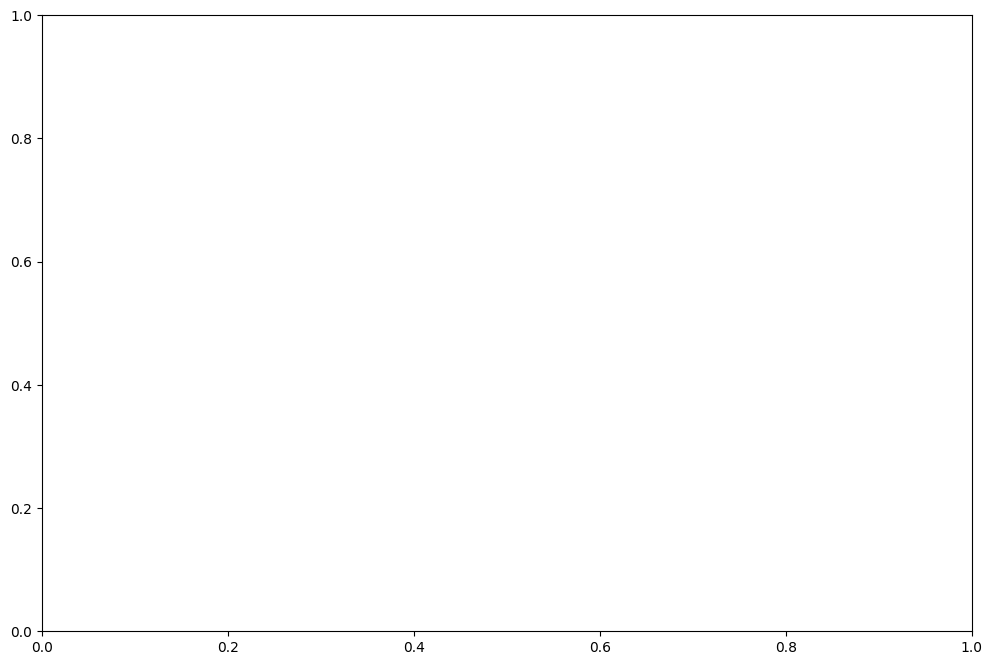

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import requests
from io import StringIO

# Download the US states shapefile (GeoJSON)
url_shapefile = "https://raw.githubusercontent.com/nvkelso/natural-earth-vector/master/geojson/ne_50m_admin_1_states_provinces_lakes.geojson"
states_shapefile = gpd.read_file(url_shapefile)

# Filter the shapefile to US states only
states_shapefile = states_shapefile[states_shapefile["iso_a2"] == "US"]

# Download US population data (CSV) from the Census Bureau's API
url_population = "https://api.census.gov/data/2019/pep/population?get=NAME,POP&for=state:*"
response = requests.get(url_population)
population_data = pd.read_csv(StringIO(response.text), skiprows=1, names=["state", "population", "state_code"])

# Convert the state_code column to an object data type
population_data['state_code'] = population_data['state_code'].astype(str)

# Merge the population data with the states shapefile
states_shapefile = states_shapefile.merge(population_data, left_on="postal", right_on="state_code")

# Normalize the population data for better visualization
states_shapefile["population_norm"] = states_shapefile["population"] / states_shapefile["population"].max()

# Plot the choropleth map
fig, ax = plt.subplots(1, figsize=(12, 8))
states_shapefile.plot(column="population_norm", cmap="coolwarm_r", linewidth=0.8, edgecolor="0.8", ax=ax, legend=True)
ax.set_title("Choropleth Map of US Population")
ax.set_axis_off()
plt.show()


---------------------------------------------------------------------------
ValueError                                Traceback (most recent call last)
<ipython-input-8-d84529162da6> in <cell line: 30>()
     28 # Plot the choropleth map
     29 fig, ax = plt.subplots(1, figsize=(12, 8))
---> 30 states_shapefile.plot(column="population_norm", cmap="coolwarm_r", linewidth=0.8, edgecolor="0.8", ax=ax, legend=True)
     31 ax.set_title("Choropleth Map of US Population")
     32 ax.set_axis_off()

2 frames
/usr/local/lib/python3.9/dist-packages/matplotlib/axes/_base.py in set_aspect(self, aspect, adjustable, anchor, share)
   1667             aspect = float(aspect)  # raise ValueError if necessary
   1668             if aspect <= 0 or not np.isfinite(aspect):
-> 1669                 raise ValueError("aspect must be finite and positive ")
   1670 
   1671         if share:

ValueError: aspect must be finite and positive 


ValueError: ignored

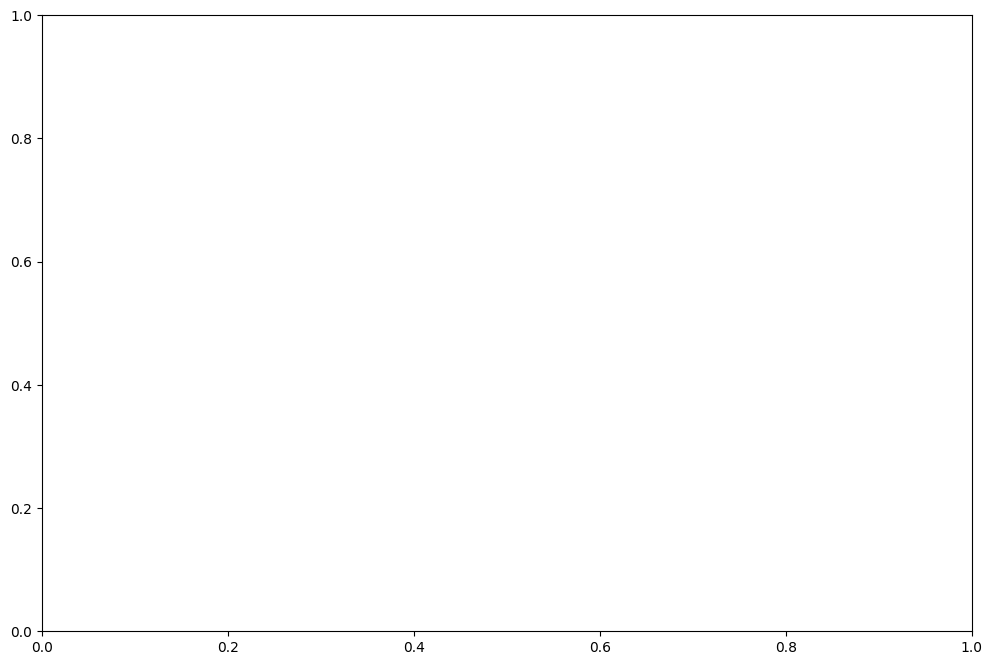

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import requests
from io import StringIO

# Download the US states shapefile (GeoJSON)
url_shapefile = "https://raw.githubusercontent.com/nvkelso/natural-earth-vector/master/geojson/ne_50m_admin_1_states_provinces_lakes.geojson"
states_shapefile = gpd.read_file(url_shapefile)

# Filter the shapefile to US states only
states_shapefile = states_shapefile[states_shapefile["iso_a2"] == "US"]

# Download US population data (CSV) from the Census Bureau's API
url_population = "https://api.census.gov/data/2019/pep/population?get=NAME,POP&for=state:*"
response = requests.get(url_population)
population_data = pd.read_csv(StringIO(response.text), skiprows=1, names=["state", "population", "state_code"])

# Convert the state_code column to an object data type
population_data['state_code'] = population_data['state_code'].astype(str)

# Merge the population data with the states shapefile
states_shapefile = states_shapefile.merge(population_data, left_on="postal", right_on="state_code")

# Normalize the population data for better visualization
states_shapefile["population_norm"] = states_shapefile["population"] / states_shapefile["population"].max()

# Remove invalid geometries
states_shapefile = states_shapefile.dropna(subset=['geometry'])

# Plot the choropleth map
fig, ax = plt.subplots(1, figsize=(12, 8))
states_shapefile.plot(column="population_norm", cmap="coolwarm_r", linewidth=0.8, edgecolor="0.8", ax=ax, legend=True)
ax.set_title("Choropleth Map of US Population")
ax.set_axis_off()
plt.show()


Still cannot get it right, the issue is caused by parsing the population csv (mannually detected). Asked with the new prompt: The parsing in this part is not correct: 
url_population = "https://api.census.gov/data/2019/pep/population?get=NAME,POP&for=state:*"
response = requests.get(url_population)
population_data = pd.read_csv(StringIO(response.text), skiprows=0, names=["state", "population", "state_code"])

In [ ]:
url_shapefile = "https://raw.githubusercontent.com/nvkelso/natural-earth-vector/master/geojson/ne_50m_admin_1_states_provinces_lakes.geojson"
states_shapefile = gpd.read_file(url_shapefile)
states_shapefile = states_shapefile[states_shapefile["iso_a2"] == "US"]


In [ ]:
population_data.head()

,state,population,state_code
"[""Alabama""",4903185,01],nan
"[""Alaska""",731545,02],nan
"[""Arizona""",7278717,04],nan
"[""Arkansas""",3017804,05],nan
"[""California""",39512223,06],nan


Now looks good, replace the codes above.

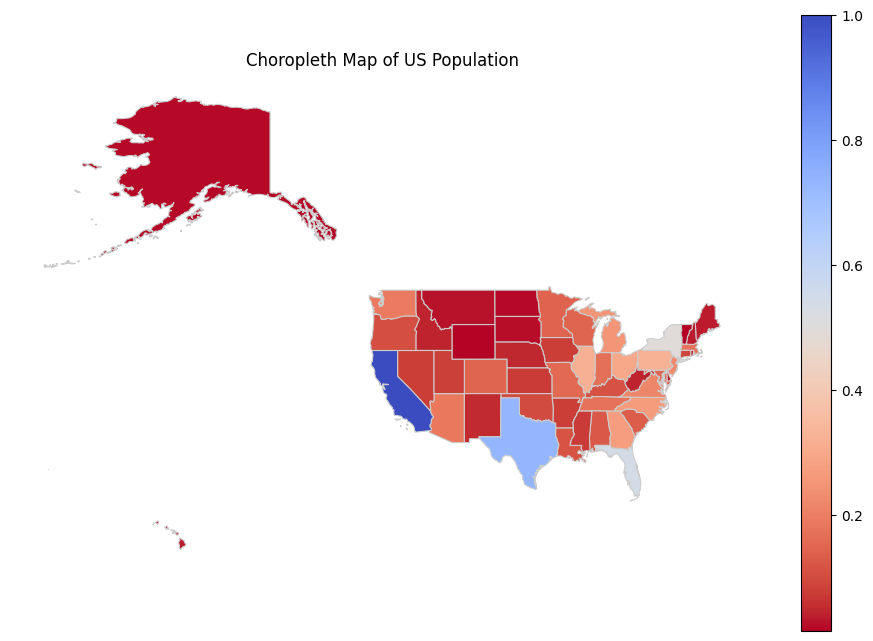

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import requests
from io import StringIO

# Download the US states shapefile (GeoJSON)
url_shapefile = "https://raw.githubusercontent.com/nvkelso/natural-earth-vector/master/geojson/ne_50m_admin_1_states_provinces_lakes.geojson"
states_shapefile = gpd.read_file(url_shapefile)

# Filter the shapefile to US states only
states_shapefile = states_shapefile[states_shapefile["iso_a2"] == "US"]

import json

url_population = "https://api.census.gov/data/2019/pep/population?get=NAME,POP&for=state:*"
response = requests.get(url_population)
population_json = json.loads(response.text)

# Convert JSON data to a DataFrame
population_data = pd.DataFrame(population_json[1:], columns=population_json[0])

# Convert the population column to an integer data type
population_data['POP'] = population_data['POP'].astype(int)

# Convert the state_code column to an object data type
population_data['NAME'] = population_data['NAME'].astype(str)

# Merge the population data with the states shapefile
states_shapefile = states_shapefile.merge(population_data, left_on="name", right_on="NAME")

# Normalize the population data for better visualization
states_shapefile["population_norm"] = states_shapefile["POP"] / states_shapefile["POP"].max()

# Remove invalid geometries
states_shapefile = states_shapefile.dropna(subset=['geometry'])

# Plot the choropleth map
fig, ax = plt.subplots(1, figsize=(12, 8))
states_shapefile.plot(column="population_norm", cmap="coolwarm_r", linewidth=0.8, edgecolor="0.8", ax=ax, legend=True)
ax.set_title("Choropleth Map of US Population")
ax.set_axis_off()
plt.show()


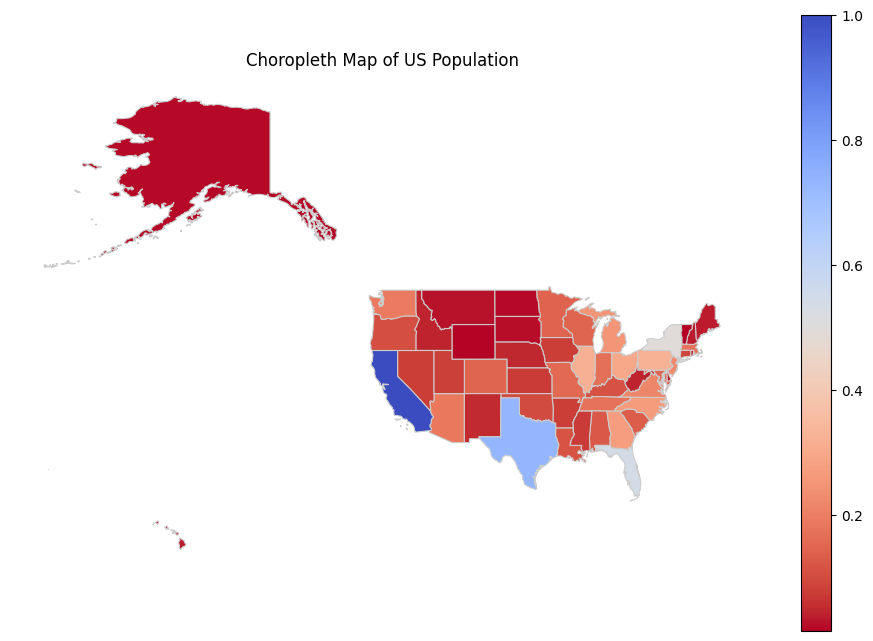

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import requests
from io import StringIO

# Download the US states shapefile (GeoJSON)
url_shapefile = "https://raw.githubusercontent.com/nvkelso/natural-earth-vector/master/geojson/ne_50m_admin_1_states_provinces_lakes.geojson"
states_shapefile = gpd.read_file(url_shapefile)

# Filter the shapefile to US states only
states_shapefile = states_shapefile[states_shapefile["iso_a2"] == "US"]

import json

url_population = "https://api.census.gov/data/2019/pep/population?get=NAME,POP&for=state:*"
response = requests.get(url_population)
population_json = json.loads(response.text)

# Convert JSON data to a DataFrame
population_data = pd.DataFrame(population_json[1:], columns=population_json[0])

# Convert the population column to an integer data type
population_data['POP'] = population_data['POP'].astype(int)

# Convert the state_code column to an object data type
population_data['NAME'] = population_data['NAME'].astype(str)

# Merge the population data with the states shapefile
states_shapefile = states_shapefile.merge(population_data, left_on="name", right_on="NAME")

# Normalize the population data for better visualization
states_shapefile["population_norm"] = states_shapefile["POP"] / states_shapefile["POP"].max()

# Remove invalid geometries
states_shapefile = states_shapefile.dropna(subset=['geometry'])

# Plot the choropleth map
fig, ax = plt.subplots(1, figsize=(12, 8))
states_shapefile.plot(column="population_norm", cmap="coolwarm_r", linewidth=0.8, edgecolor="0.8", ax=ax, legend=True)
ax.set_title("Choropleth Map of US Population")
ax.set_axis_off()
plt.show()


#### 1.1.2 customize the coordinate system and select certain state to plot

Can you focus on the mainland and use a projected coordinate system?

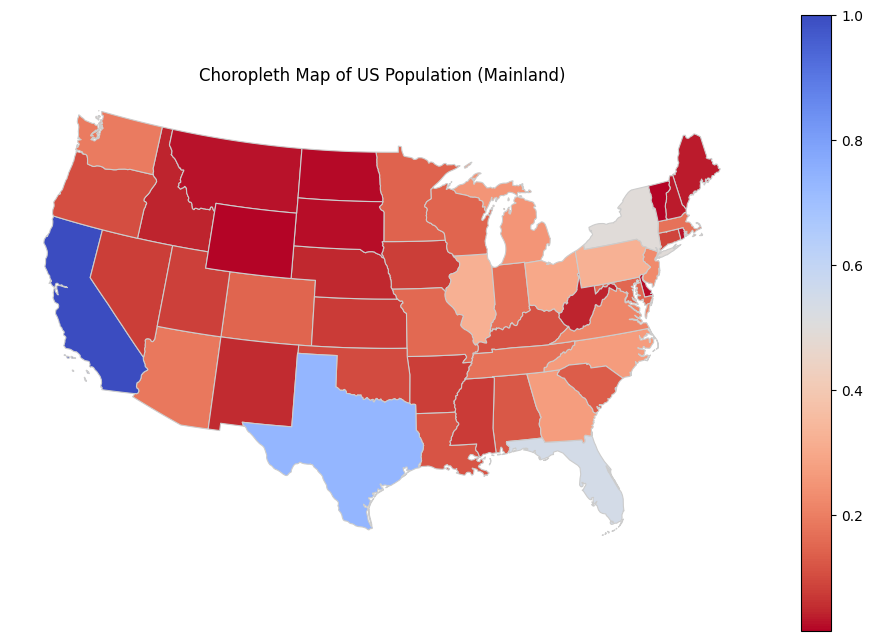

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import requests
import json

# Download the US states shapefile (GeoJSON)
url_shapefile = "https://raw.githubusercontent.com/nvkelso/natural-earth-vector/master/geojson/ne_50m_admin_1_states_provinces_lakes.geojson"
states_shapefile = gpd.read_file(url_shapefile)

# Filter the shapefile to US states only
states_shapefile = states_shapefile[states_shapefile["iso_a2"] == "US"]

# Remove non-mainland states and territories
non_mainland_states = ["Alaska", "Hawaii", "Puerto Rico", "Guam", "Northern Mariana Islands", "U.S. Virgin Islands", "American Samoa"]
states_shapefile = states_shapefile[~states_shapefile["name"].isin(non_mainland_states)]

# Download US population data
url_population = "https://api.census.gov/data/2019/pep/population?get=NAME,POP&for=state:*"
response = requests.get(url_population)
population_json = json.loads(response.text)

# Convert JSON data to a DataFrame
population_data = pd.DataFrame(population_json[1:], columns=population_json[0])

# Convert the population column to an integer data type
population_data['POP'] = population_data['POP'].astype(int)

# Convert the state_code column to an object data type
population_data['NAME'] = population_data['NAME'].astype(str)

# Merge the population data with the states shapefile
states_shapefile = states_shapefile.merge(population_data, left_on="name", right_on="NAME")

# Normalize the population data for better visualization
states_shapefile["population_norm"] = states_shapefile["POP"] / states_shapefile["POP"].max()

# Remove invalid geometries
states_shapefile = states_shapefile.dropna(subset=['geometry'])

# Reproject the shapefile to the Albers Equal Area projection
states_shapefile = states_shapefile.to_crs("EPSG:5070")

# Plot the choropleth map
fig, ax = plt.subplots(1, figsize=(12, 8))
states_shapefile.plot(column="population_norm", cmap="coolwarm_r", linewidth=0.8, edgecolor="0.8", ax=ax, legend=True)
ax.set_title("Choropleth Map of US Population (Mainland)")
ax.set_axis_off()
plt.show()


In [ ]:
!pip install matplotlib_scalebar

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


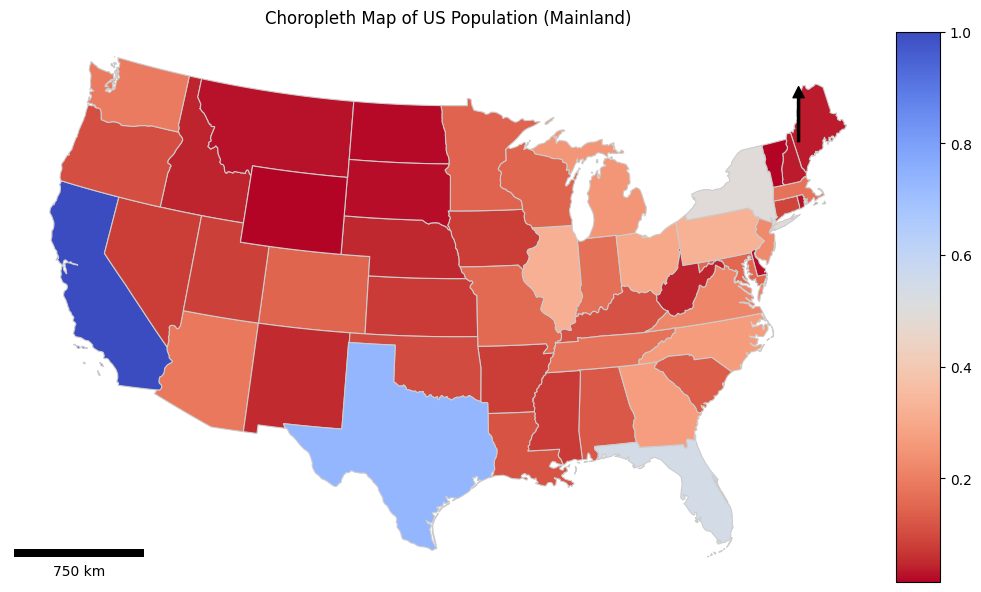

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import requests
import json
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib_scalebar.scalebar import ScaleBar

# Function to add a north arrow
def add_north_arrow(ax, x, y, arrow_length=0.1):
    ax.annotate('', xy=(x, y), xytext=(x, y - arrow_length),
                arrowprops=dict(facecolor='black', width=1.5, headwidth=8, headlength=8),
                ha='center', va='center', fontsize=12, xycoords=ax.transAxes)

# Download the US states shapefile (GeoJSON)
url_shapefile = "https://raw.githubusercontent.com/nvkelso/natural-earth-vector/master/geojson/ne_50m_admin_1_states_provinces_lakes.geojson"
states_shapefile = gpd.read_file(url_shapefile)

# Filter the shapefile to US states only
states_shapefile = states_shapefile[states_shapefile["iso_a2"] == "US"]

# Remove non-mainland states and territories
non_mainland_states = ["Alaska", "Hawaii", "Puerto Rico", "Guam", "Northern Mariana Islands", "U.S. Virgin Islands", "American Samoa"]
states_shapefile = states_shapefile[~states_shapefile["name"].isin(non_mainland_states)]

# Download US population data
url_population = "https://api.census.gov/data/2019/pep/population?get=NAME,POP&for=state:*"
response = requests.get(url_population)
population_json = json.loads(response.text)

# Convert JSON data to a DataFrame
population_data = pd.DataFrame(population_json[1:], columns=population_json[0])

# Convert the population column to an integer data type
population_data['POP'] = population_data['POP'].astype(int)

# Convert the state_code column to an object data type
population_data['NAME'] = population_data['NAME'].astype(str)

# Merge the population data with the states shapefile
states_shapefile = states_shapefile.merge(population_data, left_on="name", right_on="NAME")

# Normalize the population data for better visualization
states_shapefile["population_norm"] = states_shapefile["POP"] / states_shapefile["POP"].max()

# Remove invalid geometries
states_shapefile = states_shapefile.dropna(subset=['geometry'])

# Reproject the shapefile to the Albers Equal Area projection
states_shapefile = states_shapefile.to_crs("EPSG:5070")

# Plot the choropleth map
fig, ax = plt.subplots(1, figsize=(12, 8))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
states_shapefile.plot(column="population_norm", cmap="coolwarm_r", linewidth=0.8, edgecolor="0.8", ax=ax, legend=True, cax=cax)

# Add scale bar
scalebar = ScaleBar(1, units='m', location='lower left', length_fraction=0.15, height_fraction=0.015, pad=0.2)
ax.add_artist(scalebar)

# Add north arrow
add_north_arrow(ax, x=0.9, y=0.9, arrow_length=0.1)

ax.set_title("Choropleth Map of US Population (Mainland)")
ax.set_axis_off()
plt.show()


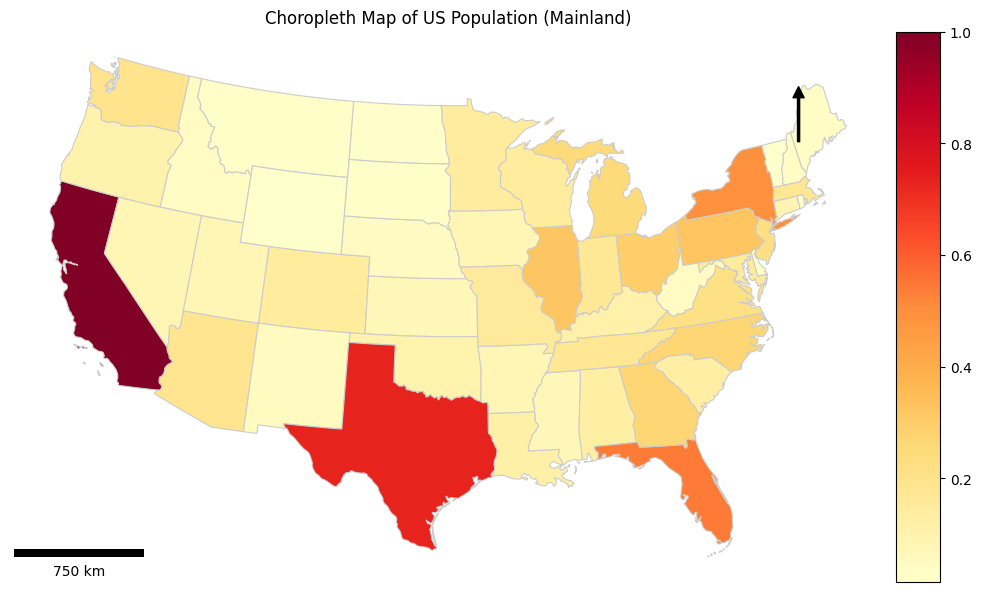

In [ ]:
# ... previous imports and code
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import requests
import json
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib_scalebar.scalebar import ScaleBar

# Function to add a north arrow
def add_north_arrow(ax, x, y, arrow_length=0.1):
    ax.annotate('', xy=(x, y), xytext=(x, y - arrow_length),
                arrowprops=dict(facecolor='black', width=1.5, headwidth=8, headlength=8),
                ha='center', va='center', fontsize=12, xycoords=ax.transAxes)

# Download the US states shapefile (GeoJSON)
url_shapefile = "https://raw.githubusercontent.com/nvkelso/natural-earth-vector/master/geojson/ne_50m_admin_1_states_provinces_lakes.geojson"
states_shapefile = gpd.read_file(url_shapefile)

# Filter the shapefile to US states only
states_shapefile = states_shapefile[states_shapefile["iso_a2"] == "US"]

# Remove non-mainland states and territories
non_mainland_states = ["Alaska", "Hawaii", "Puerto Rico", "Guam", "Northern Mariana Islands", "U.S. Virgin Islands", "American Samoa"]
states_shapefile = states_shapefile[~states_shapefile["name"].isin(non_mainland_states)]

# Download US population data
url_population = "https://api.census.gov/data/2019/pep/population?get=NAME,POP&for=state:*"
response = requests.get(url_population)
population_json = json.loads(response.text)

# Convert JSON data to a DataFrame
population_data = pd.DataFrame(population_json[1:], columns=population_json[0])

# Convert the population column to an integer data type
population_data['POP'] = population_data['POP'].astype(int)

# Convert the state_code column to an object data type
population_data['NAME'] = population_data['NAME'].astype(str)

# Merge the population data with the states shapefile
states_shapefile = states_shapefile.merge(population_data, left_on="name", right_on="NAME")

# Normalize the population data for better visualization
states_shapefile["population_norm"] = states_shapefile["POP"] / states_shapefile["POP"].max()

# Remove invalid geometries
states_shapefile = states_shapefile.dropna(subset=['geometry'])

# Reproject the shapefile to the Albers Equal Area projection
states_shapefile = states_shapefile.to_crs("EPSG:5070")

# Plot the choropleth map
fig, ax = plt.subplots(1, figsize=(12, 8))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
states_shapefile.plot(column="population_norm", cmap="YlOrRd", linewidth=0.8, edgecolor="0.8", ax=ax, legend=True, cax=cax)

# Add scale bar
scalebar = ScaleBar(1, units='m', location='lower left', length_fraction=0.15, height_fraction=0.015, pad=0.2)
ax.add_artist(scalebar)

# Add north arrow
add_north_arrow(ax, x=0.9, y=0.9, arrow_length=0.1)

ax.set_title("Choropleth Map of US Population (Mainland)")
ax.set_axis_off()
plt.show()


Can you use natural jenks classification in the code?

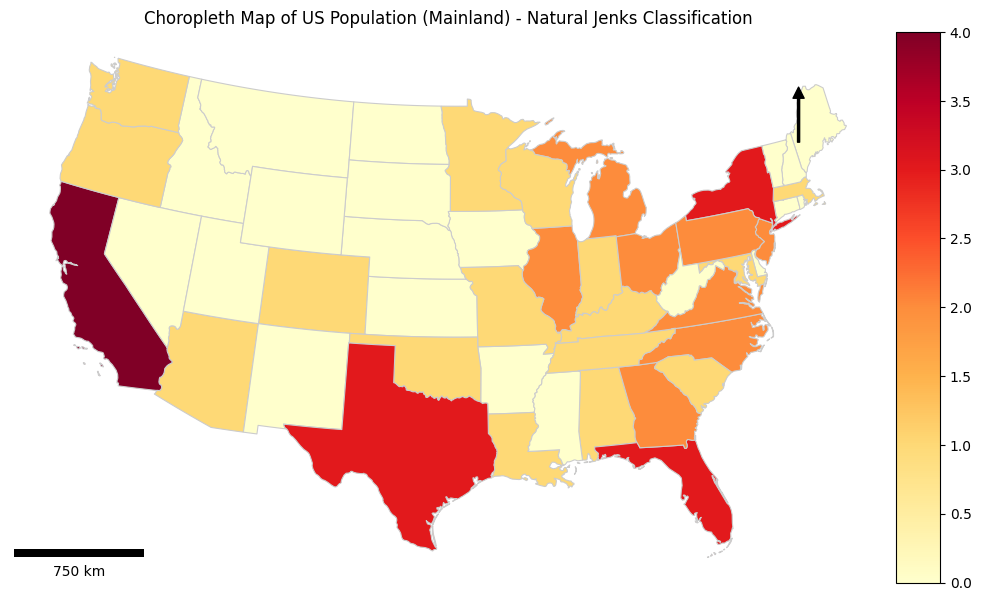

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import requests
import json
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib_scalebar.scalebar import ScaleBar
import mapclassify

# ... previous code for downloading data and preprocessing

# Reproject the shapefile to the Albers Equal Area projection
states_shapefile = states_shapefile.to_crs("EPSG:5070")

# Define the number of bins for classification
num_bins = 5

# Classify the population data using natural Jenks classification
classifier = mapclassify.NaturalBreaks.make(k=num_bins)
states_shapefile["population_bins"] = states_shapefile[["POP"]].apply(classifier)

# Plot the choropleth map
fig, ax = plt.subplots(1, figsize=(12, 8))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
states_shapefile.plot(column="population_bins", cmap="YlOrRd", linewidth=0.8, edgecolor="0.8", ax=ax, legend=True, cax=cax)

# Add scale bar
scalebar = ScaleBar(1, units='m', location='lower left', length_fraction=0.15, height_fraction=0.015, pad=0.2)
ax.add_artist(scalebar)

# Add north arrow
add_north_arrow(ax, x=0.9, y=0.9, arrow_length=0.1)

ax.set_title("Choropleth Map of US Population (Mainland) - Natural Jenks Classification")
ax.set_axis_off()
plt.show()


Can you find population data for Texas and plot choropleth map at the county level?

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import requests
from io import StringIO
import mapclassify

# Download Texas county boundaries from TIGER/Line shapefiles
url_texas_counties = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"
texas_counties = gpd.read_file(url_texas_counties)

# Filter the GeoDataFrame for Texas counties (FIPS code starts with '48')
texas_counties = texas_counties[texas_counties["id"].str.startswith("48")]

# Download population data from ACS 5-year estimates
url_acs_population = "https://api.census.gov/data/2019/acs/acs5?get=NAME,B01001_001E&for=county:*&in=state:48"
response = requests.get(url_acs_population)
population_data = pd.read_csv(StringIO(response.text), skiprows=1, names=["County", "Population", "State_FIPS", "County_FIPS"])

# Merge population data with Texas county shapefile
texas_counties = texas_counties.merge(population_data, left_on="id", right_on="State_FIPS" + "County_FIPS")

# Convert the population column to an integer data type
texas_counties["Population"] = texas_counties["Population"].astype(int)

# Normalize the population data for better visualization
texas_counties["population_norm"] = texas_counties["Population"] / texas_counties["Population"].max()

# Classify the population data using natural Jenks classification
num_bins = 5
classifier = mapclassify.NaturalBreaks.make(k=num_bins)
texas_counties["population_bins"] = texas_counties[["Population"]].apply(classifier)

# Plot the choropleth map
fig, ax = plt.subplots(1, figsize=(12, 8))
texas_counties.plot(column="population_bins", cmap="YlOrRd", linewidth=0.8, edgecolor="0.8", ax=ax, legend=True)

ax.set_title("Choropleth Map of Texas County Population")
ax.set_axis_off()
plt.show()


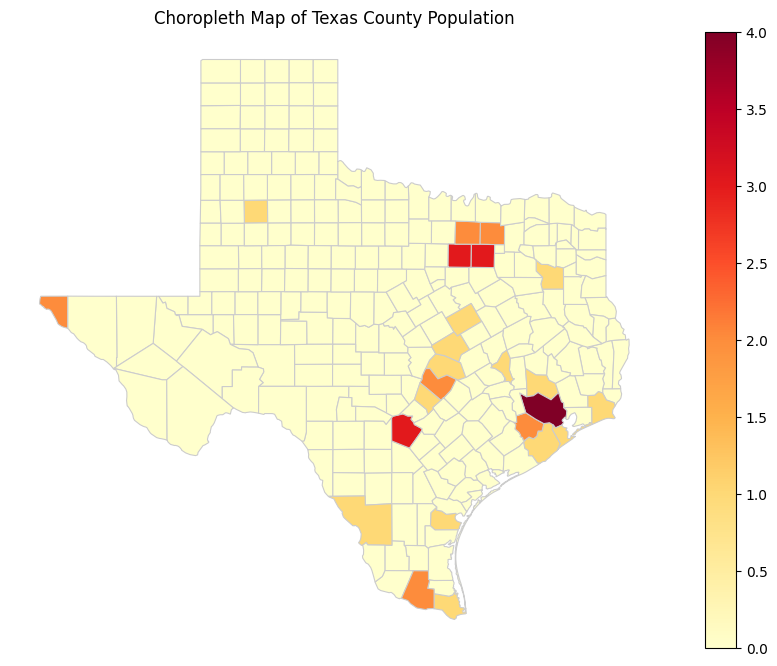

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import requests
from io import StringIO
import mapclassify
import json

# Download Texas county boundaries from TIGER/Line shapefiles
url_texas_counties = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"
texas_counties = gpd.read_file(url_texas_counties)

# Filter the GeoDataFrame for Texas counties (FIPS code starts with '48')
texas_counties = texas_counties[texas_counties["id"].str.startswith("48")]

# Download population data from ACS 5-year estimates
url_acs_population = "https://api.census.gov/data/2019/acs/acs5?get=NAME,B01001_001E&for=county:*&in=state:48"
response = requests.get(url_acs_population)
population_json = json.loads(response.text)
population_data = pd.DataFrame(population_json[1:], columns=population_json[0])
population_data['id'] = population_data['state'] + population_data['county']

# Merge population data with Texas county shapefile
texas_counties = texas_counties.merge(population_data, left_on="id", right_on="id")

# Convert the population column to an integer data type
texas_counties["Population"] = texas_counties["B01001_001E"].astype(int)

# Normalize the population data for better visualization
texas_counties["population_norm"] = texas_counties["Population"] / texas_counties["Population"].max()

# Classify the population data using natural Jenks classification
num_bins = 5
classifier = mapclassify.NaturalBreaks.make(k=num_bins)
texas_counties["population_bins"] = texas_counties[["Population"]].apply(classifier)

# Plot the choropleth map
fig, ax = plt.subplots(1, figsize=(12, 8))
texas_counties.plot(column="population_bins", cmap="YlOrRd", linewidth=0.8, edgecolor="0.8", ax=ax, legend=True)

ax.set_title("Choropleth Map of Texas County Population")
ax.set_axis_off()
plt.show()


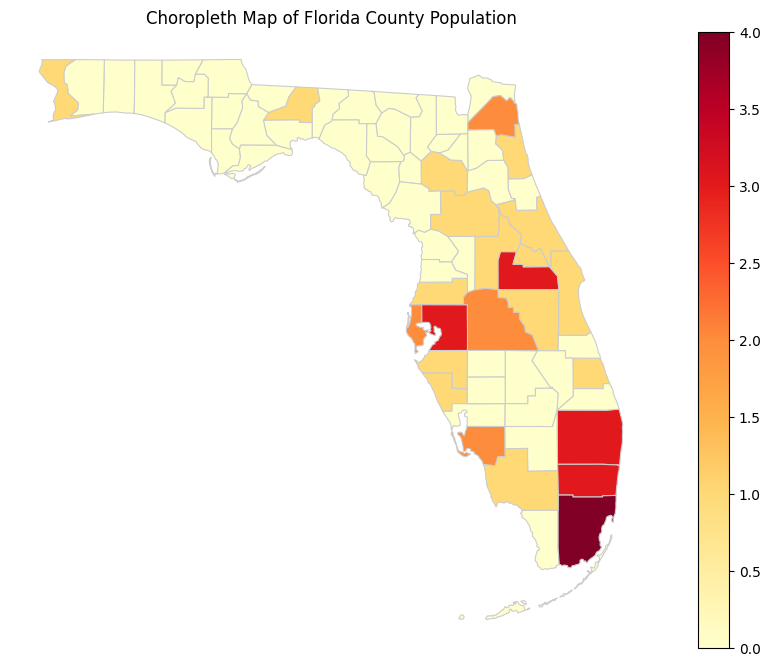

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import requests
from io import StringIO
import mapclassify
import json

# Download Florida county boundaries from TIGER/Line shapefiles
url_florida_counties = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"
florida_counties = gpd.read_file(url_florida_counties)

# Filter the GeoDataFrame for Florida counties (FIPS code starts with '12')
florida_counties = florida_counties[florida_counties["id"].str.startswith("12")]

# Download population data from ACS 5-year estimates
url_acs_population = "https://api.census.gov/data/2019/acs/acs5?get=NAME,B01001_001E&for=county:*&in=state:12"
response = requests.get(url_acs_population)
population_json = json.loads(response.text)
population_data = pd.DataFrame(population_json[1:], columns=population_json[0])
population_data['id'] = population_data['state'] + population_data['county']

# Merge population data with Florida county shapefile
florida_counties = florida_counties.merge(population_data, left_on="id", right_on="id")

# Convert the population column to an integer data type
florida_counties["Population"] = florida_counties["B01001_001E"].astype(int)

# Normalize the population data for better visualization
florida_counties["population_norm"] = florida_counties["Population"] / florida_counties["Population"].max()

# Classify the population data using natural Jenks classification
num_bins = 5
classifier = mapclassify.NaturalBreaks.make(k=num_bins)
florida_counties["population_bins"] = florida_counties[["Population"]].apply(classifier)

# Plot the choropleth map
fig, ax = plt.subplots(1, figsize=(12, 8))
florida_counties.plot(column="population_bins", cmap="YlOrRd", linewidth=0.8, edgecolor="0.8", ax=ax, legend=True)

ax.set_title("Choropleth Map of Florida County Population")
ax.set_axis_off()
plt.show()


In [ ]:
def add_simple_line_arrow(ax, length=0.1, width=0.015, x=0.1, y=0.9):
    ax.annotate('', xy=(x, y), xycoords='axes fraction', xytext=(x, y - length), textcoords='axes fraction',
                arrowprops=dict(facecolor='black', width=width, headwidth=3 * width, headlength=4 * width))

def add_arrow_with_N_label(ax, length=0.1, x=0.1, y=0.9, fontsize=12):
    ax.annotate('', xy=(x, y), xycoords='axes fraction', xytext=(x, y - length), textcoords='axes fraction',
                arrowprops=dict(facecolor='black', edgecolor='black', lw=1))
    ax.text(x, y - length - 0.01, 'N', ha='center', va='center', fontsize=fontsize, transform=ax.transAxes)

def add_arrow_with_north_label(ax, length=0.1, x=0.1, y=0.9, fontsize=12):
    ax.annotate('North', xy=(x, y), xycoords='axes fraction', xytext=(x, y - length), textcoords='axes fraction',
                fontsize=fontsize, ha='center', va='center', bbox=dict(facecolor='white', edgecolor='black', lw=0.7, pad=2),
                arrowprops=dict(facecolor='black', edgecolor='black', lw=0.7))

# Select which north arrow you'd like to use
north_arrow_function = add_arrow_with_north_label  # Change this to the desired function (e.g. add_arrow_with_N_label or add_arrow_with_north_label)

# ... previous code to create Florida county population choropleth map

# Add the chosen north arrow
north_arrow_function(ax)

# Show the map with the north arrow
plt.show()


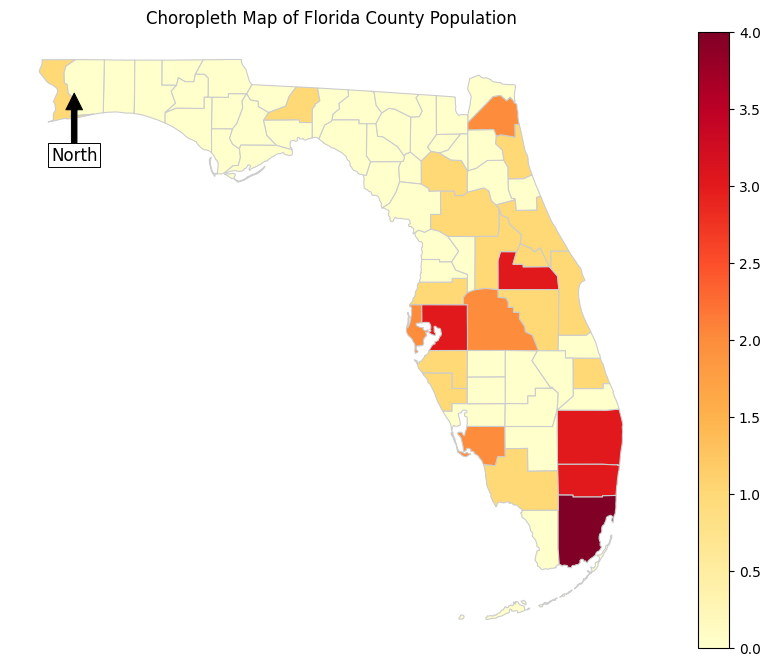

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import requests
from io import StringIO
import mapclassify
import json

# Download Florida county boundaries from TIGER/Line shapefiles
url_florida_counties = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"
florida_counties = gpd.read_file(url_florida_counties)

# Filter the GeoDataFrame for Florida counties (FIPS code starts with '12')
florida_counties = florida_counties[florida_counties["id"].str.startswith("12")]

# Download population data from ACS 5-year estimates
url_acs_population = "https://api.census.gov/data/2019/acs/acs5?get=NAME,B01001_001E&for=county:*&in=state:12"
response = requests.get(url_acs_population)
population_json = json.loads(response.text)
population_data = pd.DataFrame(population_json[1:], columns=population_json[0])
population_data['id'] = population_data['state'] + population_data['county']

# Merge population data with Florida county shapefile
florida_counties = florida_counties.merge(population_data, left_on="id", right_on="id")

# Convert the population column to an integer data type
florida_counties["Population"] = florida_counties["B01001_001E"].astype(int)

# Normalize the population data for better visualization
florida_counties["population_norm"] = florida_counties["Population"] / florida_counties["Population"].max()

# Classify the population data using natural Jenks classification
num_bins = 5
classifier = mapclassify.NaturalBreaks.make(k=num_bins)
florida_counties["population_bins"] = florida_counties[["Population"]].apply(classifier)

# Plot the choropleth map
fig, ax = plt.subplots(1, figsize=(12, 8))
# Select which north arrow you'd like to use
north_arrow_function = add_arrow_with_north_label  # Change this to the desired function (e.g. add_arrow_with_N_label or add_arrow_with_north_label)

# ... previous code to create Florida county population choropleth map

# Add the chosen north arrow
north_arrow_function(ax)
florida_counties.plot(column="population_bins", cmap="YlOrRd", linewidth=0.8, edgecolor="0.8", ax=ax, legend=True)

ax.set_title("Choropleth Map of Florida County Population")
ax.set_axis_off()
plt.show()


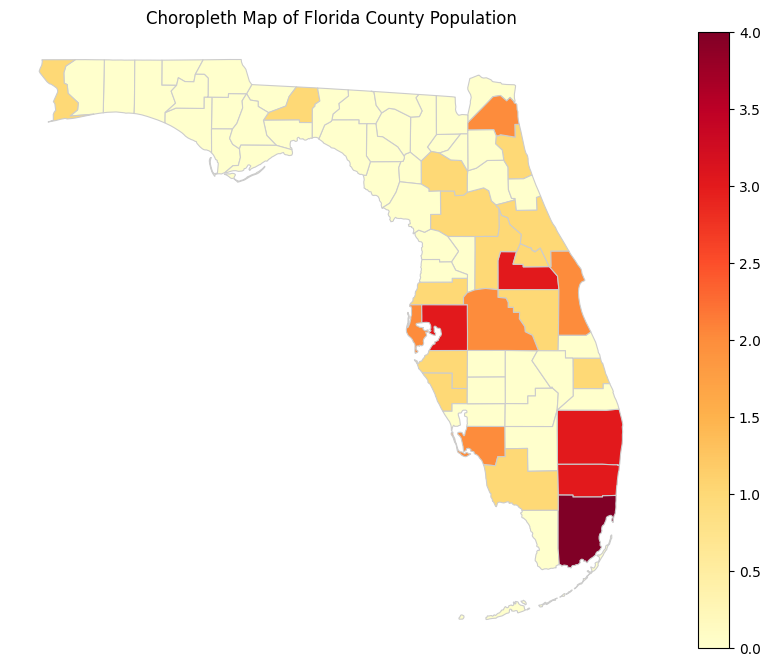

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import requests
from io import StringIO
import mapclassify
import json

# Download Florida county boundaries from TIGER/Line shapefiles
url_florida_counties = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"
florida_counties = gpd.read_file(url_florida_counties)

# Filter the GeoDataFrame for Florida counties (FIPS code starts with '12')
florida_counties = florida_counties[florida_counties["id"].str.startswith("12")]

# Download population data from ACS 5-year estimates
url_acs_population = "https://api.census.gov/data/2019/acs/acs5?get=NAME,B01001_001E&for=county:*&in=state:12"
response = requests.get(url_acs_population)
population_json = json.loads(response.text)
population_data = pd.DataFrame(population_json[1:], columns=population_json[0])
population_data['id'] = population_data['state'] + population_data['county']

# Merge population data with Florida county shapefile
florida_counties = florida_counties.merge(population_data, left_on="id", right_on="id")

# Convert the population column to an integer data type
florida_counties["Population"] = florida_counties["B01001_001E"].astype(int)

# Classify the population data using natural Jenks classification
num_bins = 5
classifier = mapclassify.NaturalBreaks.make(k=num_bins)
florida_counties["population_bins"] = florida_counties[["Population"]].apply(classifier)

# Plot the choropleth map
fig, ax = plt.subplots(1, figsize=(12, 8))
florida_counties.plot(column="population_bins", cmap="YlOrRd", linewidth=0.8, edgecolor="0.8", ax=ax, legend=True)

ax.set_title("Choropleth Map of Florida County Population")
ax.set_axis_off()
plt.show()


#### 1.1.3 Web Map

In [ ]:
import folium

# Create a function to assign colors based on population bins
def get_color(population_bin):
    colors = ['#ffffcc', '#c2e699', '#78c679', '#31a354', '#006837']
    return colors[population_bin]

# Calculate the centroid of Florida for centering the map
florida_centroid = florida_counties.geometry.centroid.unary_union.centroid

# Create a folium map centered on Florida
florida_map = folium.Map(location=[florida_centroid.y, florida_centroid.x], zoom_start=7)

# Create a Choropleth layer
choropleth = folium.Choropleth(
    geo_data=florida_counties.__geo_interface__,
    data=florida_counties,
    columns=["id", "population_bins"],
    key_on="feature.properties.id",
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Population by County",
    bins=num_bins,
    highlight=True,
).add_to(florida_map)

# Add tooltips to show county names and population data
florida_counties["coords"] = florida_counties["geometry"].apply(lambda x: x.representative_point().coords[:][0])
for idx, row in florida_counties.iterrows():
    folium.Marker(
        location=[row.coords[1], row.coords[0]],
        icon=None,
        popup=f"{row['NAME_x']}<br>Population: {row['Population']}",
    ).add_to(florida_map)

# Display the map
florida_map


<ipython-input-4-89e3d180e603>:9: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  florida_centroid = florida_counties.geometry.centroid.unary_union.centroid


In [ ]:
florida_map.save("florida_population_map.html")

In [ ]:
import folium

# Create a function to assign colors based on population bins
def get_color(population_bin):
    colors = ['#ffffcc', '#c2e699', '#78c679', '#31a354', '#006837']
    return colors[population_bin]

# Calculate the centroid of Florida for centering the map
florida_centroid = florida_counties.geometry.centroid.unary_union.centroid

# Create a folium map centered on Florida
florida_map = folium.Map(location=[florida_centroid.y, florida_centroid.x], zoom_start=7)

# Create a Choropleth layer
choropleth = folium.Choropleth(
    geo_data=florida_counties.__geo_interface__,
    data=florida_counties,
    columns=["id", "population_bins"],
    key_on="feature.properties.id",
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Population by County",
    bins=num_bins,
    highlight=True,
).add_to(florida_map)

# Removed the loop to add tooltips and markers
# Display the map
florida_map


<ipython-input-8-9880c8d38459>:9: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  florida_centroid = florida_counties.geometry.centroid.unary_union.centroid


In [ ]:
import folium

# Create a function to assign colors based on population bins
def get_color(population_bin):
    colors = ['#ffffcc', '#c2e699', '#78c679', '#31a354', '#006837']
    return colors[population_bin]

url_florida_counties = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"
florida_counties = gpd.read_file(url_florida_counties)

# Filter the GeoDataFrame for Florida counties (FIPS code starts with '12')
florida_counties = florida_counties[florida_counties["id"].str.startswith("12")]

# Download population data from ACS 5-year estimates
url_acs_population = "https://api.census.gov/data/2019/acs/acs5?get=NAME,B01001_001E&for=county:*&in=state:12"
response = requests.get(url_acs_population)
population_json = json.loads(response.text)
population_data = pd.DataFrame(population_json[1:], columns=population_json[0])
population_data['id'] = population_data['state'] + population_data['county']

# Merge population data with Florida county shapefile
florida_counties = florida_counties.merge(population_data, left_on="id", right_on="id")

# Convert the population column to an integer data type
florida_counties["Population"] = florida_counties["B01001_001E"].astype(int)

# Classify the population data using natural Jenks classification
num_bins = 5
classifier = mapclassify.NaturalBreaks.make(k=num_bins)
florida_counties["population_bins"] = florida_counties[["Population"]].apply(classifier)

# Calculate the centroid of Florida for centering the map
florida_centroid = florida_counties.geometry.centroid.unary_union.centroid

# Create a folium map centered on Florida
florida_map = folium.Map(location=[florida_centroid.y, florida_centroid.x], zoom_start=7)

# Create a Choropleth layer
choropleth = folium.Choropleth(
    geo_data=florida_counties.__geo_interface__,
    data=florida_counties,
    columns=["id", "population_bins"],
    key_on="feature.properties.id",
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Population by County",
    bins=num_bins,
    highlight=True,
).add_to(florida_map)

# Create a GeoJson layer with tooltip
geojson = folium.GeoJson(
    florida_counties,
    style_function=lambda x: {
        "fillColor": get_color(x["properties"]["population_bins"]),
        "fillOpacity": 0.7,
        "color": "black",
        "weight": 0.2,
    },
    tooltip=folium.GeoJsonTooltip(fields=["NAME_x", "Population"], aliases=["County", "Population"], labels=True, sticky=False),
).add_to(florida_map)

# Display the map
florida_map


<ipython-input-14-a55db31471d2>:9: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  florida_centroid = florida_counties.geometry.centroid.unary_union.centroid


In [ ]:
import branca.element as bre

In [ ]:
import folium
import branca

# Create a function to assign colors based on population bins
def get_color(population_bin):
    colors = ['#ffffcc', '#c2e699', '#78c679', '#31a354', '#006837']
    return colors[population_bin]

# Calculate the centroid of Florida for centering the map
florida_centroid = florida_counties.geometry.centroid.unary_union.centroid

# Create a folium map centered on Florida
florida_map = folium.Map(location=[florida_centroid.y, florida_centroid.x], zoom_start=7)

choropleth = folium.Choropleth(
    geo_data=florida_counties.__geo_interface__,
    data=florida_counties,
    columns=["id", "population_bins"],
    key_on="feature.properties.id",
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Population by County",
    bins=num_bins,
    highlight=True,
    control=False,  # Disable the built-in legend
).add_to(florida_map)

# Create a GeoJson layer with tooltip
geojson = folium.GeoJson(
    florida_counties,
    style_function=lambda x: {
        "fillColor": get_color(x["properties"]["population_bins"]),
        "fillOpacity": 0.7,
        "color": "black",
        "weight": 0.2,
    },
    tooltip=folium.GeoJsonTooltip(fields=["NAME_x", "Population"], aliases=["County", "Population"], labels=True, sticky=False),
).add_to(florida_map)

# Display the map
florida_map


<ipython-input-25-7030b947388f>:10: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  florida_centroid = florida_counties.geometry.centroid.unary_union.centroid


In [ ]:
import folium
import branca.element as bre

# Create a function to assign colors based on population bins
def get_color(population_bin):
    colors = ['#ffffcc', '#c2e699', '#78c679', '#31a354', '#006837']
    return colors[population_bin]

# Calculate the centroid of Florida for centering the map
florida_centroid = florida_counties.geometry.centroid.unary_union.centroid

# Create a folium map centered on Florida
florida_map = folium.Map(location=[florida_centroid.y, florida_centroid.x], zoom_start=7)

# Create a GeoJson layer with tooltip and custom style
geojson = folium.GeoJson(
    florida_counties,
    style_function=lambda x: {
        "fillColor": get_color(x["properties"]["population_bins"]),
        "fillOpacity": 0.7,
        "color": "black",
        "weight": 0.2,
    },
    tooltip=folium.GeoJsonTooltip(fields=["NAME_x", "Population"], aliases=["County", "Population"], labels=True, sticky=False),
).add_to(florida_map)

# Create a custom legend
legend_html = """
<div style="position: fixed; bottom: 10px; left: 10px; width: 150px; height: 150px; background-color: white; padding: 10px; border: 2px solid black; z-index: 9999; font-size: 14px;">
    <p><strong>Population</strong></p>
    <div style="background-color: #ffffcc; width: 20px; height: 10px; display: inline-block;"></div> < 1st bin<br>
    <div style="background-color: #c2e699; width: 20px; height: 10px; display: inline-block;"></div> 2nd bin<br>
    <div style="background-color: #78c679; width: 20px; height: 10px; display: inline-block;"></div> 3rd bin<br>
    <div style="background-color: #31a354; width: 20px; height: 10px; display: inline-block;"></div> 4th bin<br>
    <div style="background-color: #006837; width: 20px; height: 10px; display: inline-block;"></div> 5th bin<br>
</div>
"""

# Add the custom legend to the map
florida_map.get_root().html.add_child(bre.Element(legend_html))

# Display the map
florida_map


<ipython-input-27-84fb3e24999e>:10: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  florida_centroid = florida_counties.geometry.centroid.unary_union.centroid


In [ ]:
import folium
import branca.element as bre

# Create a function to assign colors based on population bins
def get_color(population_bin):
    colors = ['#ffffcc', '#c2e699', '#78c679', '#31a354', '#006837']
    return colors[population_bin]

url_florida_counties = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"
florida_counties = gpd.read_file(url_florida_counties)

# Filter the GeoDataFrame for Florida counties (FIPS code starts with '12')
florida_counties = florida_counties[florida_counties["id"].str.startswith("12")]

# Download population data from ACS 5-year estimates
url_acs_population = "https://api.census.gov/data/2019/acs/acs5?get=NAME,B01001_001E&for=county:*&in=state:12"
response = requests.get(url_acs_population)
population_json = json.loads(response.text)
population_data = pd.DataFrame(population_json[1:], columns=population_json[0])
population_data['id'] = population_data['state'] + population_data['county']

# Merge population data with Florida county shapefile
florida_counties = florida_counties.merge(population_data, left_on="id", right_on="id")

# Convert the population column to an integer data type
florida_counties["Population"] = florida_counties["B01001_001E"].astype(int)

# Classify the population data using natural Jenks classification
num_bins = 5
classifier = mc.NaturalBreaks.make(k=num_bins)
florida_counties["population_bins"] = florida_counties[["Population"]].apply(classifier)


# Calculate the centroid of Florida for centering the map
florida_centroid = florida_counties.geometry.centroid.unary_union.centroid

# Create a folium map centered on Florida
florida_map = folium.Map(location=[florida_centroid.y, florida_centroid.x], zoom_start=7)

# Create a GeoJson layer with tooltip and custom style
geojson = folium.GeoJson(
    florida_counties,
    style_function=lambda x: {
        "fillColor": get_color(x["properties"]["population_bins"]),
        "fillOpacity": 0.7,
        "color": "black",
        "weight": 0.2,
    },
    tooltip=folium.GeoJsonTooltip(fields=["NAME_x", "Population"], aliases=["County", "Population"], labels=True, sticky=False),
).add_to(florida_map)

# Create a custom legend
legend_html = """
<div style="position: fixed; bottom: 10px; left: 10px; width: 200px; height: 150px; background-color: white; padding: 10px; border: 2px solid black; z-index: 9999; font-size: 14px;">
    <p><strong>Population</strong></p>
"""

# Add legend labels based on the bins
for i, row in enumerate(bins):
    if i == 0:
        legend_html += f'<div style="background-color: {get_color(i)}; width: 20px; height: 10px; display: inline-block;"></div> < {row:.0f}<br>'
    elif i == len(bins) - 1:
        legend_html += f'<div style="background-color: {get_color(i)}; width: 20px; height: 10px; display: inline-block;"></div> > {bins[i - 1]:.0f}<br>'
    else:
        legend_html += f'<div style="background-color: {get_color(i)}; width: 20px; height: 10px; display: inline-block;"></div> {bins[i - 1]:.0f} - {row:.0f}<br>'

legend_html += "</div>"

# Add the custom legend to the map
florida_map.get_root().html.add_child(bre.Element(legend_html))

# Display the map
florida_map


<ipython-input-22-52bb0d0da653>:35: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  florida_centroid = florida_counties.geometry.centroid.unary_union.centroid


In [ ]:
import folium
import branca.element as bre

# Create a function to assign colors based on population bins
def get_color(population_bin):
    colors = ['#ffffcc', '#c2e699', '#78c679', '#31a354', '#006837']
    return colors[population_bin]

url_florida_counties = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"
florida_counties = gpd.read_file(url_florida_counties)

# Filter the GeoDataFrame for Florida counties (FIPS code starts with '12')
florida_counties = florida_counties[florida_counties["id"].str.startswith("12")]

# Download population data from ACS 5-year estimates
url_acs_population = "https://api.census.gov/data/2019/acs/acs5?get=NAME,B01001_001E&for=county:*&in=state:12"
response = requests.get(url_acs_population)
population_json = json.loads(response.text)
population_data = pd.DataFrame(population_json[1:], columns=population_json[0])
population_data['id'] = population_data['state'] + population_data['county']

# Merge population data with Florida county shapefile
florida_counties = florida_counties.merge(population_data, left_on="id", right_on="id")

# Convert the population column to an integer data type
florida_counties["Population"] = florida_counties["B01001_001E"].astype(int)

# Classify the population data using natural Jenks classification
num_bins = 5
classifier = mc.NaturalBreaks.make(k=num_bins)
florida_counties["population_bins"] = florida_counties[["Population"]].apply(classifier)

# newly added ==============
# URLs for ACS data
url_acs_elderly = "https://api.census.gov/data/2019/acs/acs5?get=NAME,B01001_020E,B01001_021E,B01001_022E,B01001_023E,B01001_024E,B01001_025E,B01001_044E,B01001_045E,B01001_046E,B01001_047E,B01001_048E&for=county:*&in=state:12"
url_acs_hispanic = "https://api.census.gov/data/2019/acs/acs5?get=NAME,B03003_003E&for=county:*&in=state:12"

# Make requests
response_elderly = requests.get(url_acs_elderly)
response_hispanic = requests.get(url_acs_hispanic)

# Load response into DataFrame
elderly_data = pd.DataFrame(json.loads(response_elderly.text)[1:], columns=json.loads(response_elderly.text)[0])
hispanic_data = pd.DataFrame(json.loads(response_hispanic.text)[1:], columns=json.loads(response_hispanic.text)[0])

# Add id column
elderly_data['id'] = elderly_data['state'] + elderly_data['county']
hispanic_data['id'] = hispanic_data['state'] + hispanic_data['county']

# Sum elderly population variables
elderly_data["Elderly_Population"] = elderly_data[["B01001_020E", "B01001_021E", "B01001_022E", "B01001_023E", "B01001_024E",
                                                   "B01001_025E", "B01001_044E", "B01001_045E", "B01001_046E", "B01001_047E", "B01001_048E"]].apply(pd.to_numeric).sum(axis=1).astype(int)

# Merge data into florida_counties DataFrame
florida_counties = florida_counties.merge(elderly_data[['id','Elderly_Population']], left_on="id", right_on="id")
florida_counties = florida_counties.merge(hispanic_data[['id','B03003_003E']], left_on="id", right_on="id")

# Calculate percentages
florida_counties["Percentage_Elderly"] = florida_counties["Elderly_Population"] / florida_counties["Population"] * 100
florida_counties["Percentage_Hispanic"] = florida_counties["B03003_003E"].astype(int) / florida_counties["Population"] * 100
# ============

# Calculate the centroid of Florida for centering the map
florida_centroid = florida_counties.geometry.centroid.unary_union.centroid

# Create a folium map centered on Florida
florida_map = folium.Map(location=[florida_centroid.y, florida_centroid.x], zoom_start=7)

geojson = folium.GeoJson(
    florida_counties,
    style_function=lambda x: {
        "fillColor": get_color(x["properties"]["population_bins"]),
        "fillOpacity": 0.7,
        "color": "black",
        "weight": 0.2,
    },
    tooltip=folium.GeoJsonTooltip(
      fields=["NAME_x", "Population", "Percentage_Elderly", "Percentage_Hispanic"],
      aliases=["County", "Population", "% Elderly", "% Hispanic"],
      labels=True, 
      sticky=False
),
).add_to(florida_map)

# Create a custom legend
legend_html = """
<div style="position: fixed; bottom: 10px; left: 10px; width: 200px; height: 150px; background-color: white; padding: 10px; border: 2px solid black; z-index: 9999; font-size: 14px;">
    <p><strong>Population</strong></p>
"""

# Add legend labels based on the bins
for i, row in enumerate(bins):
    if i == 0:
        legend_html += f'<div style="background-color: {get_color(i)}; width: 20px; height: 10px; display: inline-block;"></div> < {row:.0f}<br>'
    elif i == len(bins) - 1:
        legend_html += f'<div style="background-color: {get_color(i)}; width: 20px; height: 10px; display: inline-block;"></div> > {bins[i - 1]:.0f}<br>'
    else:
        legend_html += f'<div style="background-color: {get_color(i)}; width: 20px; height: 10px; display: inline-block;"></div> {bins[i - 1]:.0f} - {row:.0f}<br>'

legend_html += "</div>"

# Add the custom legend to the map
florida_map.get_root().html.add_child(bre.Element(legend_html))

# Display the map
florida_map


<ipython-input-34-7f249e876e0b>:64: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  florida_centroid = florida_counties.geometry.centroid.unary_union.centroid


In [ ]:
import folium
import branca.element as bre

# Create a function to assign colors based on population bins
def get_color(population_bin):
    colors = ['#ffffcc', '#c2e699', '#78c679', '#31a354', '#006837']
    return colors[population_bin]

url_florida_counties = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"
florida_counties = gpd.read_file(url_florida_counties)

# Filter the GeoDataFrame for Florida counties (FIPS code starts with '12')
florida_counties = florida_counties[florida_counties["id"].str.startswith("12")]

# Download population data from ACS 5-year estimates
url_acs_population = "https://api.census.gov/data/2019/acs/acs5?get=NAME,B01001_001E&for=county:*&in=state:12"
response = requests.get(url_acs_population)
population_json = json.loads(response.text)
population_data = pd.DataFrame(population_json[1:], columns=population_json[0])
population_data['id'] = population_data['state'] + population_data['county']

# Merge population data with Florida county shapefile
florida_counties = florida_counties.merge(population_data, left_on="id", right_on="id")

# Convert the population column to an integer data type
florida_counties["Population"] = florida_counties["B01001_001E"].astype(int)

# Classify the population data using natural Jenks classification
num_bins = 5
classifier = mc.NaturalBreaks.make(k=num_bins)
florida_counties["population_bins"] = florida_counties[["Population"]].apply(classifier)

# newly added ==============
# URLs for ACS data
url_acs_elderly = "https://api.census.gov/data/2019/acs/acs5?get=NAME,B01001_020E,B01001_021E,B01001_022E,B01001_023E,B01001_024E,B01001_025E,B01001_044E,B01001_045E,B01001_046E,B01001_047E,B01001_048E&for=county:*&in=state:12"
url_acs_hispanic = "https://api.census.gov/data/2019/acs/acs5?get=NAME,B03003_003E&for=county:*&in=state:12"

# Make requests
response_elderly = requests.get(url_acs_elderly)
response_hispanic = requests.get(url_acs_hispanic)

# Load response into DataFrame
elderly_data = pd.DataFrame(json.loads(response_elderly.text)[1:], columns=json.loads(response_elderly.text)[0])
hispanic_data = pd.DataFrame(json.loads(response_hispanic.text)[1:], columns=json.loads(response_hispanic.text)[0])

# Add id column
elderly_data['id'] = elderly_data['state'] + elderly_data['county']
hispanic_data['id'] = hispanic_data['state'] + hispanic_data['county']

# Sum elderly population variables
elderly_data["Elderly_Population"] = elderly_data[["B01001_020E", "B01001_021E", "B01001_022E", "B01001_023E", "B01001_024E",
                                                   "B01001_025E", "B01001_044E", "B01001_045E", "B01001_046E", "B01001_047E", "B01001_048E"]].apply(pd.to_numeric).sum(axis=1).astype(int)

# Merge data into florida_counties DataFrame
florida_counties = florida_counties.merge(elderly_data[['id','Elderly_Population']], left_on="id", right_on="id")
florida_counties = florida_counties.merge(hispanic_data[['id','B03003_003E']], left_on="id", right_on="id")

# Calculate percentages and round to 2 decimal places
florida_counties["Percentage_Elderly"] = (florida_counties["Elderly_Population"] / florida_counties["Population"] * 100).round(2)
florida_counties["Percentage_Hispanic"] = (florida_counties["B03003_003E"].astype(int) / florida_counties["Population"] * 100).round(2)
# ============

# Calculate the centroid of Florida for centering the map
florida_centroid = florida_counties.geometry.centroid.unary_union.centroid

# Create a folium map centered on Florida
florida_map = folium.Map(location=[florida_centroid.y, florida_centroid.x], zoom_start=7)

geojson = folium.GeoJson(
    florida_counties,
    style_function=lambda x: {
        "fillColor": get_color(x["properties"]["population_bins"]),
        "fillOpacity": 0.7,
        "color": "black",
        "weight": 0.2,
    },
    tooltip=folium.GeoJsonTooltip(
      fields=["NAME_x", "Population", "Percentage_Elderly", "Percentage_Hispanic"],
      aliases=["County", "Population", "% Elderly", "% Hispanic"],
      labels=True, 
      sticky=False
),
).add_to(florida_map)

# Create a custom legend
legend_html = """
<div style="position: fixed; bottom: 10px; left: 10px; width: 200px; height: 150px; background-color: white; padding: 10px; border: 2px solid black; z-index: 9999; font-size: 14px;">
    <p><strong>Population</strong></p>
"""

# Add legend labels based on the bins
for i, row in enumerate(bins):
    if i == 0:
        legend_html += f'<div style="background-color: {get_color(i)}; width: 20px; height: 10px; display: inline-block;"></div> < {row:.0f}<br>'
    elif i == len(bins) - 1:
        legend_html += f'<div style="background-color: {get_color(i)}; width: 20px; height: 10px; display: inline-block;"></div> > {bins[i - 1]:.0f}<br>'
    else:
        legend_html += f'<div style="background-color: {get_color(i)}; width: 20px; height: 10px; display: inline-block;"></div> {bins[i - 1]:.0f} - {row:.0f}<br>'

legend_html += "</div>"

# Add the custom legend to the map
florida_map.get_root().html.add_child(bre.Element(legend_html))

# Display the map
florida_map


<ipython-input-35-a166dd31185f>:64: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  florida_centroid = florida_counties.geometry.centroid.unary_union.centroid


In [ ]:
florida_counties.columns

Index(['id', 'GEO_ID', 'STATE', 'COUNTY', 'NAME_x', 'LSAD', 'CENSUSAREA',
       'geometry', 'NAME_y', 'B01001_001E', 'state_x', 'county_x',
       'Population', 'population_bins', 'NAME_x', 'B01001_020E', 'B01001_021E',
       'B01001_022E', 'B01001_023E', 'B01001_024E', 'B01001_025E',
       'B01001_044E', 'B01001_045E', 'B01001_046E', 'B01001_047E',
       'B01001_048E', 'state_y', 'county_y', 'Elderly_Population', 'NAME_y',
       'B03003_003E', 'state', 'county', 'Percentage_Elderly',
       'Percentage_Hispanic'],
      dtype='object')

In [ ]:
elderly_data[["B01001_020E", "B01001_021E", "B01001_022E", "B01001_023E", "B01001_024E", "B01001_025E", "B01001_044E", "B01001_045E", "B01001_046E", "B01001_047E", "B01001_048E"]].apply(pd.to_numeric).sum(axis=1).astype(int)


0       4048
1     118881
2       4507
3     126102
4      30952
       ...  
62      9167
63    119317
64      3500
65     48167
66     29698
Length: 67, dtype: int64

In [ ]:
florida_map.save("florida_population_map_v2.html")

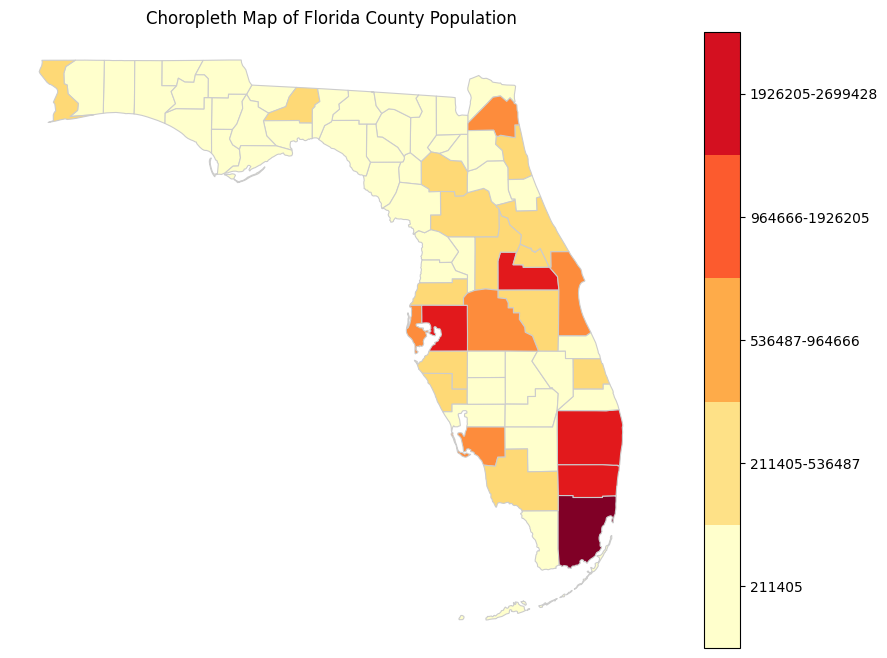

In [ ]:
import numpy as np
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import requests
import mapclassify
import json
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Download Florida county boundaries from TIGER/Line shapefiles
url_florida_counties = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"
florida_counties = gpd.read_file(url_florida_counties)

# Filter the GeoDataFrame for Florida counties (FIPS code starts with '12')
florida_counties = florida_counties[florida_counties["id"].str.startswith("12")]

# Download population data from ACS 5-year estimates
url_acs_population = "https://api.census.gov/data/2019/acs/acs5?get=NAME,B01001_001E&for=county:*&in=state:12"
response = requests.get(url_acs_population)
population_json = json.loads(response.text)
population_data = pd.DataFrame(population_json[1:], columns=population_json[0])
population_data['id'] = population_data['state'] + population_data['county']

# Merge population data with Florida county shapefile
florida_counties = florida_counties.merge(population_data, left_on="id", right_on="id")

# Convert the population column to an integer data type
florida_counties["Population"] = florida_counties["B01001_001E"].astype(int)

# Classify the population data using natural Jenks classification
num_bins = 5
classifier = mapclassify.NaturalBreaks(y=florida_counties["Population"], k=num_bins)
florida_counties["population_bins"] = florida_counties[["Population"]].apply(classifier)

# Plot the choropleth map
fig, ax = plt.subplots(1, figsize=(12, 8))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
florida_counties.plot(column="population_bins", cmap="YlOrRd", linewidth=0.8, edgecolor="0.8", ax=ax)

# Create discrete legend items
legend_labels = []
for i, row in enumerate(classifier.bins):
    if i == 0:
        legend_labels.append(f"{row:.0f}")
    else:
        legend_labels.append(f"{classifier.bins[i-1]:.0f}-{row:.0f}")
legend_labels.append(f"{classifier.bins[-1]:.0f}+")

# Plot the legend
cmap = plt.cm.YlOrRd
bounds = np.arange(-0.5, num_bins + 0.5, 1)
norm = plt.Normalize(0, num_bins)
sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cb = plt.colorbar(sm, cax=cax, ticks=np.arange(0, num_bins+1), boundaries=bounds)
cb.set_ticklabels(legend_labels)

ax.set_title("Choropleth Map of Florida County Population")
ax.set_axis_off()
plt.show()


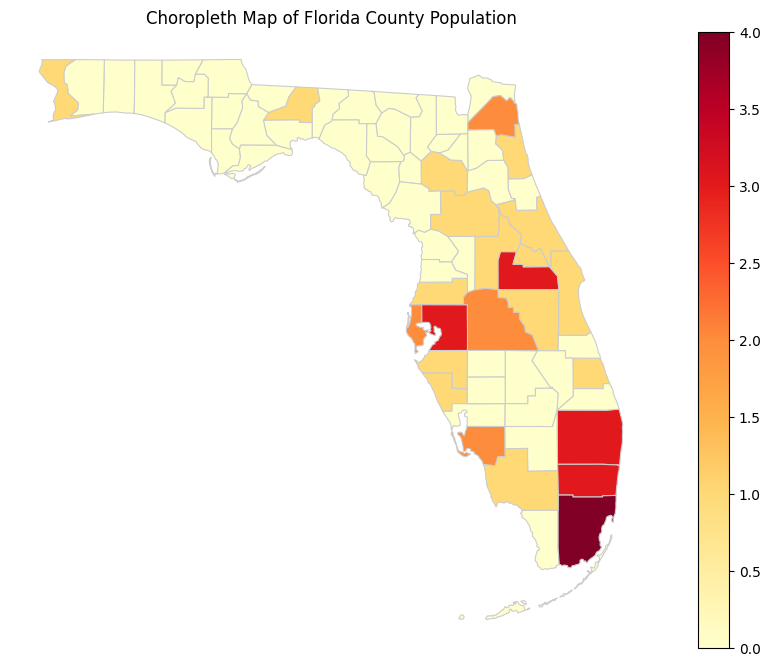

In [ ]:
# ... (previous code for loading and processing data remains the same)
import geopandas as gpd
import pandas as pd
import requests
from io import StringIO
import json
import mapclassify as mc
from splot.mapping import vba_choropleth
import numpy as np
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import requests
import json
from mpl_toolkits.axes_grid1 import make_axes_locatable


# ... (previous code for loading and processing data remains the same)
# Download Florida county boundaries from TIGER/Line shapefiles
url_florida_counties = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"
florida_counties = gpd.read_file(url_florida_counties)

# Filter the GeoDataFrame for Florida counties (FIPS code starts with '12')
florida_counties = florida_counties[florida_counties["id"].str.startswith("12")]

# Download population data from ACS 5-year estimates
url_acs_population = "https://api.census.gov/data/2019/acs/acs5?get=NAME,B01001_001E&for=county:*&in=state:12"
response = requests.get(url_acs_population)
population_json = json.loads(response.text)
population_data = pd.DataFrame(population_json[1:], columns=population_json[0])
population_data['id'] = population_data['state'] + population_data['county']

# Merge population data with Florida county shapefile
florida_counties = florida_counties.merge(population_data, left_on="id", right_on="id")

# Convert the population column to an integer data type
florida_counties["Population"] = florida_counties["B01001_001E"].astype(int)

# Classify the population data using natural Jenks classification
classifier = mc.NaturalBreaks.make(k=num_bins)
florida_counties["population_bins"] = florida_counties[["Population"]].apply(classifier)

# Plot the choropleth map
fig, ax = plt.subplots(1, figsize=(12, 8))
florida_counties.plot(column="population_bins", cmap="YlOrRd", linewidth=0.8, edgecolor="0.8", ax=ax, legend=True)
ax.set_title("Choropleth Map of Florida County Population")
ax.set_axis_off()
plt.show()

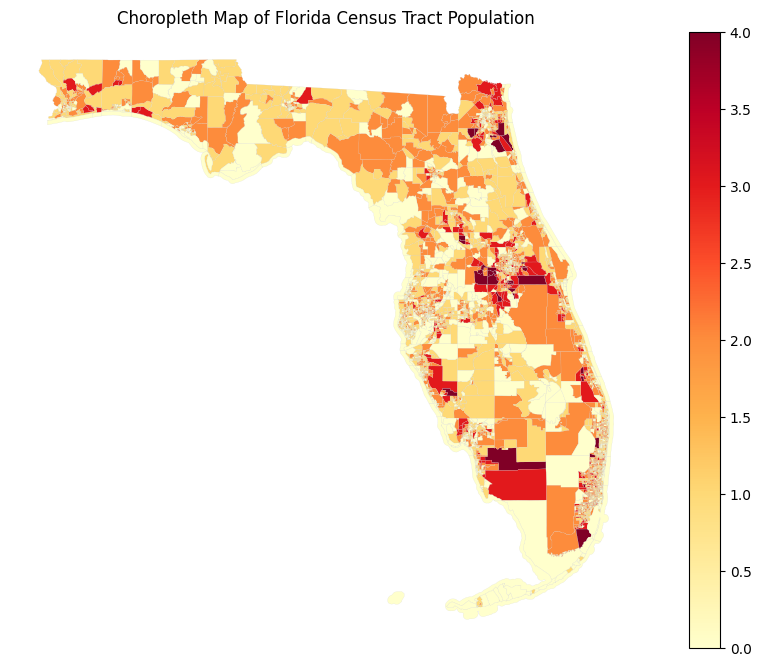

In [ ]:
import geopandas as gpd
import pandas as pd
import requests
from io import StringIO
import json
import mapclassify as mc
import matplotlib.pyplot as plt

# Download Florida census tract boundaries from TIGER/Line shapefiles
url_florida_tracts = "https://www2.census.gov/geo/tiger/TIGER2019/TRACT/tl_2019_12_tract.zip"
florida_tracts = gpd.read_file(url_florida_tracts)

# Download population data from ACS 5-year estimates
url_acs_population = "https://api.census.gov/data/2019/acs/acs5?get=NAME,B01001_001E&for=tract:*&in=state:12"
response = requests.get(url_acs_population)
population_json = json.loads(response.text)
population_data = pd.DataFrame(population_json[1:], columns=population_json[0])
population_data['GEOID'] = population_data['state'] + population_data['county'] + population_data['tract']

# Merge population data with Florida census tract shapefile
florida_tracts = florida_tracts.merge(population_data, left_on="GEOID", right_on="GEOID")

# Convert the population column to an integer data type
florida_tracts["Population"] = florida_tracts["B01001_001E"].astype(int)

# Classify the population data using natural Jenks classification
num_bins = 5
classifier = mc.NaturalBreaks.make(k=num_bins)
florida_tracts["population_bins"] = florida_tracts[["Population"]].apply(classifier)

# Plot the choropleth map
fig, ax = plt.subplots(1, figsize=(12, 8))
florida_tracts.plot(column="population_bins", cmap="YlOrRd", linewidth=0.1, edgecolor="0.8", ax=ax, legend=True)
ax.set_title("Choropleth Map of Florida Census Tract Population")
ax.set_axis_off()
plt.show()


In [ ]:
# ... (previous code for loading and processing data remains the same)
from splot.mapping import vba_choropleth
import numpy as np
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import requests
import json
from mpl_toolkits.axes_grid1 import make_axes_locatable
import geopandas as gpd
import pandas as pd
import requests
from io import StringIO
import json
import mapclassify as mc
import matplotlib.pyplot as plt
from cartogram import Cartogram


# ... (previous code for loading and processing data remains the same)
# Download Florida county boundaries from TIGER/Line shapefiles
url_florida_counties = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"
florida_counties = gpd.read_file(url_florida_counties)

# Filter the GeoDataFrame for Florida counties (FIPS code starts with '12')
florida_counties = florida_counties[florida_counties["id"].str.startswith("12")]

# Download population data from ACS 5-year estimates
url_acs_population = "https://api.census.gov/data/2019/acs/acs5?get=NAME,B01001_001E&for=county:*&in=state:12"
response = requests.get(url_acs_population)
population_json = json.loads(response.text)
population_data = pd.DataFrame(population_json[1:], columns=population_json[0])
population_data['id'] = population_data['state'] + population_data['county']

# Merge population data with Florida county shapefile
florida_counties = florida_counties.merge(population_data, left_on="id", right_on="id")

# Convert the population column to an integer data type
florida_counties["Population"] = florida_counties["B01001_001E"].astype(int)

# Create a cartogram based on the population data
cartogram = Cartogram(florida_counties, "Population", affine_only=True)
florida_counties_cartogram = cartogram.generate()

# Classify the population data using natural Jenks classification
num_bins = 5
classifier = mc.NaturalBreaks.make(k=num_bins)
florida_counties_cartogram["population_bins"] = florida_counties_cartogram[["Population"]].apply(classifier)

# Plot the cartogram map
fig, ax = plt.subplots(1, figsize=(12, 8))
florida_counties_cartogram.plot(column="population_bins", cmap="YlOrRd", linewidth=0.8, edgecolor="0.8", ax=ax, legend=True)
ax.set_title("Cartogram Map of Florida County Population")
ax.set_axis_off()
plt.show()


ModuleNotFoundError: ignored

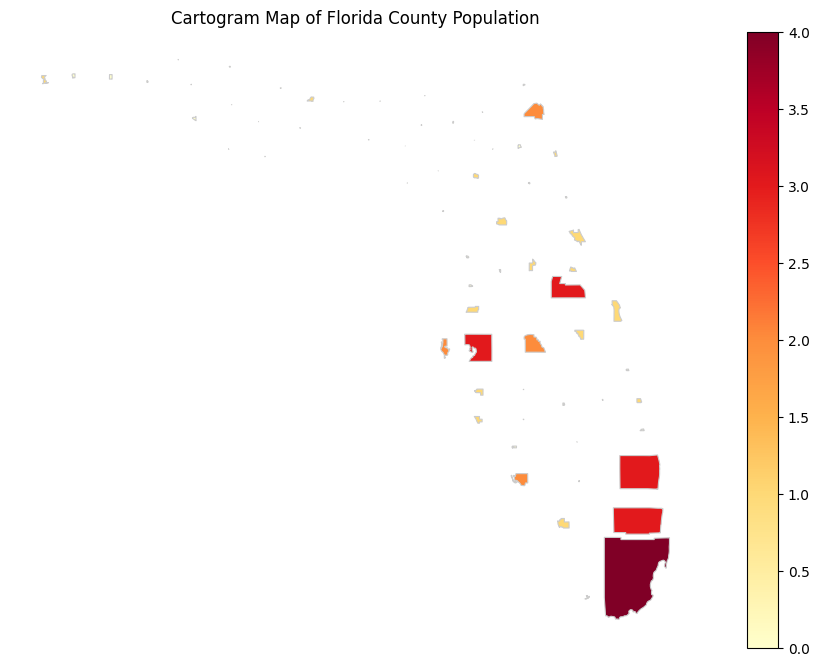

In [ ]:
import geopandas as gpd
import pandas as pd
import requests
from io import StringIO
import json
import mapclassify as mc
import matplotlib.pyplot as plt
from scipy.ndimage import zoom
from shapely.affinity import scale

# ... (previous code for loading and processing data remains the same)

# ... (previous code for loading and processing data remains the same)
# Download Florida county boundaries from TIGER/Line shapefiles
url_florida_counties = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"
florida_counties = gpd.read_file(url_florida_counties)

# Filter the GeoDataFrame for Florida counties (FIPS code starts with '12')
florida_counties = florida_counties[florida_counties["id"].str.startswith("12")]

# Download population data from ACS 5-year estimates
url_acs_population = "https://api.census.gov/data/2019/acs/acs5?get=NAME,B01001_001E&for=county:*&in=state:12"
response = requests.get(url_acs_population)
population_json = json.loads(response.text)
population_data = pd.DataFrame(population_json[1:], columns=population_json[0])
population_data['id'] = population_data['state'] + population_data['county']

# Merge population data with Florida county shapefile
florida_counties = florida_counties.merge(population_data, left_on="id", right_on="id")

# Convert the population column to an integer data type
florida_counties["Population"] = florida_counties["B01001_001E"].astype(int)

# Define a function to scale each county geometry according to its population
def scale_polygon(polygon, scale_factor):
    centroid = polygon.centroid
    scaled_polygon = scale(polygon, xfact=scale_factor, yfact=scale_factor, origin=centroid)
    return scaled_polygon

# Normalize the population data and scale geometries
max_population = florida_counties["Population"].max()
florida_counties["population_norm"] = florida_counties["Population"] / max_population
florida_counties["geometry"] = florida_counties.apply(lambda row: scale_polygon(row["geometry"], row["population_norm"]), axis=1)

# Classify the population data using natural Jenks classification
num_bins = 5
classifier = mc.NaturalBreaks.make(k=num_bins)
florida_counties["population_bins"] = florida_counties[["Population"]].apply(classifier)

# Plot the cartogram map
fig, ax = plt.subplots(1, figsize=(12, 8))
florida_counties.plot(column="population_bins", cmap="YlOrRd", linewidth=0.8, edgecolor="0.8", ax=ax, legend=True)
ax.set_title("Cartogram Map of Florida County Population")
ax.set_axis_off()
plt.show()


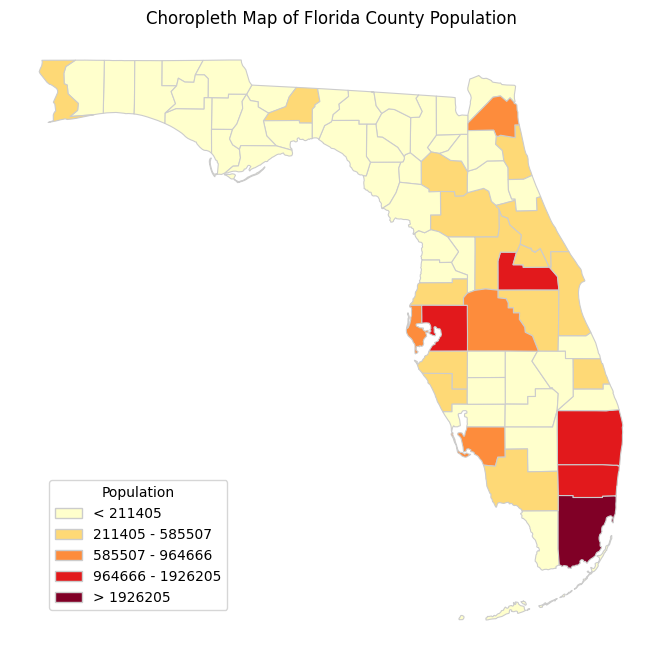

In [ ]:
import geopandas as gpd
import pandas as pd
import requests
from io import StringIO
import json
import mapclassify as mc
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# ... (previous code for loading and processing data remains the same)
url_florida_counties = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"
florida_counties = gpd.read_file(url_florida_counties)

# Filter the GeoDataFrame for Florida counties (FIPS code starts with '12')
florida_counties = florida_counties[florida_counties["id"].str.startswith("12")]

# Download population data from ACS 5-year estimates
url_acs_population = "https://api.census.gov/data/2019/acs/acs5?get=NAME,B01001_001E&for=county:*&in=state:12"
response = requests.get(url_acs_population)
population_json = json.loads(response.text)
population_data = pd.DataFrame(population_json[1:], columns=population_json[0])
population_data['id'] = population_data['state'] + population_data['county']

# Merge population data with Florida county shapefile
florida_counties = florida_counties.merge(population_data, left_on="id", right_on="id")

# Convert the population column to an integer data type
florida_counties["Population"] = florida_counties["B01001_001E"].astype(int)

# Classify the population data using natural Jenks classification
num_bins = 5
classifier = mc.NaturalBreaks.make(k=num_bins)
florida_counties["population_bins"] = florida_counties[["Population"]].apply(classifier)

# Plot the choropleth map
fig, ax = plt.subplots(1, figsize=(12, 8))
florida_counties.plot(column="population_bins", cmap="YlOrRd", linewidth=0.8, edgecolor="0.8", ax=ax)

ax.set_title("Choropleth Map of Florida County Population")
ax.set_axis_off()

# Create discrete legend items
legend_labels = []
bins = mc.NaturalBreaks(florida_counties[["Population"]], num_bins).bins
for i, row in enumerate(bins):
    if i == 0:
        legend_labels.append(f"< {row:.0f}")
    elif i == len(bins) - 1:
        legend_labels.append(f"> {bins[i - 1]:.0f}")
    else:
        legend_labels.append(f"{bins[i - 1]:.0f} - {row:.0f}")
    
# Create a list of legend patches and their corresponding labels
legend_patches = [Patch(facecolor=color, edgecolor="0.8") for color in plt.cm.YlOrRd(np.linspace(0, 1, num_bins))]
legend = ax.legend(legend_patches, legend_labels, title="Population", loc="lower left", bbox_to_anchor=(0.05, 0.05), fontsize=10)

plt.show()


In [ ]:
population_data.columns

Index(['NAME', 'POP', 'state'], dtype='object')

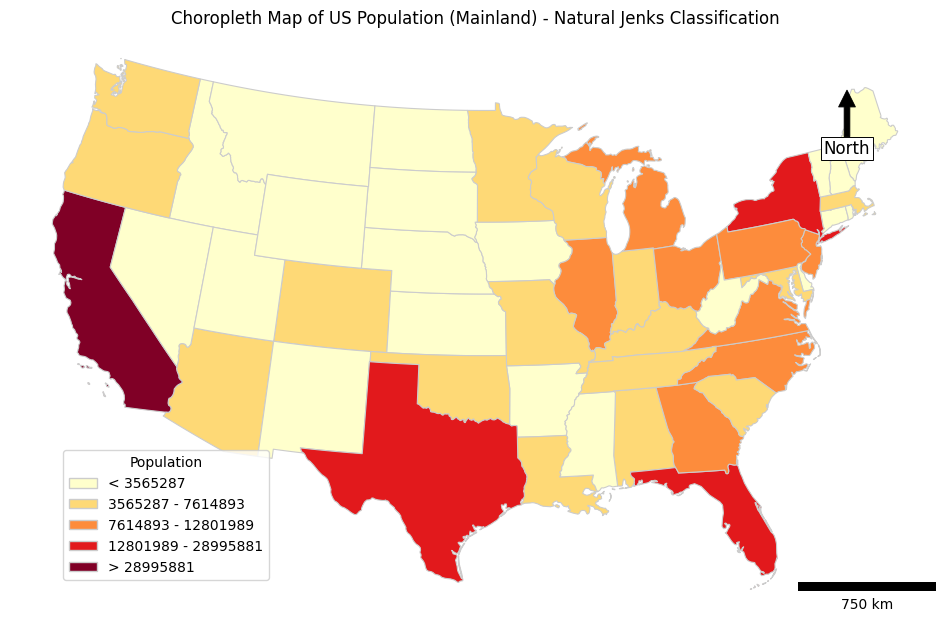

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import requests
import json
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib_scalebar.scalebar import ScaleBar
import mapclassify
from matplotlib.patches import Patch

# Function to add a north arrow
def add_arrow_with_north_label(ax, length=0.1, x=0.9, y=0.9, fontsize=12):
    ax.annotate('North', xy=(x, y), xycoords='axes fraction', xytext=(x, y - length), textcoords='axes fraction',
                fontsize=fontsize, ha='center', va='center', bbox=dict(facecolor='white', edgecolor='black', lw=0.7, pad=2),
                arrowprops=dict(facecolor='black', edgecolor='black', lw=0.7))

# Download the US states shapefile (GeoJSON)
url_shapefile = "https://raw.githubusercontent.com/nvkelso/natural-earth-vector/master/geojson/ne_50m_admin_1_states_provinces_lakes.geojson"
states_shapefile = gpd.read_file(url_shapefile)

# Filter the shapefile to US states only
states_shapefile = states_shapefile[states_shapefile["iso_a2"] == "US"]

# Remove non-mainland states and territories
non_mainland_states = ["Alaska", "Hawaii", "Puerto Rico", "Guam", "Northern Mariana Islands", "U.S. Virgin Islands", "American Samoa"]
states_shapefile = states_shapefile[~states_shapefile["name"].isin(non_mainland_states)]

# Download US population data
url_population = "https://api.census.gov/data/2019/pep/population?get=NAME,POP&for=state:*"
response = requests.get(url_population)
population_json = json.loads(response.text)

# Convert JSON data to a DataFrame
population_data = pd.DataFrame(population_json[1:], columns=population_json[0])

# Convert the population column to an integer data type
population_data['POP'] = population_data['POP'].astype(int)

# Convert the state_code column to an object data type
population_data['NAME'] = population_data['NAME'].astype(str)

# Merge the population data with the states shapefile
states_shapefile = states_shapefile.merge(population_data, left_on="name", right_on="NAME")

# Normalize the population data for better visualization
states_shapefile["population_norm"] = states_shapefile["POP"] / states_shapefile["POP"].max()

# Remove invalid geometries
states_shapefile = states_shapefile.dropna(subset=['geometry'])

# Reproject the shapefile to the Albers Equal Area projection
states_shapefile = states_shapefile.to_crs("EPSG:5070")

# Define the number of bins for classification
num_bins = 5

# Classify the population data using natural Jenks classification
classifier = mapclassify.NaturalBreaks.make(k=num_bins)
states_shapefile["population_bins"] = states_shapefile[["POP"]].apply(classifier)

# Plot the choropleth map
fig, ax = plt.subplots(1, figsize=(12, 8))
states_shapefile.plot(column="population_bins", cmap="YlOrRd", linewidth=0.8, edgecolor="0.8", ax=ax)

ax.set_title("Choropleth Map of US Population (Mainland) - Natural Jenks Classification")
ax.set_axis_off()

# Create discrete legend items
legend_labels = []
bins = mc.NaturalBreaks(population_data[["POP"]], num_bins).bins
for i, row in enumerate(bins):
    if i == 0:
        legend_labels.append(f"< {row:.0f}")
    elif i == len(bins) - 1:
        legend_labels.append(f"> {bins[i - 1]:.0f}")
    else:
        legend_labels.append(f"{bins[i - 1]:.0f} - {row:.0f}")
        
# Add scale bar
scalebar = ScaleBar(1, units='m', location='lower right', length_fraction=0.15, height_fraction=0.015, pad=0.2)
ax.add_artist(scalebar)

# Create a list of legend patches and their corresponding labels
legend_patches = [Patch(facecolor=color, edgecolor="0.8") for color in plt.cm.YlOrRd(np.linspace(0, 1, num_bins))]
legend = ax.legend(legend_patches, legend_labels, title="Population", loc="lower left", bbox_to_anchor=(0.05, 0.05), fontsize=10)
add_arrow_with_north_label(ax)

plt.show()


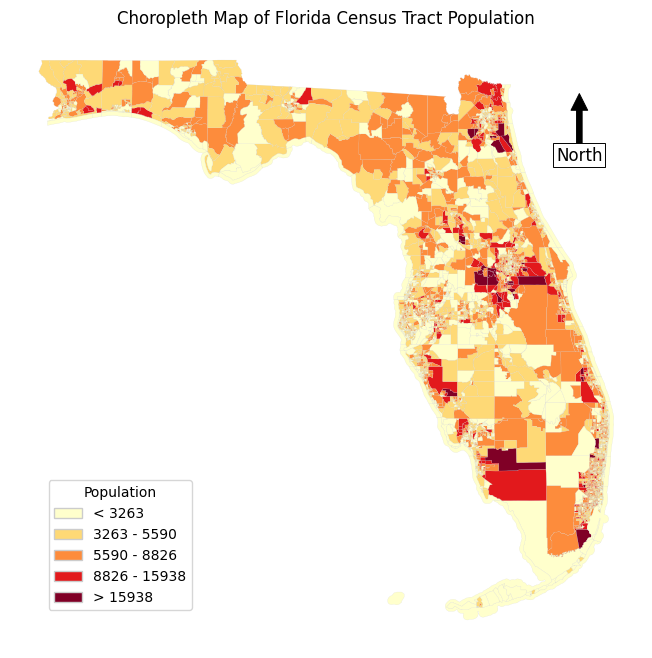

In [ ]:
import geopandas as gpd
import pandas as pd
import requests
from io import StringIO
import json
import mapclassify as mc
import matplotlib.pyplot as plt

# Download Florida census tract boundaries from TIGER/Line shapefiles
url_florida_tracts = "https://www2.census.gov/geo/tiger/TIGER2019/TRACT/tl_2019_12_tract.zip"
florida_tracts = gpd.read_file(url_florida_tracts)

# Download population data from ACS 5-year estimates
url_acs_population = "https://api.census.gov/data/2019/acs/acs5?get=NAME,B01001_001E&for=tract:*&in=state:12"
response = requests.get(url_acs_population)
population_json = json.loads(response.text)
population_data = pd.DataFrame(population_json[1:], columns=population_json[0])
population_data['GEOID'] = population_data['state'] + population_data['county'] + population_data['tract']

# Merge population data with Florida census tract shapefile
florida_tracts = florida_tracts.merge(population_data, left_on="GEOID", right_on="GEOID")

# Convert the population column to an integer data type
florida_tracts["Population"] = florida_tracts["B01001_001E"].astype(int)

# Classify the population data using natural Jenks classification
num_bins = 5
classifier = mc.NaturalBreaks.make(k=num_bins)
florida_tracts["population_bins"] = florida_tracts[["Population"]].apply(classifier)

# Plot the choropleth map
fig, ax = plt.subplots(1, figsize=(12, 8))
florida_tracts.plot(column="population_bins", cmap="YlOrRd", linewidth=0.1, edgecolor="0.8", ax=ax, legend=False)
ax.set_title("Choropleth Map of Florida Census Tract Population")
ax.set_axis_off()

# Create discrete legend items
legend_labels = []
bins = mc.NaturalBreaks(florida_tracts[["Population"]], num_bins).bins
for i, row in enumerate(bins):
    if i == 0:
        legend_labels.append(f"< {row:.0f}")
    elif i == len(bins) - 1:
        legend_labels.append(f"> {bins[i - 1]:.0f}")
    else:
        legend_labels.append(f"{bins[i - 1]:.0f} - {row:.0f}")
        
# Add scale bar
#scalebar = ScaleBar(1, units='m', location='lower right', length_fraction=0.15, height_fraction=0.015, pad=0.2,)
#ax.add_artist(scalebar)

# Create a list of legend patches and their corresponding labels
legend_patches = [Patch(facecolor=color, edgecolor="0.8") for color in plt.cm.YlOrRd(np.linspace(0, 1, num_bins))]
legend = ax.legend(legend_patches, legend_labels, title="Population", loc="lower left", bbox_to_anchor=(0.05, 0.05), fontsize=10)
add_arrow_with_north_label(ax)

plt.show()


In [ ]:
us_counties.head()

,id,GEO_ID,STATE,COUNTY,NAME_x,LSAD,CENSUSAREA,geometry,NAME_y,B01001_001E,state,county,Population
0,01001,0500000US01001,01,001,Autauga,County,594.436,"POLYGON ((-86.49677 32.34444, -86.71790 32.402...","Autauga County, Alabama",55380,01,001,55380
1,01009,0500000US01009,01,009,Blount,County,644.776,"POLYGON ((-86.57780 33.76532, -86.75914 33.840...","Blount County, Alabama",57681,01,009,57681
2,01017,0500000US01017,01,017,Chambers,County,596.531,"POLYGON ((-85.18413 32.87053, -85.12342 32.772...","Chambers County, Alabama",33660,01,017,33660
3,01021,0500000US01021,01,021,Chilton,County,692.854,"POLYGON ((-86.51734 33.02057, -86.51596 32.929...","Chilton County, Alabama",44055,01,021,44055
4,01033,0500000US01033,01,033,Colbert,County,592.619,"POLYGON ((-88.13999 34.58170, -88.13925 34.587...","Colbert County, Alabama",54771,01,033,54771


#### 1.1.4 Batch Map

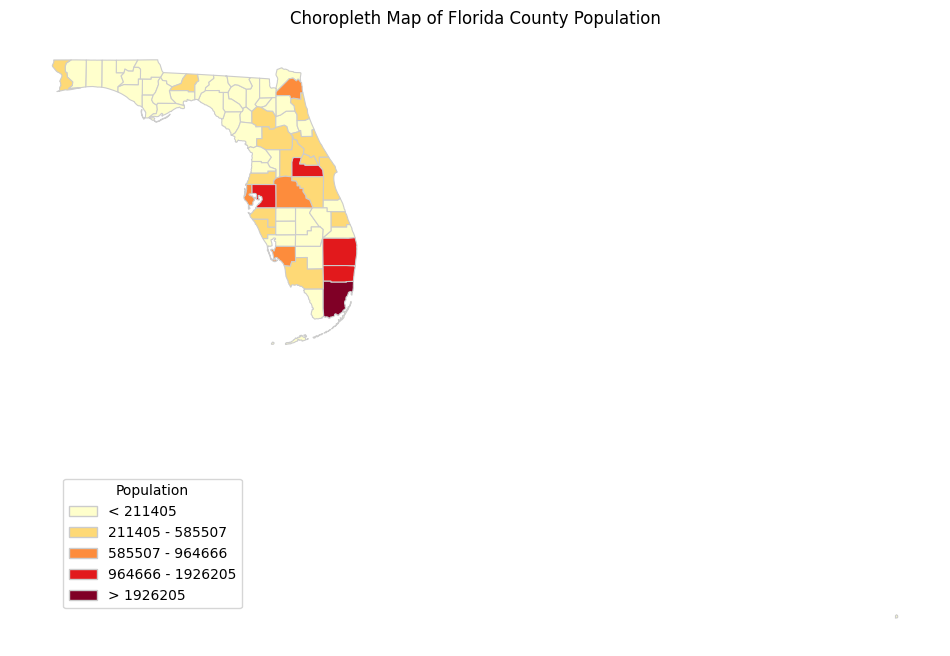

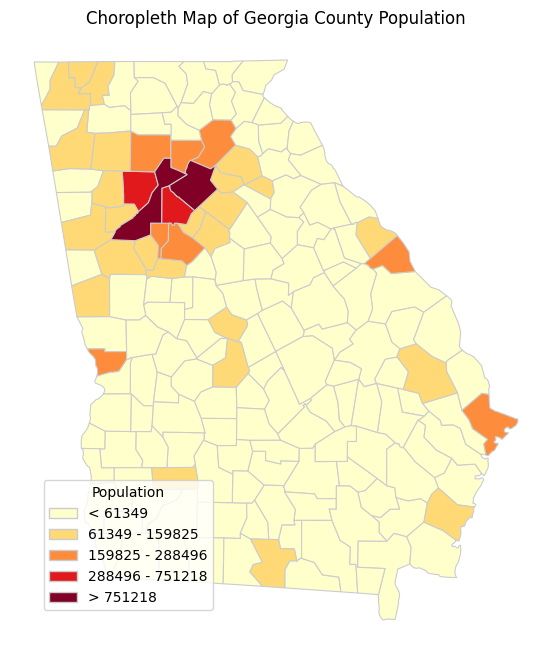

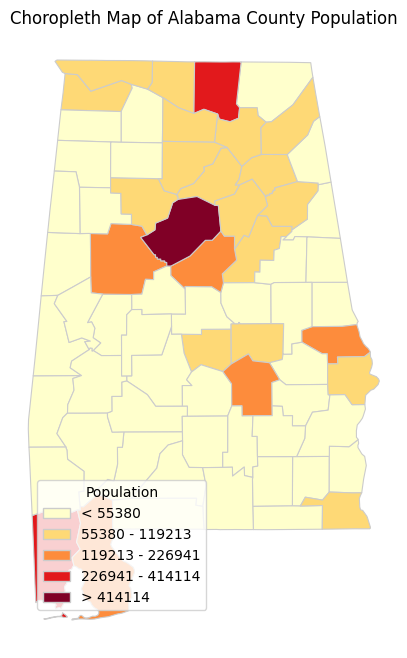

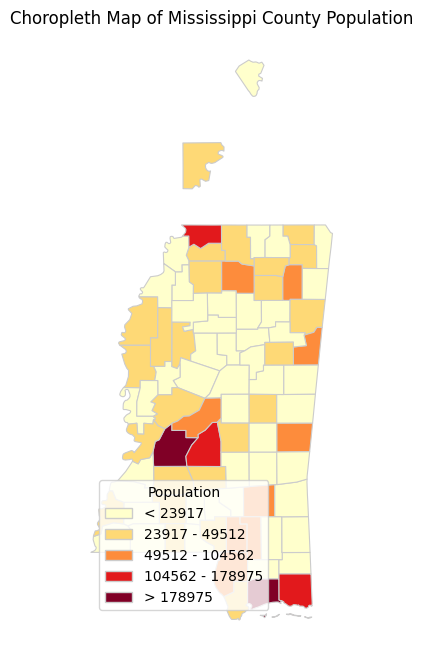

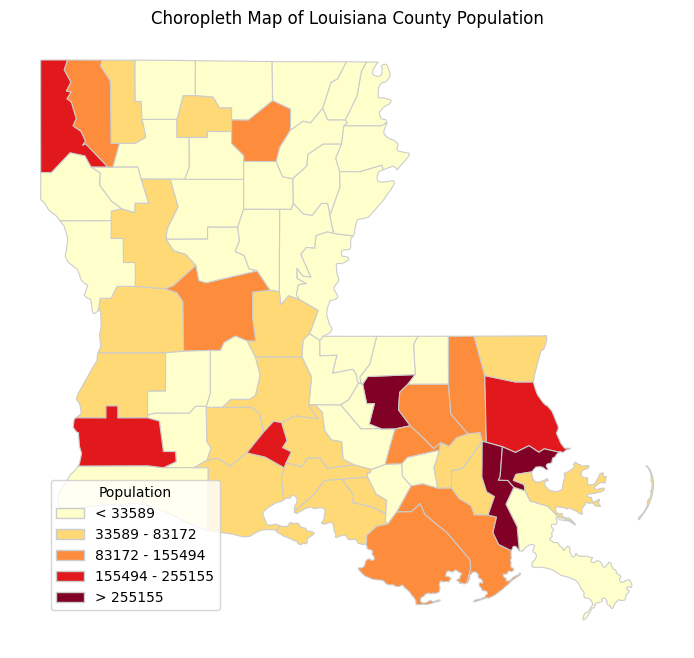

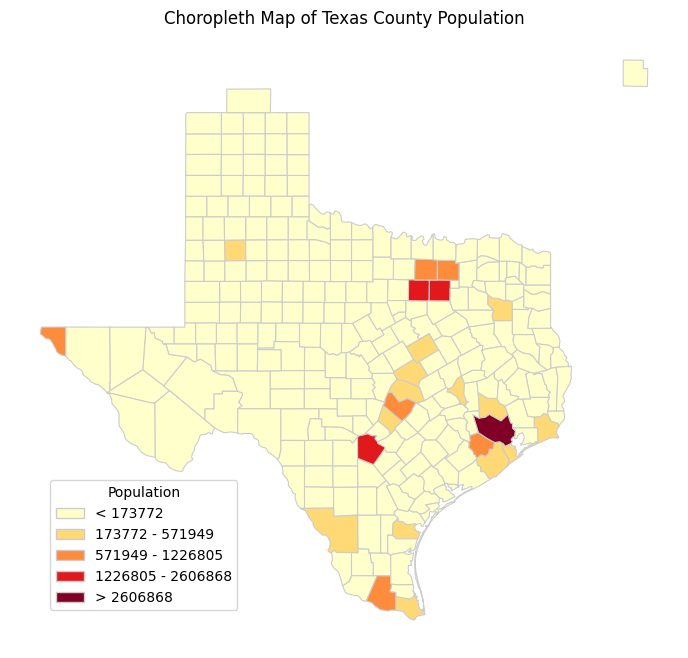

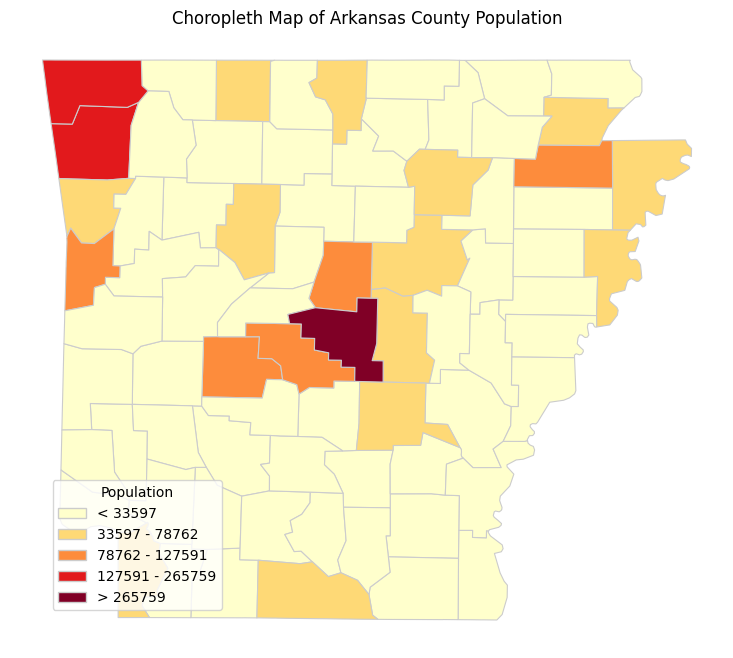

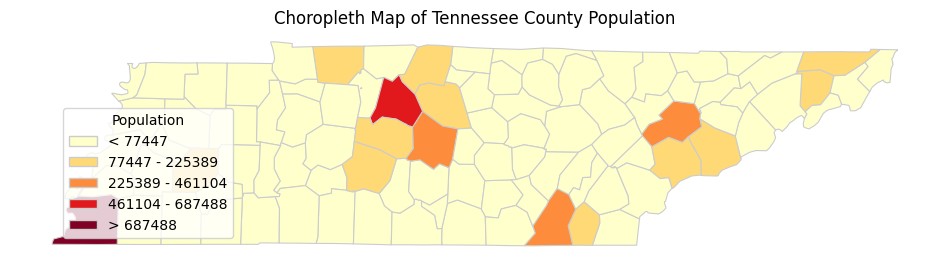

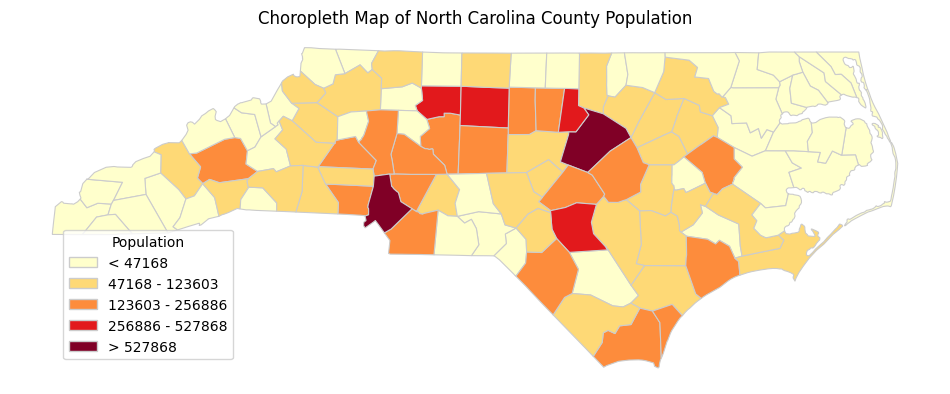

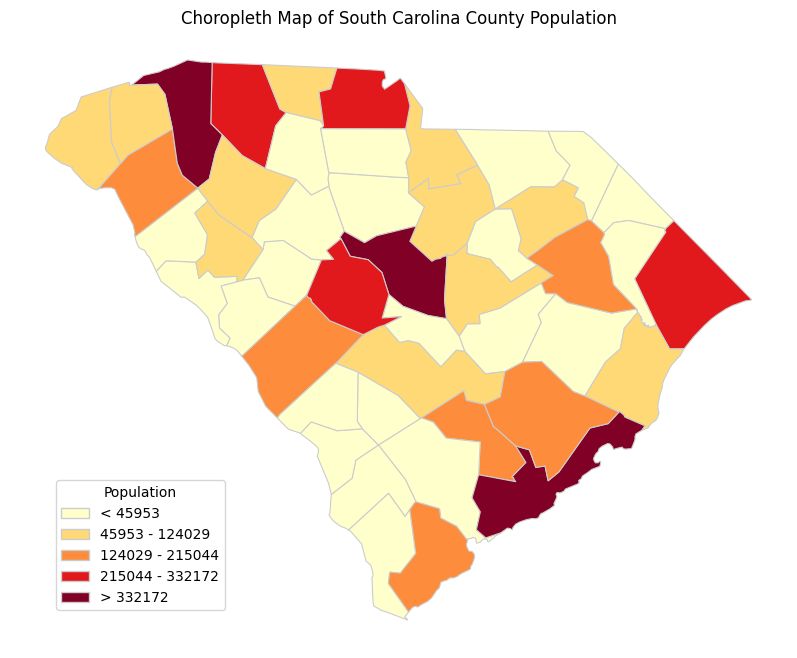

In [ ]:
import geopandas as gpd
import pandas as pd
import requests
from io import StringIO
import json
import mapclassify as mc
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import numpy as np

# Define the southern states
southern_states = ["Florida", "Georgia", "Alabama", "Mississippi", "Louisiana", "Texas", "Arkansas", "Tennessee", "North Carolina", "South Carolina"]

# Download the US counties GeoJSON
url_us_counties = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"
us_counties = gpd.read_file(url_us_counties)

# Download the ACS population data
url_acs_population = "https://api.census.gov/data/2019/acs/acs5?get=NAME,B01001_001E&for=county:*"
response = requests.get(url_acs_population)
population_json = json.loads(response.text)
population_data = pd.DataFrame(population_json[1:], columns=population_json[0])
population_data['id'] = population_data['state'] + population_data['county']

# Merge the population data with the counties shapefile
us_counties = us_counties.merge(population_data, left_on="id", right_on="id")
us_counties["Population"] = us_counties["B01001_001E"].astype(int)

# Loop through each southern state
for state_name in southern_states:
    state_counties = us_counties[us_counties["NAME_y"].str.contains(state_name)].copy()

    # Classify the population data using natural Jenks classification
    num_bins = 5
    classifier = mc.NaturalBreaks.make(k=num_bins)
    state_counties["population_bins"] = state_counties[["Population"]].apply(classifier)

    # Plot the choropleth map
    fig, ax = plt.subplots(1, figsize=(12, 8))
    state_counties.plot(column="population_bins", cmap="YlOrRd", linewidth=0.8, edgecolor="0.8", ax=ax)
    ax.set_title(f"Choropleth Map of {state_name} County Population")
    ax.set_axis_off()

    # Create discrete legend items
    legend_labels = []
    bins = mc.NaturalBreaks(state_counties[["Population"]], num_bins).bins
    for i, row in enumerate(bins):
        if i == 0:
            legend_labels.append(f"< {row:.0f}")
        elif i == len(bins) - 1:
            legend_labels.append(f"> {bins[i - 1]:.0f}")
        else:
            legend_labels.append(f"{bins[i - 1]:.0f} - {row:.0f}")

    # Create a list of legend patches and their corresponding labels
    legend_patches = [Patch(facecolor=color, edgecolor="0.8") for color in plt.cm.YlOrRd(np.linspace(0, 1, num_bins))]
    legend = ax.legend(legend_patches, legend_labels, title="Population", loc="lower left", bbox_to_anchor=(0.05, 0.05), fontsize=10)
    plt.show()

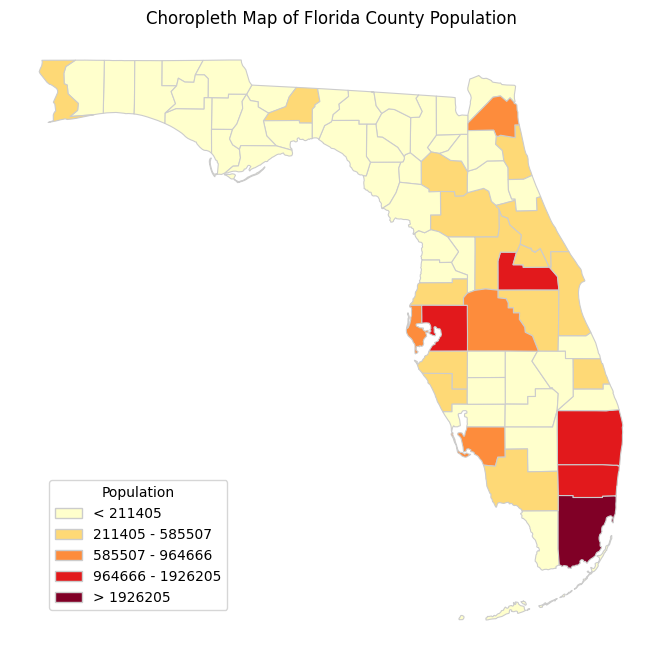

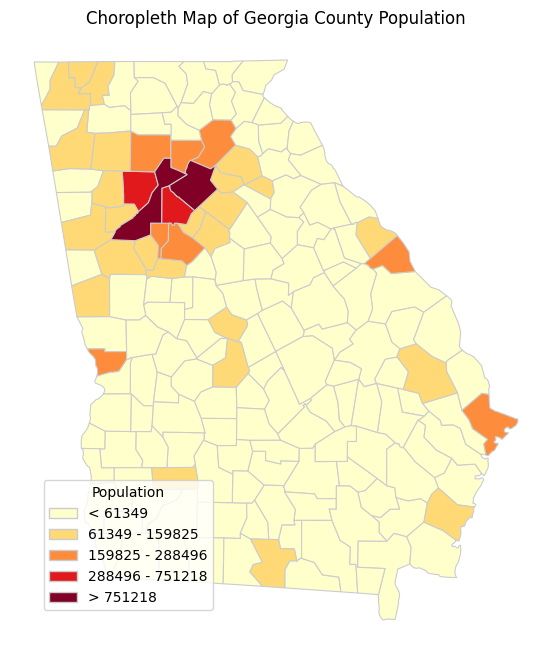

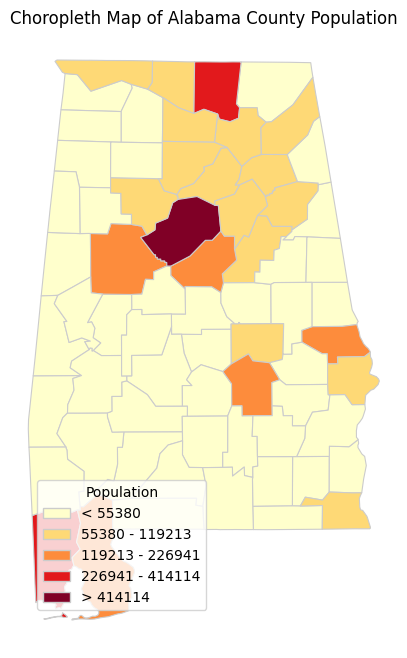

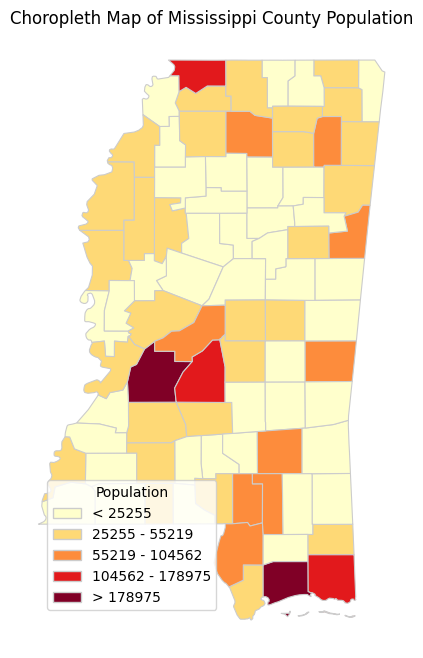

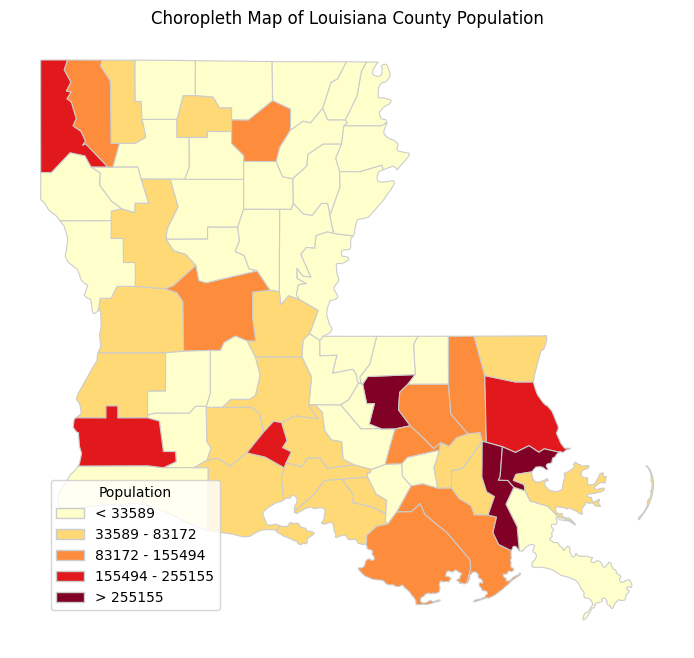

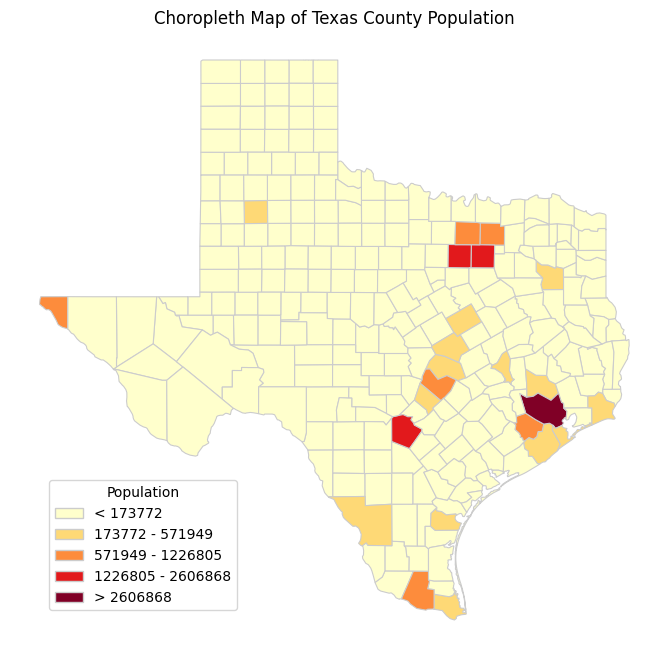

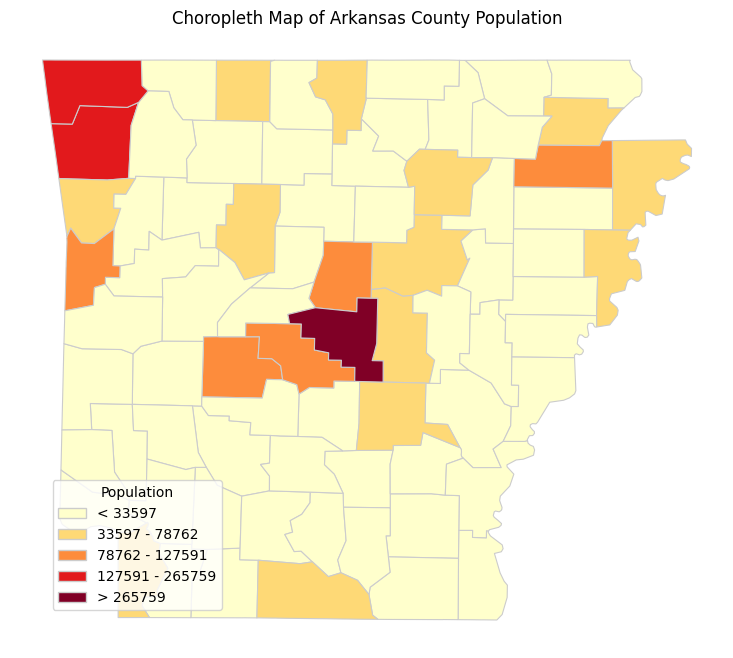

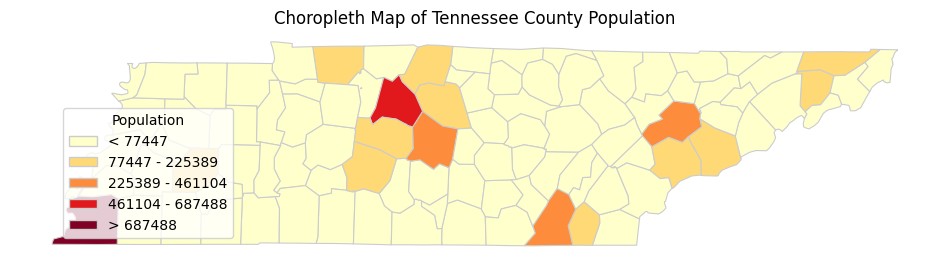

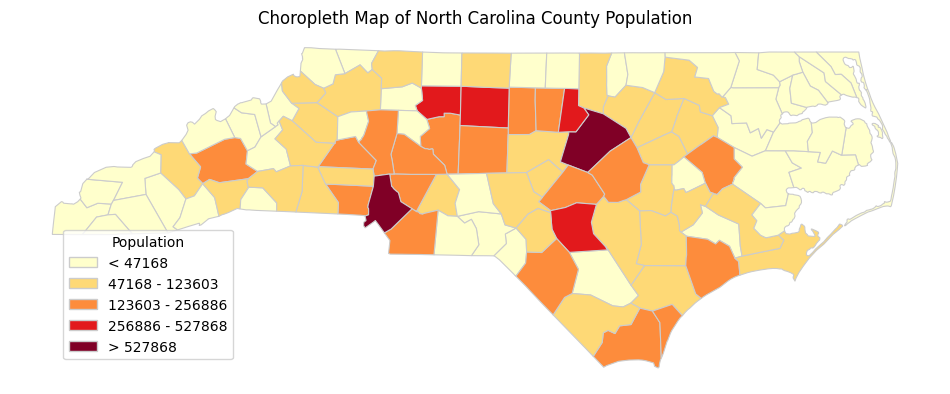

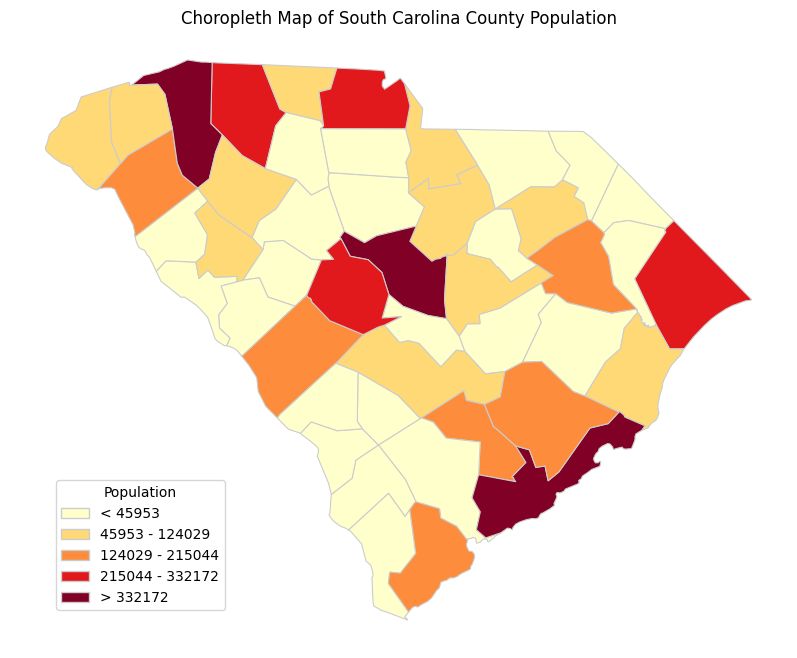

In [ ]:
import geopandas as gpd
import pandas as pd
import requests
from io import StringIO
import json
import mapclassify as mc
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import numpy as np

# Define the southern states
southern_states = {
    "Florida": "12",
    "Georgia": "13",
    "Alabama": "01",
    "Mississippi": "28",
    "Louisiana": "22",
    "Texas": "48",
    "Arkansas": "05",
    "Tennessee": "47",
    "North Carolina": "37",
    "South Carolina": "45"
}

# Download the US counties GeoJSON
url_us_counties = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"
us_counties = gpd.read_file(url_us_counties)

# Download the ACS population data
url_acs_population = "https://api.census.gov/data/2019/acs/acs5?get=NAME,B01001_001E&for=county:*"
response = requests.get(url_acs_population)
population_json = json.loads(response.text)
population_data = pd.DataFrame(population_json[1:], columns=population_json[0])
population_data['id'] = population_data['state'] + population_data['county']

# Merge the population data with the counties shapefile
us_counties = us_counties.merge(population_data, left_on="id", right_on="id")
us_counties["Population"] = us_counties["B01001_001E"].astype(int)

# Loop through each southern state
for state_name, state_fips in southern_states.items():
    state_counties = us_counties[us_counties["STATE"] == state_fips].copy()

    # Classify the population data using natural Jenks classification
    num_bins = 5
    classifier = mc.NaturalBreaks.make(k=num_bins)
    state_counties["population_bins"] = state_counties[["Population"]].apply(classifier)

    # Plot the choropleth map
    fig, ax = plt.subplots(1, figsize=(12, 8))
    state_counties.plot(column="population_bins", cmap="YlOrRd", linewidth=0.8, edgecolor="0.8", ax=ax)
    ax.set_title(f"Choropleth Map of {state_name} County Population")
    ax.set_axis_off()

    # Create discrete legend items
    legend_labels = []
    bins = mc.NaturalBreaks(state_counties[["Population"]], num_bins).bins
    for i, row in enumerate(bins):
        if i == 0:
            legend_labels.append(f"< {row:.0f}")
        elif i == len(bins) - 1:
            legend_labels.append(f"> {bins[i - 1]:.0f}")
        else:
            legend_labels.append(f"{bins[i - 1]:.0f} - {row:.0f}")

    # Create a list of legend patches and their corresponding labels
    legend_patches = [Patch(facecolor=color, edgecolor="0.8") for color in plt.cm.YlOrRd(np.linspace(0, 1, num_bins))]
    legend = ax.legend(legend_patches, legend_labels, title="Population", loc="lower left", bbox_to_anchor=(0.05, 0.05), fontsize=10)
    plt.show()


/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


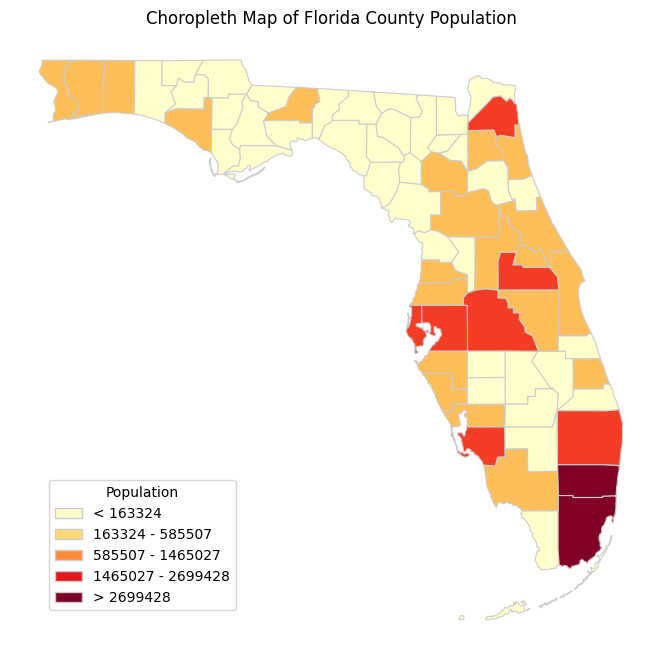

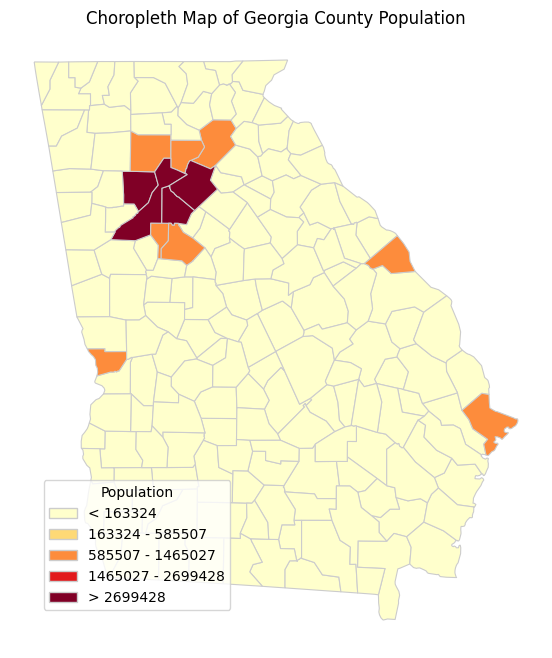

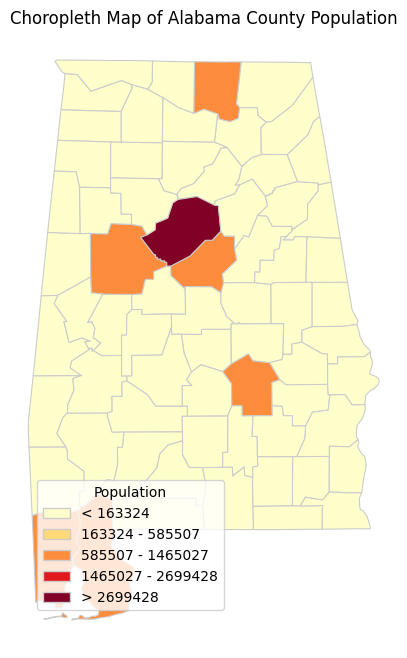

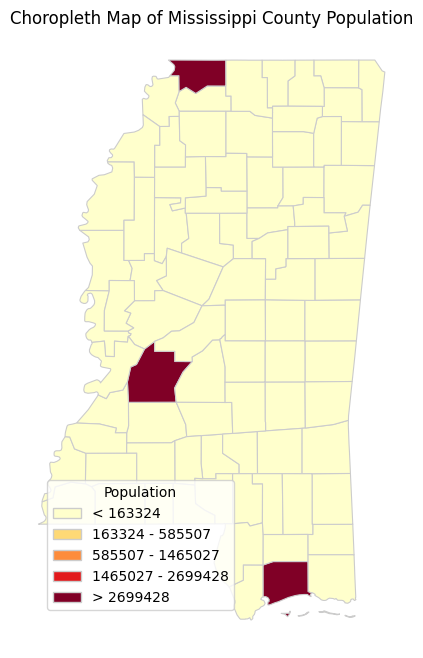

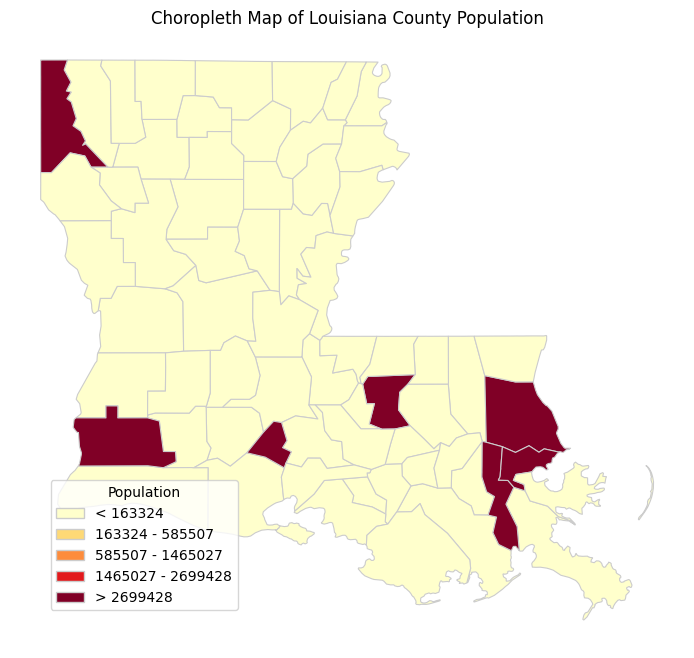

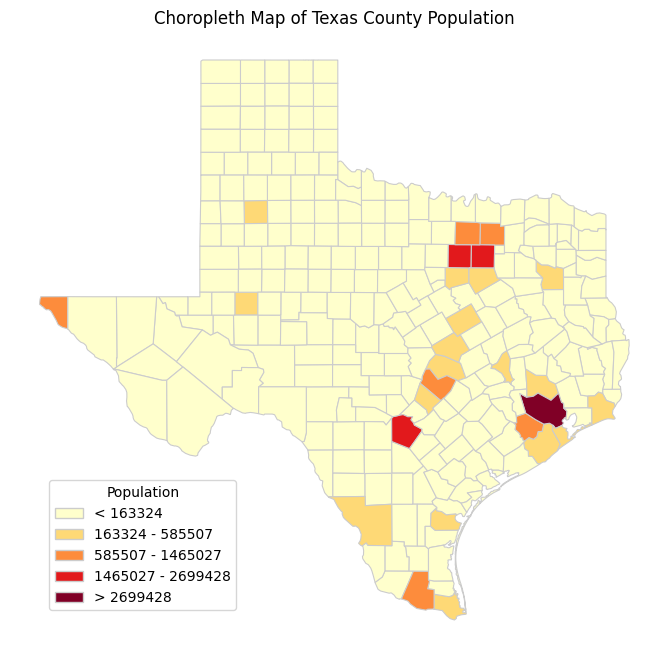

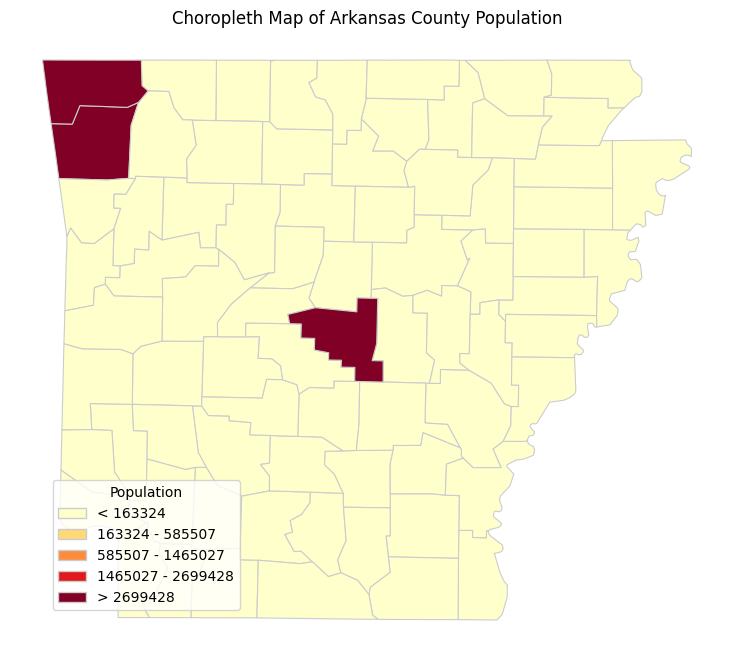

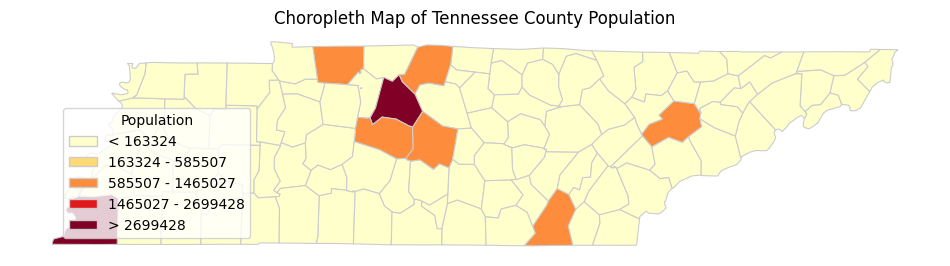

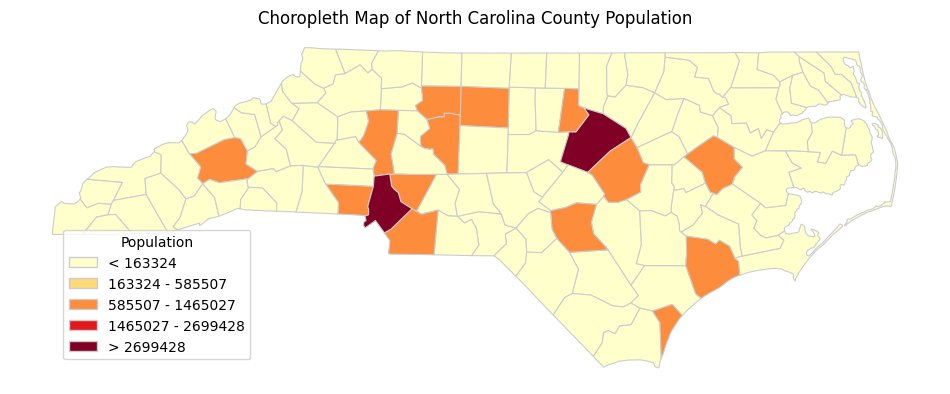

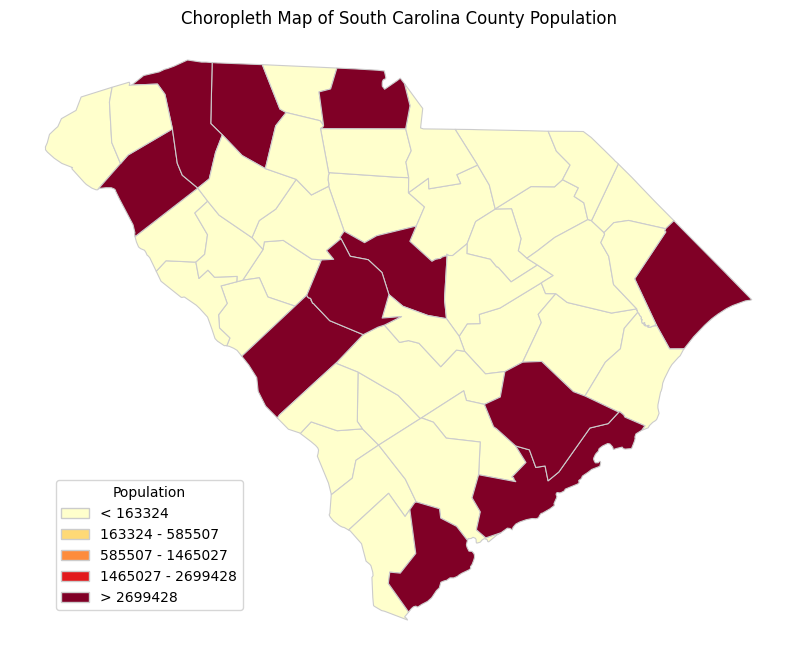

In [ ]:
import geopandas as gpd
import pandas as pd
import requests
from io import StringIO
import json
import mapclassify as mc
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import numpy as np

# Define the southern states
southern_states = {
    "Florida": "12",
    "Georgia": "13",
    "Alabama": "01",
    "Mississippi": "28",
    "Louisiana": "22",
    "Texas": "48",
    "Arkansas": "05",
    "Tennessee": "47",
    "North Carolina": "37",
    "South Carolina": "45"
}

# Download the US counties GeoJSON
url_us_counties = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"
us_counties = gpd.read_file(url_us_counties)

# Download the ACS population data
url_acs_population = "https://api.census.gov/data/2019/acs/acs5?get=NAME,B01001_001E&for=county:*"
response = requests.get(url_acs_population)
population_json = json.loads(response.text)
population_data = pd.DataFrame(population_json[1:], columns=population_json[0])
population_data['id'] = population_data['state'] + population_data['county']

# Merge the population data with the counties shapefile
us_counties = us_counties.merge(population_data, left_on="id", right_on="id")
us_counties["Population"] = us_counties["B01001_001E"].astype(int)


# Classify the population data using natural Jenks classification
num_bins = 5
classifier = mc.NaturalBreaks.make(k=num_bins)

# Extract the southern states data
southern_states_data = us_counties[us_counties['state'].isin(southern_states.values())]

# Apply the classifier to the population data for all southern states
southern_states_data["population_bins"] = southern_states_data[["Population"]].apply(classifier)

# Loop through each southern state
for state_name, state_fips in southern_states.items():
    # Extract the data for this state
    state_counties = southern_states_data[southern_states_data["STATE"] == state_fips].copy()

    # Plot the choropleth map
    fig, ax = plt.subplots(1, figsize=(12, 8))
    state_counties.plot(column="population_bins", cmap="YlOrRd", linewidth=0.8, edgecolor="0.8", ax=ax)
    ax.set_title(f"Choropleth Map of {state_name} County Population")
    ax.set_axis_off()

    # Create discrete legend items
    legend_labels = []
    bins = mc.NaturalBreaks(southern_states_data[["Population"]], num_bins).bins
    for i, row in enumerate(bins):
        if i == 0:
            legend_labels.append(f"< {row:.0f}")
        elif i == len(bins) - 1:
            legend_labels.append(f"> {bins[i - 1]:.0f}")
        else:
            legend_labels.append(f"{bins[i - 1]:.0f} - {row:.0f}")

    # Create a list of legend patches and their corresponding labels
    legend_patches = [Patch(facecolor=color, edgecolor="0.8") for color in plt.cm.YlOrRd(np.linspace(0, 1, num_bins))]
    legend = ax.legend(legend_patches, legend_labels, title="Population", loc="lower left", bbox_to_anchor=(0.05, 0.05), fontsize=10)
    plt.show()


/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


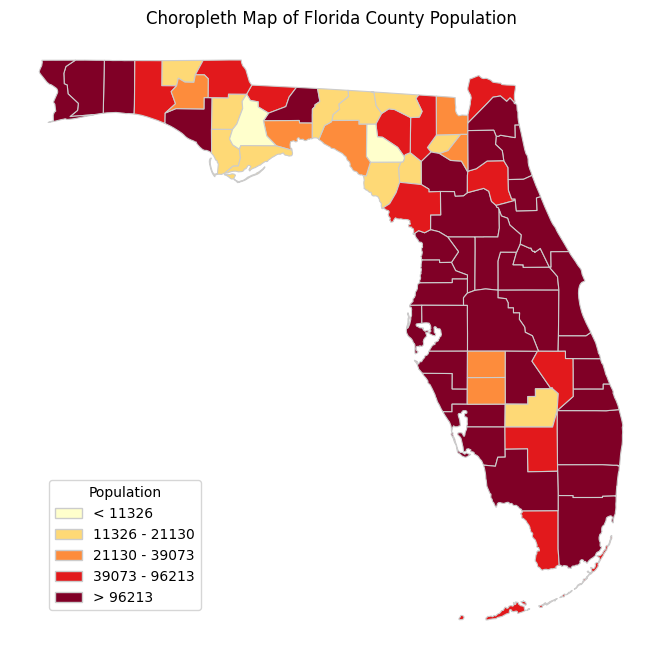

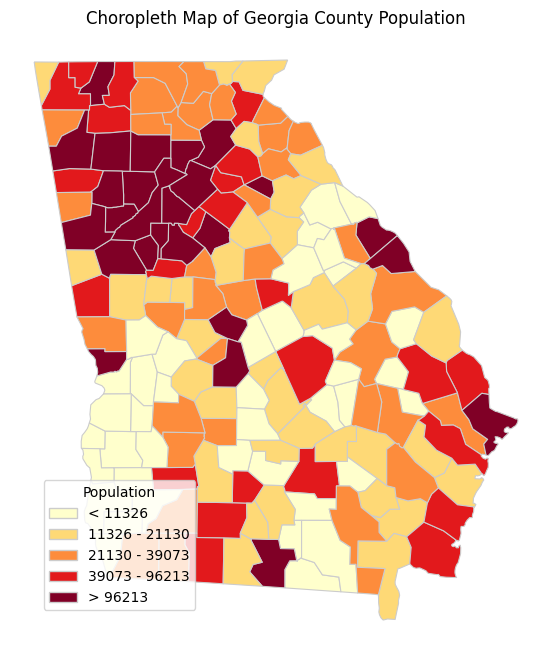

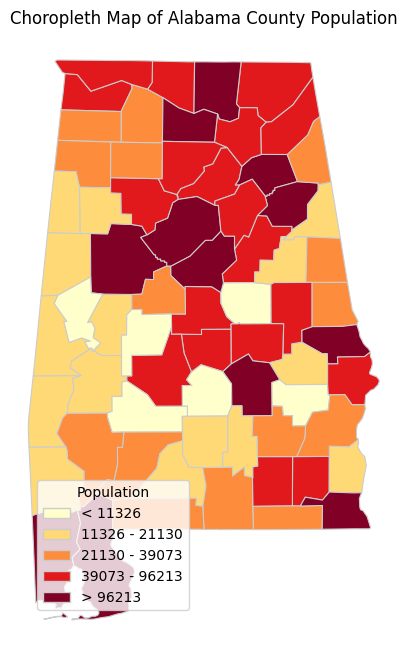

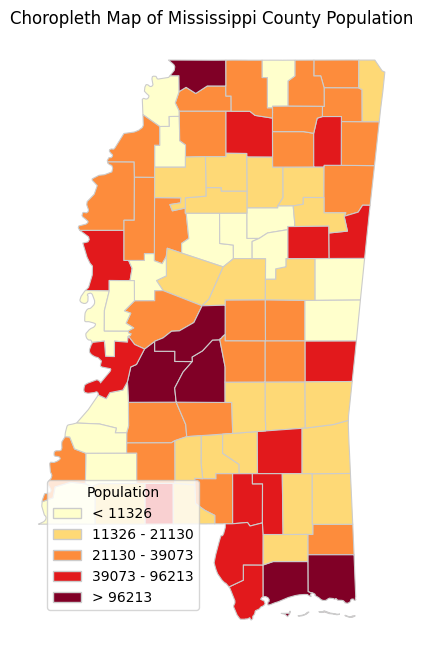

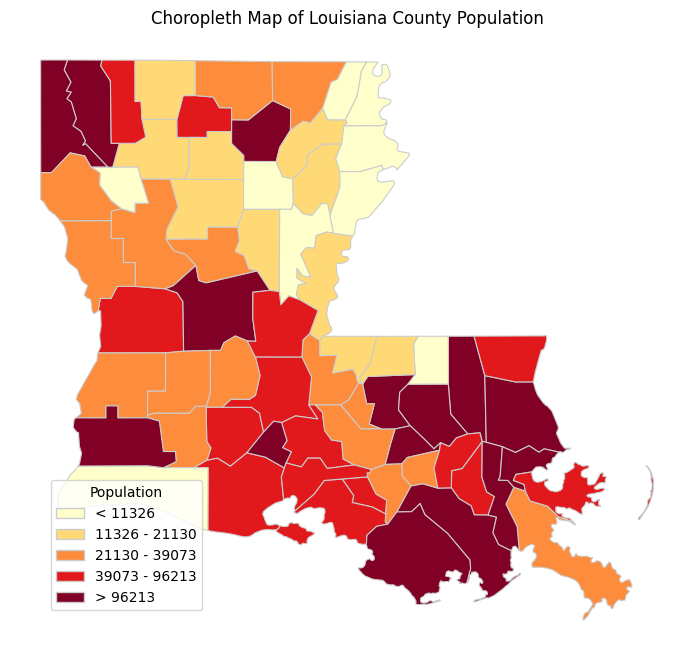

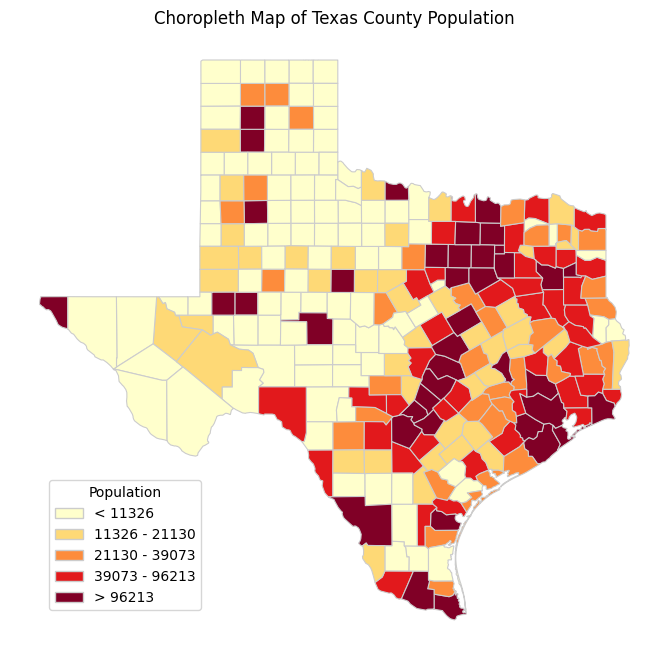

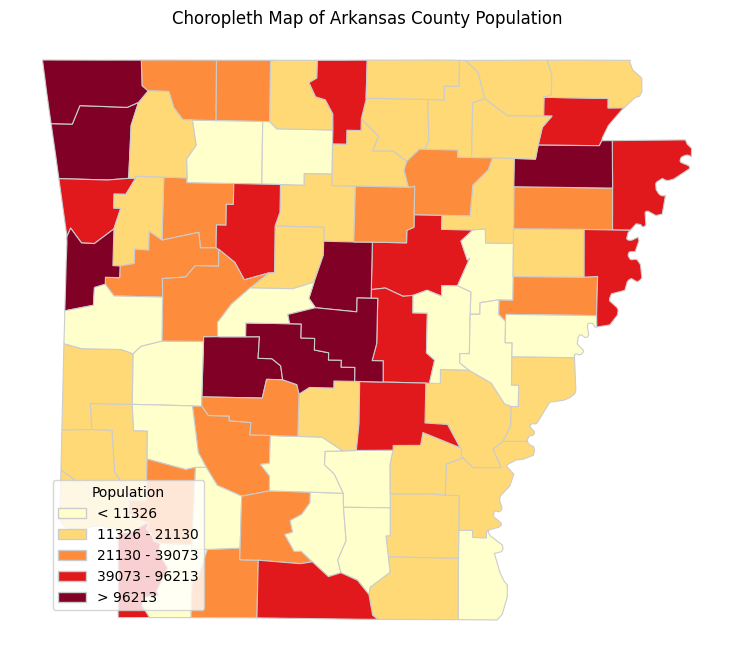

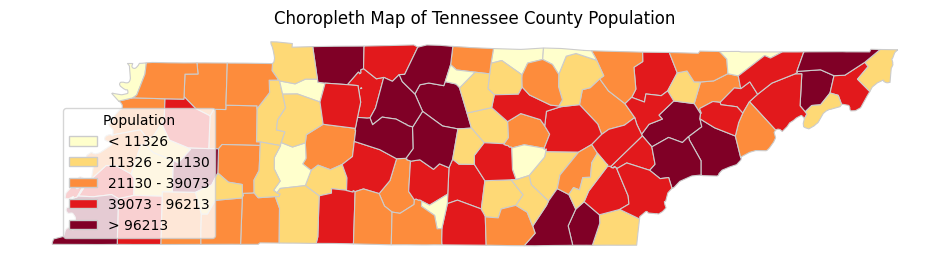

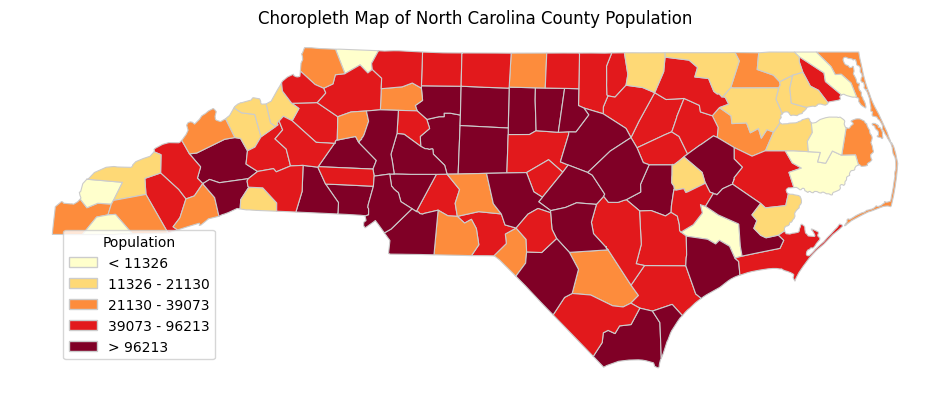

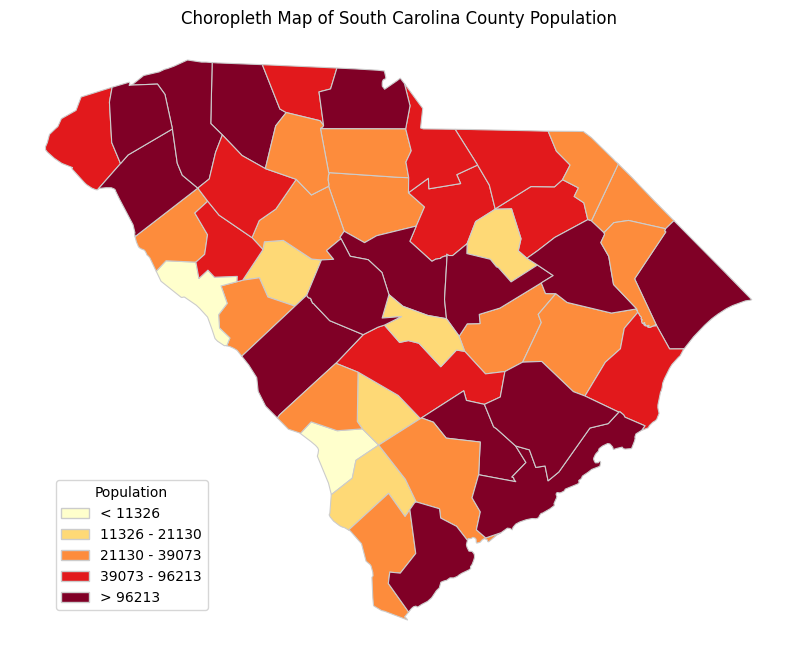

In [ ]:
import geopandas as gpd
import pandas as pd
import requests
from io import StringIO
import json
import mapclassify as mc
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import numpy as np

# Define the southern states
southern_states = {
    "Florida": "12",
    "Georgia": "13",
    "Alabama": "01",
    "Mississippi": "28",
    "Louisiana": "22",
    "Texas": "48",
    "Arkansas": "05",
    "Tennessee": "47",
    "North Carolina": "37",
    "South Carolina": "45"
}

# Download the US counties GeoJSON
url_us_counties = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"
us_counties = gpd.read_file(url_us_counties)

# Download the ACS population data
url_acs_population = "https://api.census.gov/data/2019/acs/acs5?get=NAME,B01001_001E&for=county:*"
response = requests.get(url_acs_population)
population_json = json.loads(response.text)
population_data = pd.DataFrame(population_json[1:], columns=population_json[0])
population_data['id'] = population_data['state'] + population_data['county']

# Merge the population data with the counties shapefile
us_counties = us_counties.merge(population_data, left_on="id", right_on="id")
us_counties["Population"] = us_counties["B01001_001E"].astype(int)

# Classify the population data using quantiles classification
num_bins = 5
classifier = mc.Quantiles.make(k=num_bins)

# Extract the southern states data
southern_states_data = us_counties[us_counties['state'].isin(southern_states.values())]

# Apply the classifier to the population data for all southern states
southern_states_data["population_bins"] = southern_states_data[["Population"]].apply(classifier)

# Loop through each southern state
for state_name, state_fips in southern_states.items():
    # Extract the data for this state
    state_counties = southern_states_data[southern_states_data["STATE"] == state_fips].copy()

    # Plot the choropleth map
    fig, ax = plt.subplots(1, figsize=(12, 8))
    state_counties.plot(column="population_bins", cmap="YlOrRd", linewidth=0.8, edgecolor="0.8", ax=ax)
    ax.set_title(f"Choropleth Map of {state_name} County Population")
    ax.set_axis_off()

    # Create discrete legend items
    legend_labels = []
    bins = mc.Quantiles(southern_states_data[["Population"]], num_bins).bins
    for i, row in enumerate(bins):
        if i == 0:
            legend_labels.append(f"< {row:.0f}")
        elif i == len(bins) - 1:
            legend_labels.append(f"> {bins[i - 1]:.0f}")
        else:
            legend_labels.append(f"{bins[i - 1]:.0f} - {row:.0f}")

    # Create a list of legend patches and their corresponding labels
    legend_patches = [Patch(facecolor=color, edgecolor="0.8") for color in plt.cm.YlOrRd(np.linspace(0, 1, num_bins))]
    legend = ax.legend(legend_patches, legend_labels, title="Population", loc="lower left", bbox_to_anchor=(0.05, 0.05), fontsize=10)
    plt.show()


/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


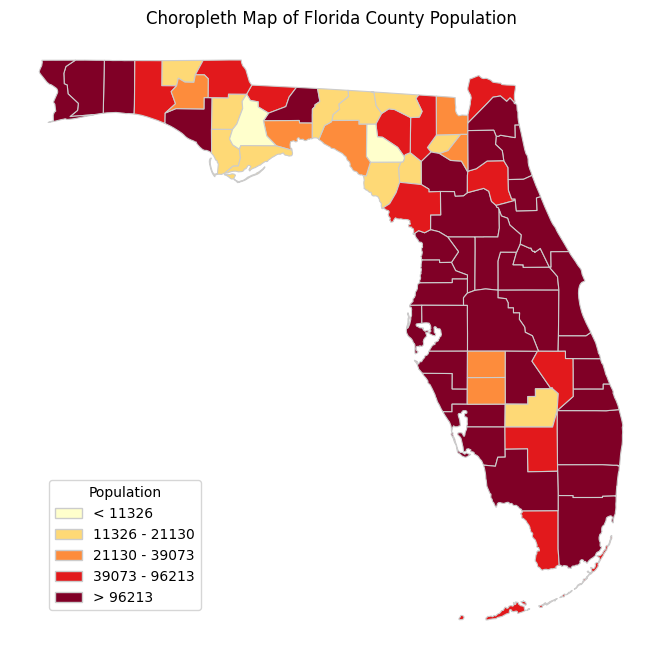

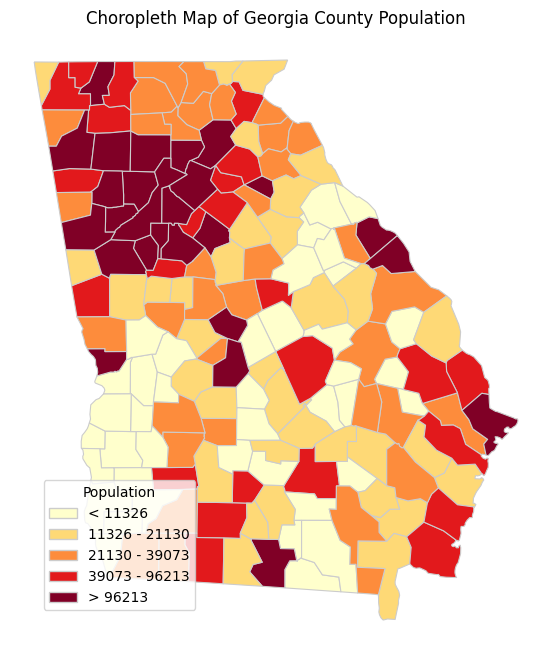

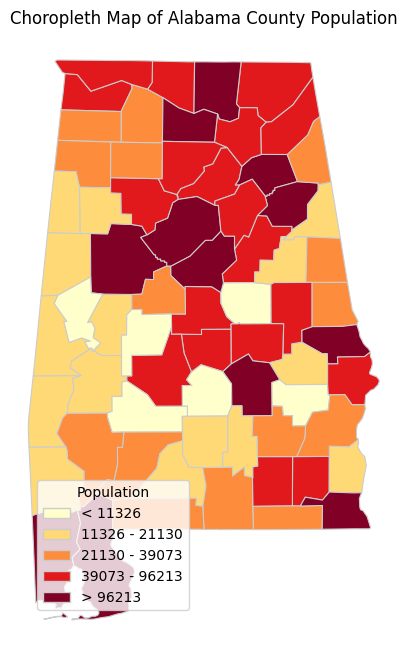

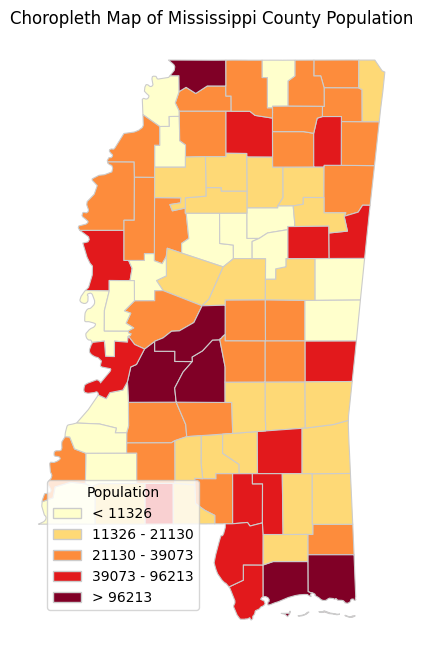

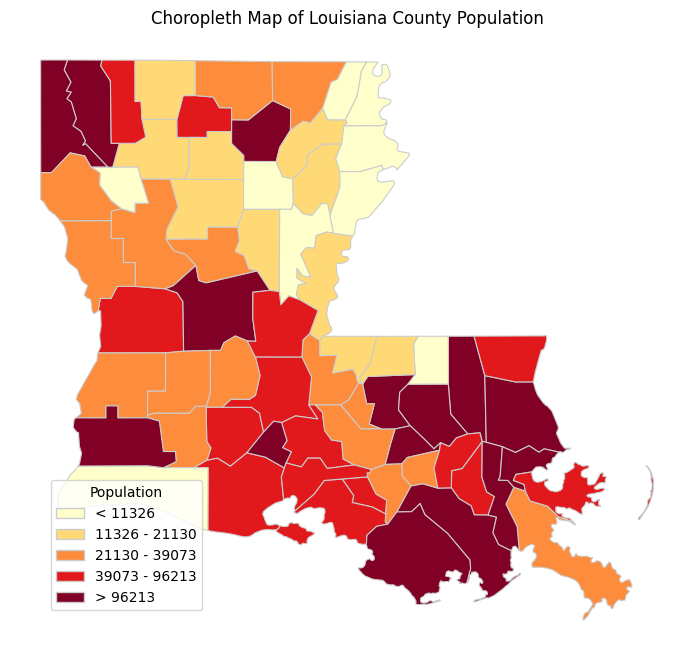

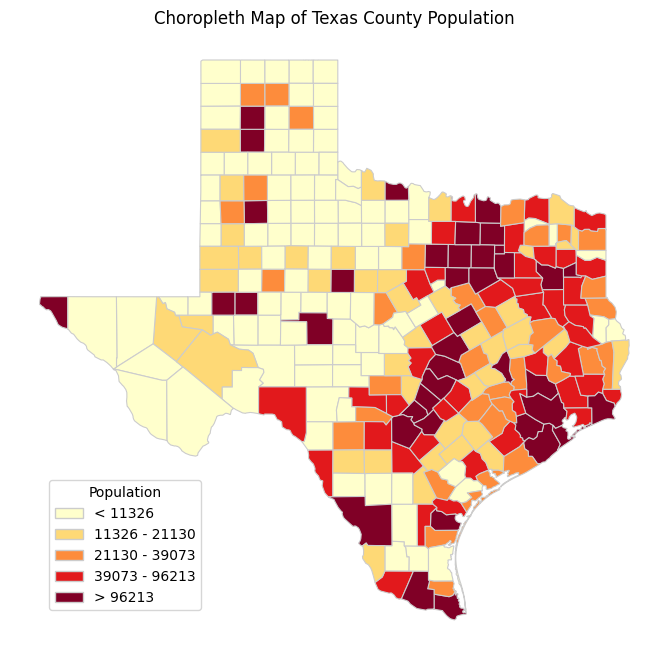

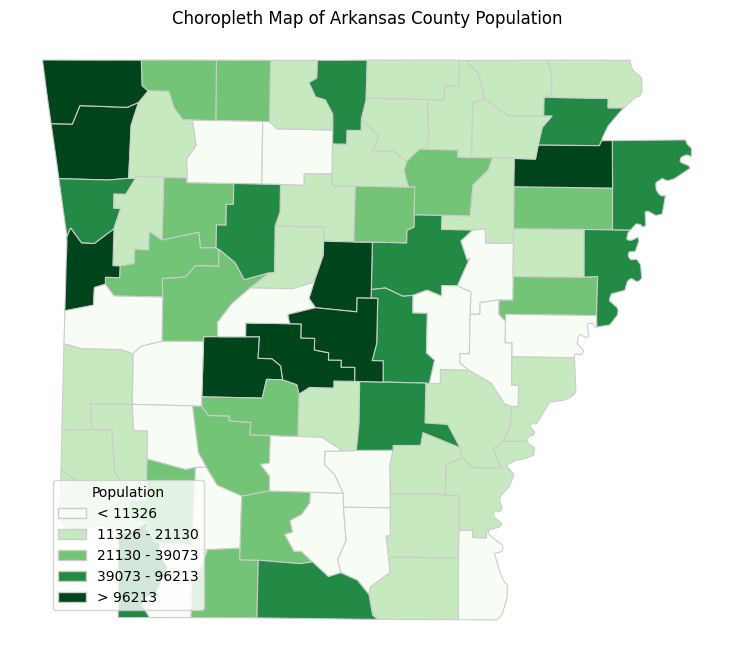

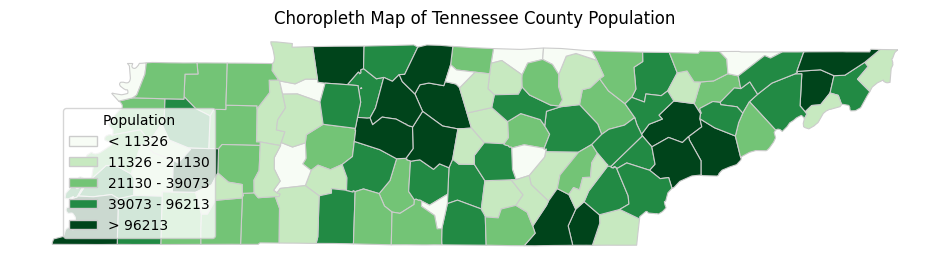

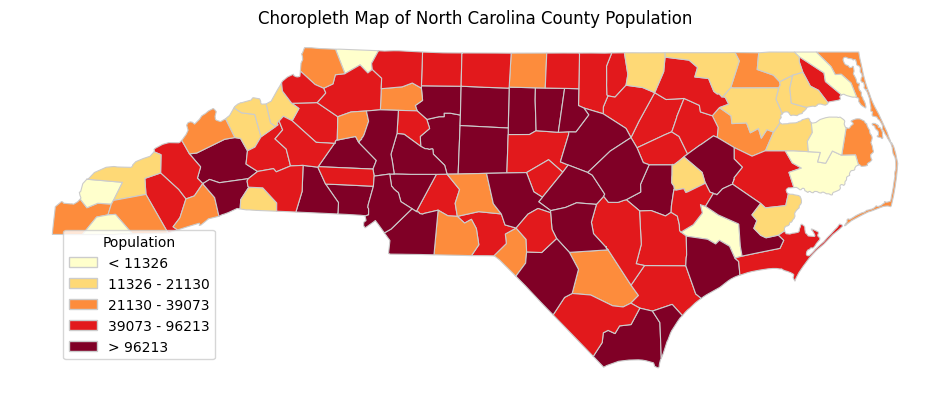

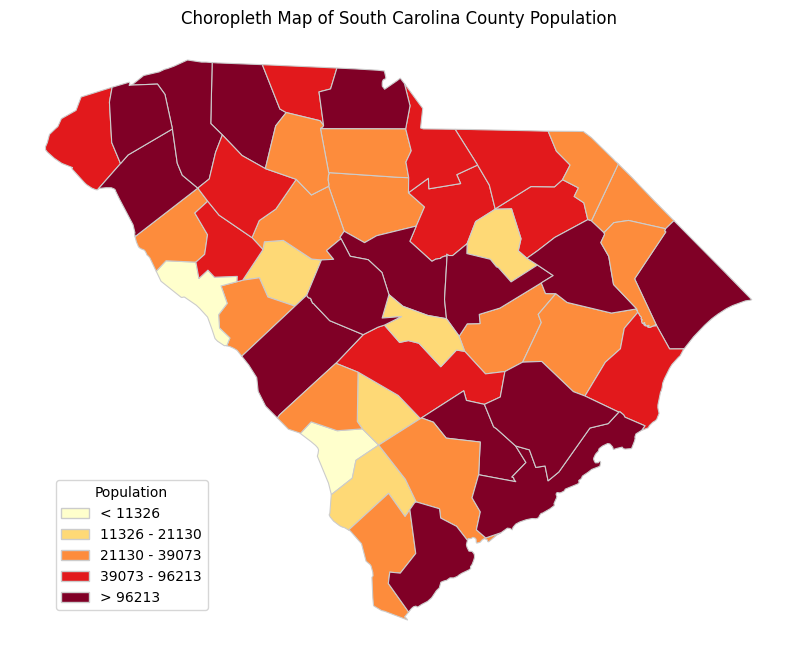

In [ ]:
# Define the southern states with coastlines
coastal_states = ["Florida", "Georgia", "Alabama", "Mississippi", "Louisiana", "Texas", "South Carolina", "North Carolina"]

# Classify the population data using quantiles classification
num_bins = 5
classifier = mc.Quantiles.make(k=num_bins)

# Extract the southern states data
southern_states_data = us_counties[us_counties['state'].isin(southern_states.values())]

# Apply the classifier to the population data for all southern states
southern_states_data["population_bins"] = southern_states_data[["Population"]].apply(classifier)

# Loop through each southern state
for state_name, state_fips in southern_states.items():
    # Extract the data for this state
    state_counties = southern_states_data[southern_states_data["STATE"] == state_fips].copy()

    # Choose the colormap based on whether the state has a coastline
    colormap = "YlOrRd" if state_name in coastal_states else "Greens"

    # Plot the choropleth map
    fig, ax = plt.subplots(1, figsize=(12, 8))
    state_counties.plot(column="population_bins", cmap=colormap, linewidth=0.8, edgecolor="0.8", ax=ax)
    ax.set_title(f"Choropleth Map of {state_name} County Population")
    ax.set_axis_off()

    # Create discrete legend items
    legend_labels = []
    bins = mc.Quantiles(southern_states_data[["Population"]], num_bins).bins
    for i, row in enumerate(bins):
        if i == 0:
            legend_labels.append(f"< {row:.0f}")
        elif i == len(bins) - 1:
            legend_labels.append(f"> {bins[i - 1]:.0f}")
        else:
            legend_labels.append(f"{bins[i - 1]:.0f} - {row:.0f}")

    # Create a list of legend patches and their corresponding labels
    legend_patches = [Patch(facecolor=color, edgecolor="0.8") for color in plt.get_cmap(colormap)(np.linspace(0, 1, num_bins))]
    legend = ax.legend(legend_patches, legend_labels, title="Population", loc="lower left", bbox_to_anchor=(0.05, 0.05), fontsize=10)
    plt.show()


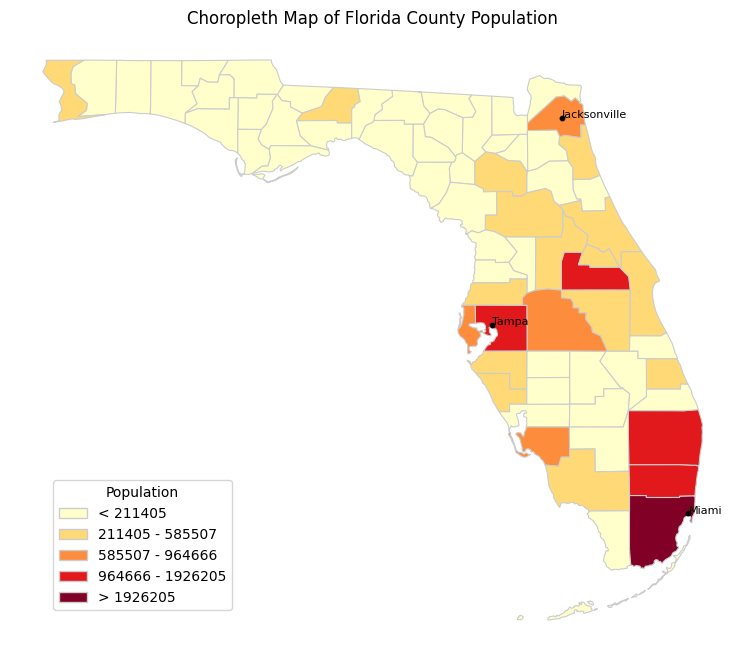

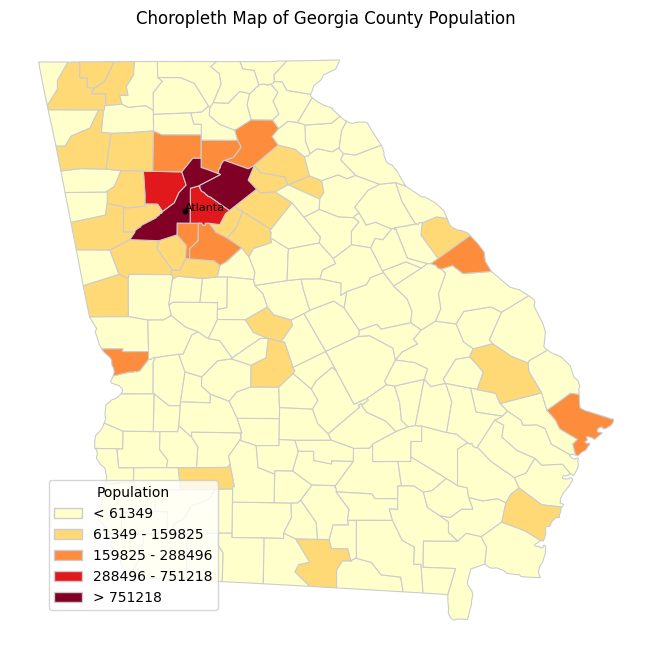

/usr/local/lib/python3.10/dist-packages/geopandas/plotting.py:695: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


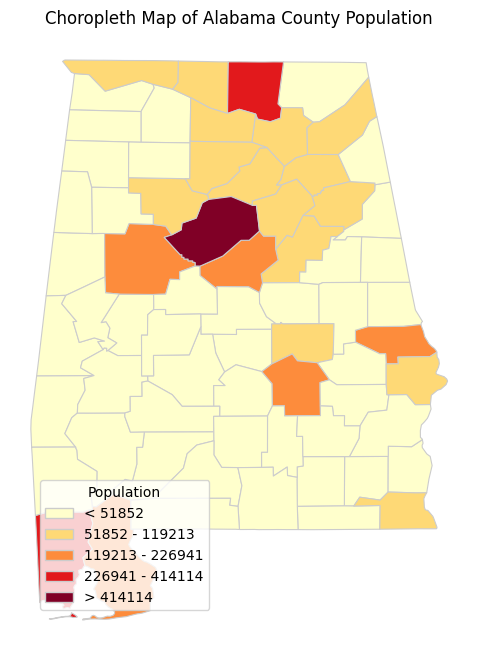

/usr/local/lib/python3.10/dist-packages/geopandas/plotting.py:695: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


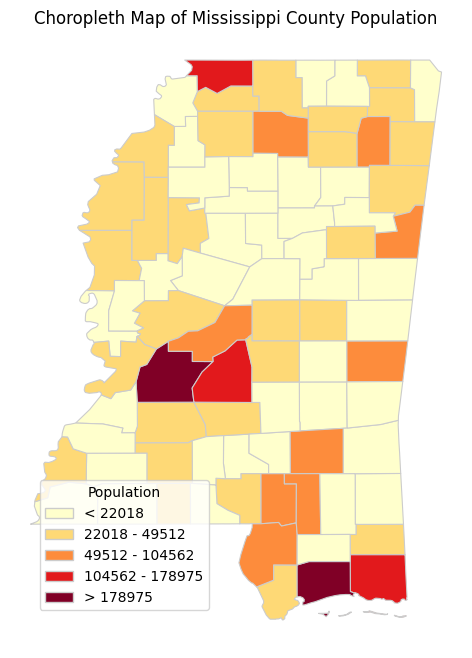

/usr/local/lib/python3.10/dist-packages/geopandas/plotting.py:695: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


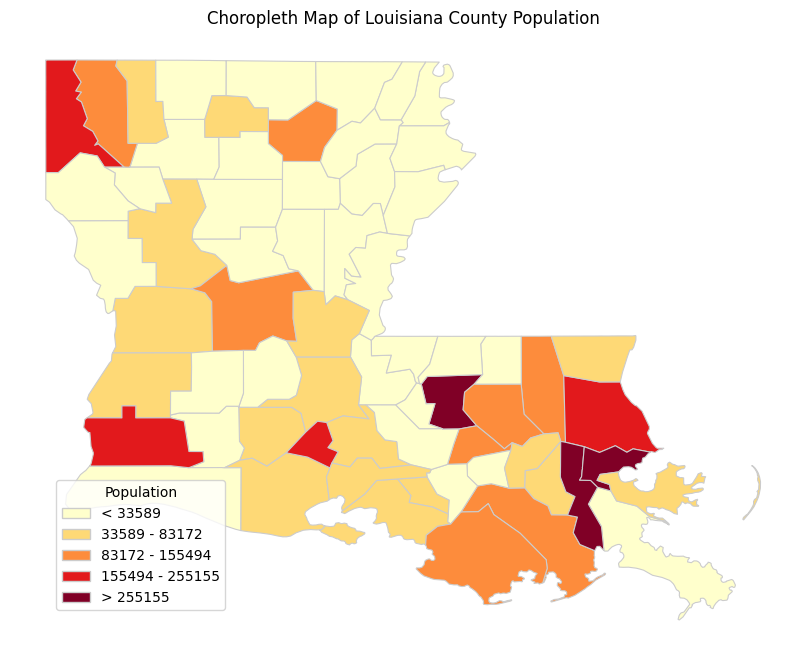

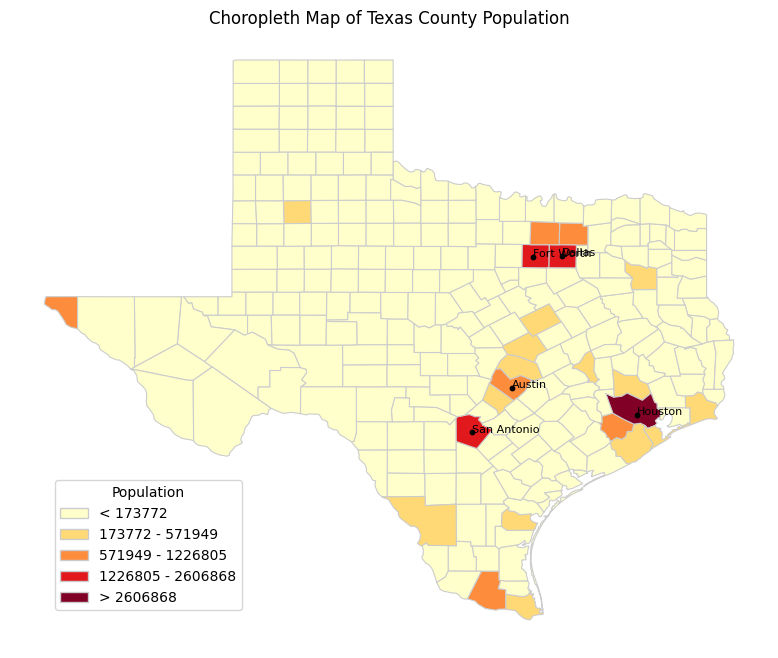

/usr/local/lib/python3.10/dist-packages/geopandas/plotting.py:695: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


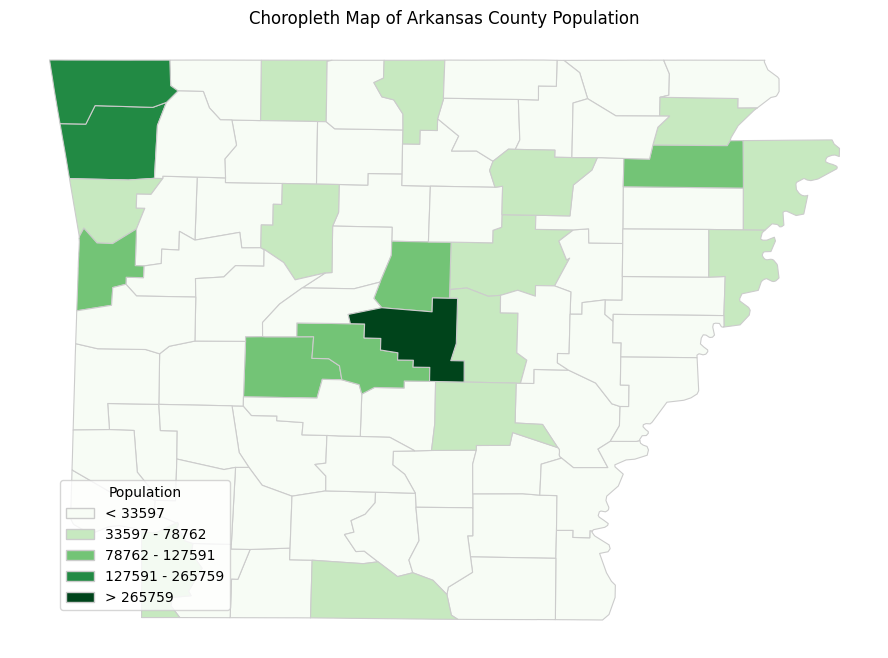

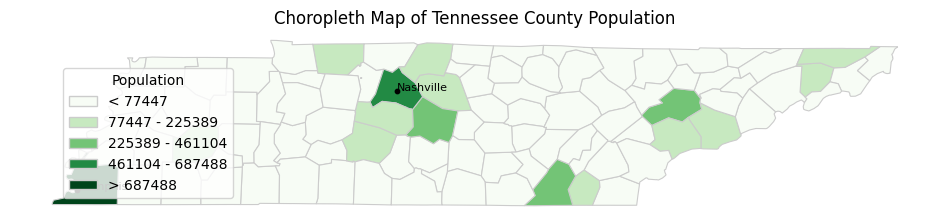

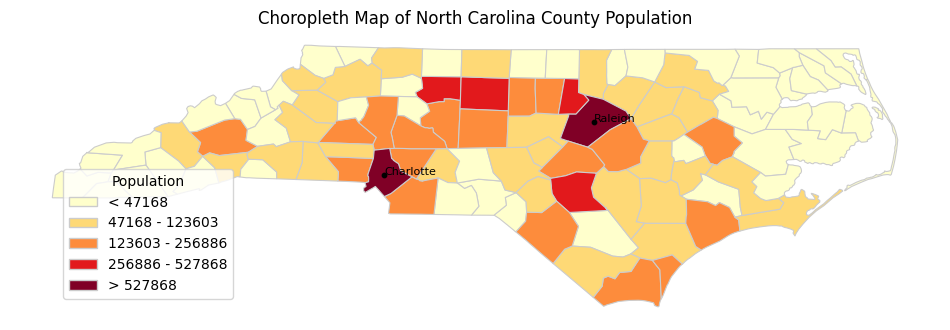

/usr/local/lib/python3.10/dist-packages/geopandas/plotting.py:695: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


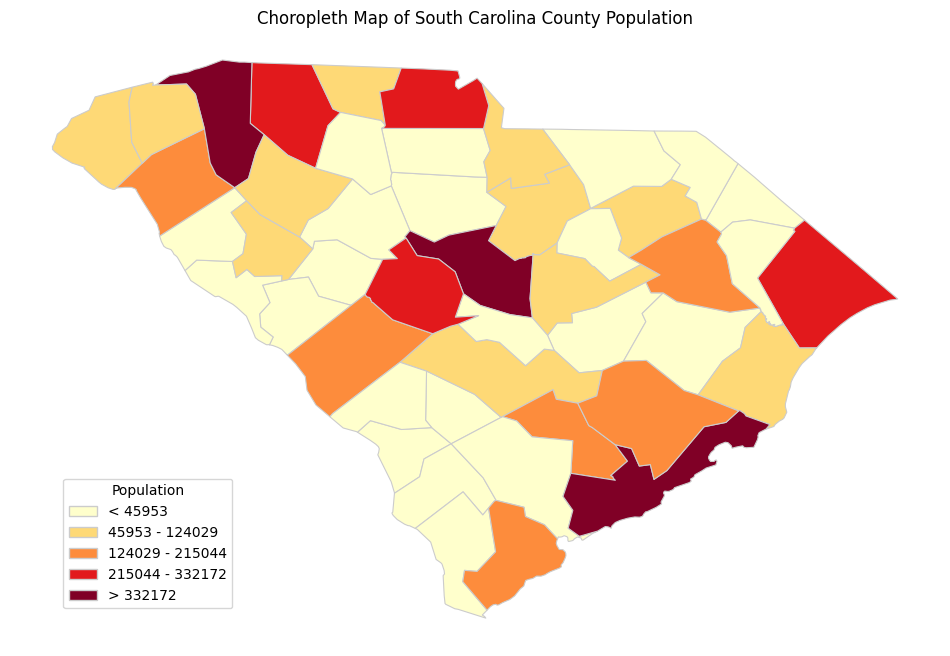

In [ ]:
# Define the southern states with coastlines
coastal_states = ["Florida", "Georgia", "Alabama", "Mississippi", "Louisiana", "Texas", "South Carolina", "North Carolina"]

# Classify the population data using natural Jenks classification
num_bins = 5

# Loop through each southern state
for state_name, state_fips in southern_states.items():
    # Extract the data for this state
    state_counties = us_counties[us_counties["STATE"] == state_fips].copy()

    # Apply the classifier to the population data for this state
    classifier = mc.NaturalBreaks.make(k=num_bins)
    state_counties["population_bins"] = state_counties[["Population"]].apply(classifier)

    # Choose the colormap based on whether the state has a coastline
    colormap = "YlOrRd" if state_name in coastal_states else "Greens"

    # Plot the choropleth map
    fig, ax = plt.subplots(1, figsize=(12, 8))
    state_counties.plot(column="population_bins", cmap=colormap, linewidth=0.8, edgecolor="0.8", ax=ax)
    ax.set_title(f"Choropleth Map of {state_name} County Population")
    ax.set_axis_off()

    # Create discrete legend items
    legend_labels = []
    bins = mc.NaturalBreaks(state_counties[["Population"]], num_bins).bins
    for i, row in enumerate(bins):
        if i == 0:
            legend_labels.append(f"< {row:.0f}")
        elif i == len(bins) - 1:
            legend_labels.append(f"> {bins[i - 1]:.0f}")
        else:
            legend_labels.append(f"{bins[i - 1]:.0f} - {row:.0f}")

    # Create a single polygon for the current state
    state_polygon = state_counties.unary_union

    # Filter cities based on whether they fall within the current state
    major_cities_in_state = major_cities_gdf[major_cities_gdf.within(state_polygon)]

    # Add points for each major city
    major_cities_in_state.plot(ax=ax, color='black', markersize=10)

    # Label the cities
    for x, y, label in zip(major_cities_in_state.geometry.x, major_cities_in_state.geometry.y, major_cities_in_state['City']):
        ax.text(x, y, label, fontsize=8)


    # Create a list of legend patches and their corresponding labels
    legend_patches = [Patch(facecolor=color, edgecolor="0.8") for color in plt.get_cmap(colormap)(np.linspace(0, 1, num_bins))]
    legend = ax.legend(legend_patches, legend_labels, title="Population", loc="lower left", bbox_to_anchor=(0.05, 0.05), fontsize=10)
    plt.show()


In [ ]:
us_state_capitals = {
    "Florida": {"capital": "Tallahassee", "latitude": 30.4383, "longitude": -84.2807},
    "Georgia": {"capital": "Atlanta", "latitude": 33.7490, "longitude": -84.3880},
    "Alabama": {"capital": "Montgomery", "latitude": 32.3792, "longitude": -86.3077},
    "Mississippi": {"capital": "Jackson", "latitude": 32.2988, "longitude": -90.1848},
    "Louisiana": {"capital": "Baton Rouge", "latitude": 30.4515, "longitude": -91.1871},
    "Texas": {"capital": "Austin", "latitude": 30.2672, "longitude": -97.7431},
    "Arkansas": {"capital": "Little Rock", "latitude": 34.7465, "longitude": -92.2896},
    "Tennessee": {"capital": "Nashville", "latitude": 36.1627, "longitude": -86.7816},
    "North Carolina": {"capital": "Raleigh", "latitude": 35.7796, "longitude": -78.6382},
    "South Carolina": {"capital": "Columbia", "latitude": 34.0007, "longitude": -81.0348}
}


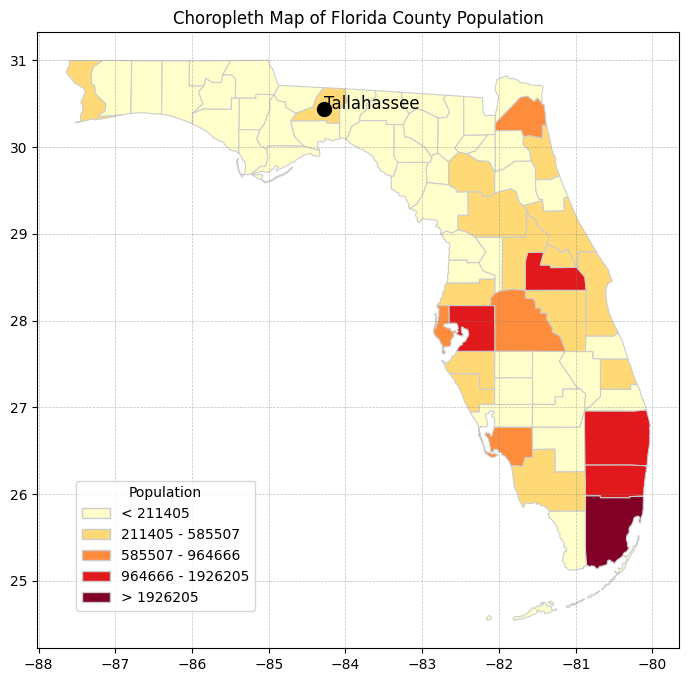

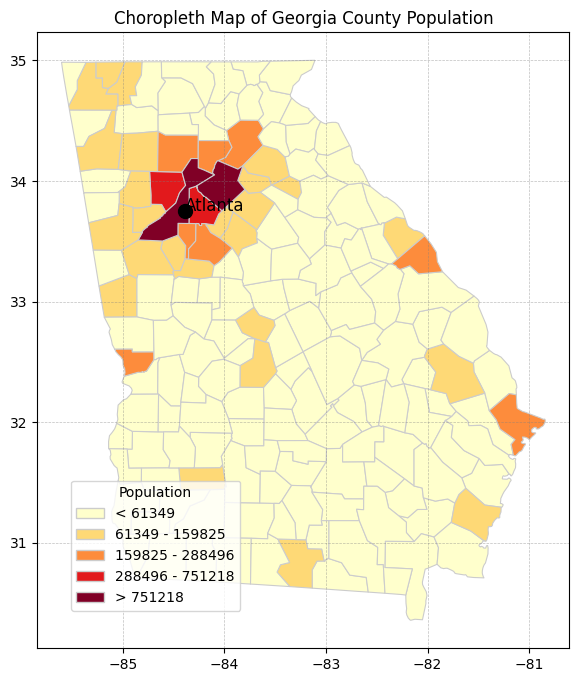

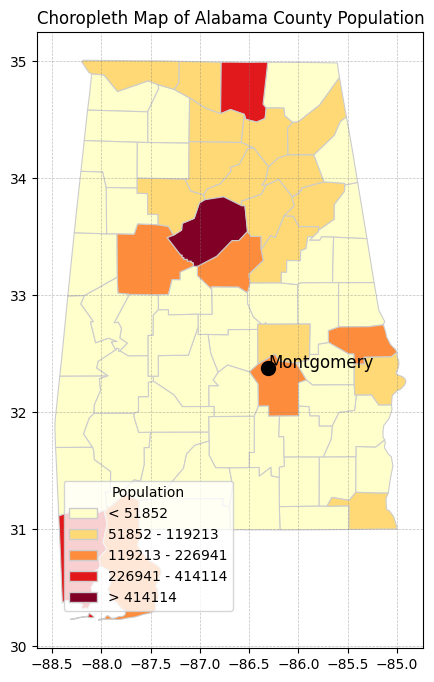

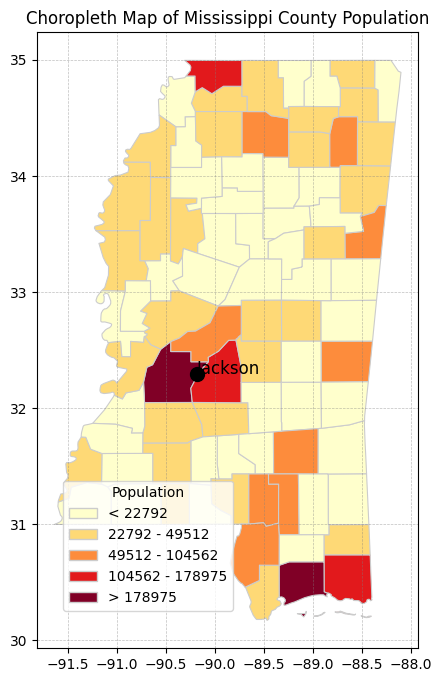

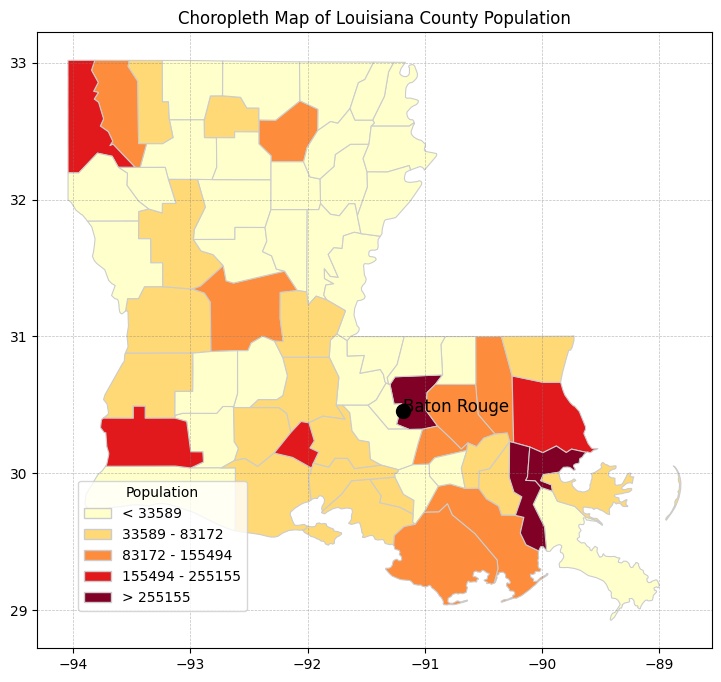

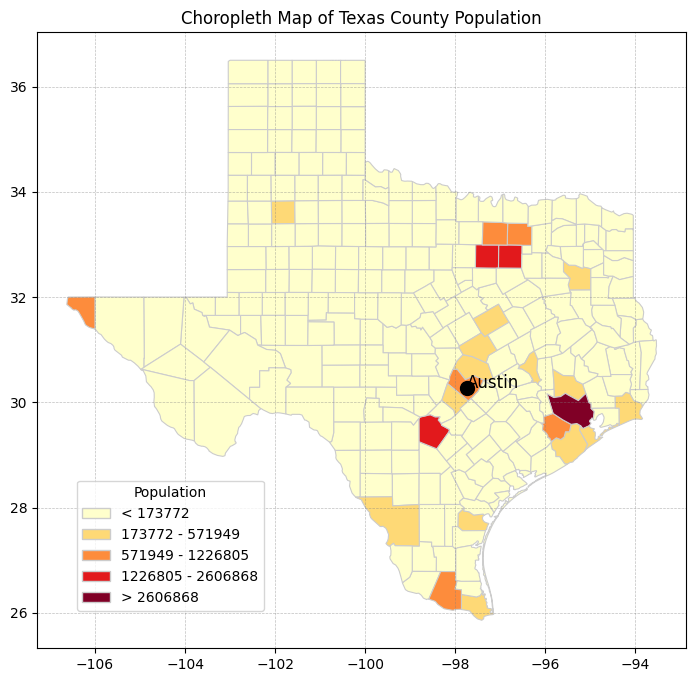

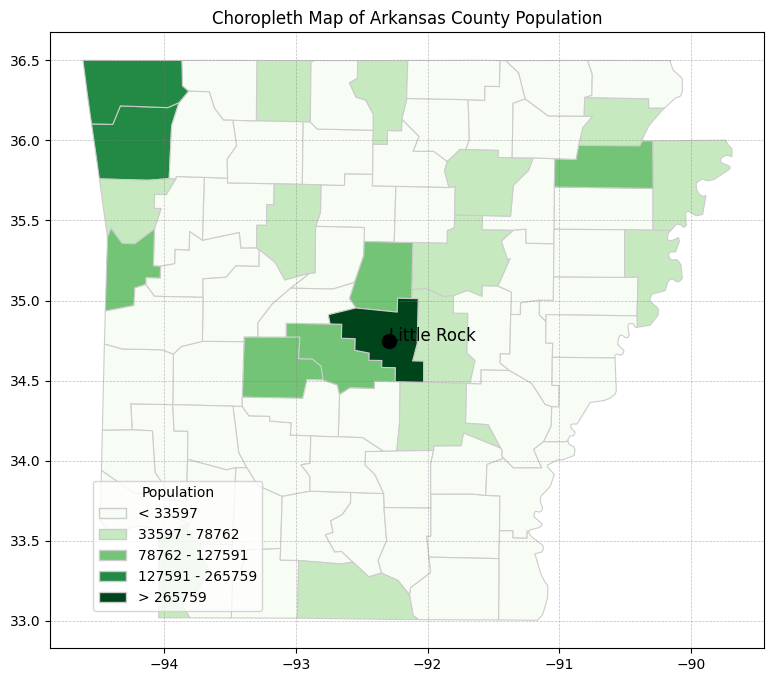

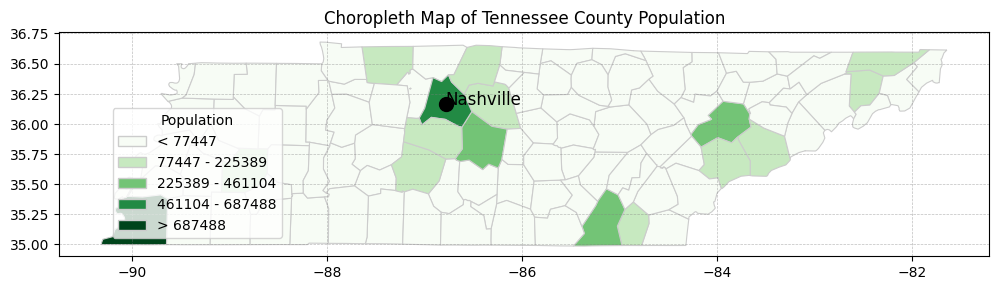

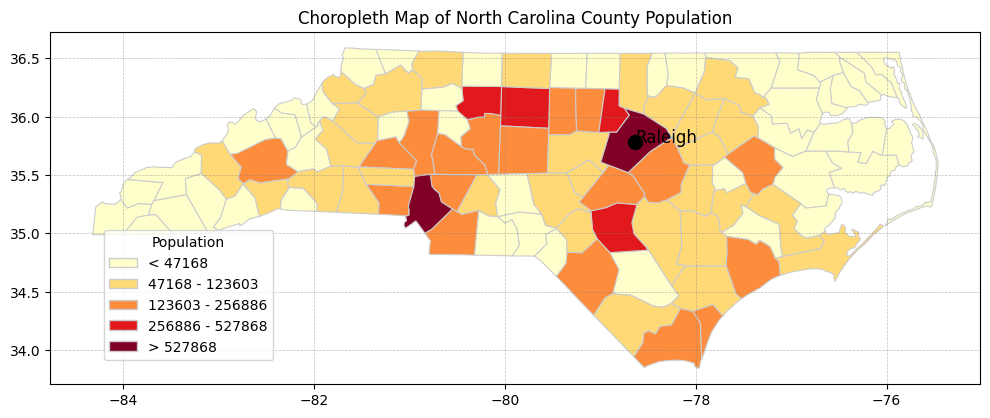

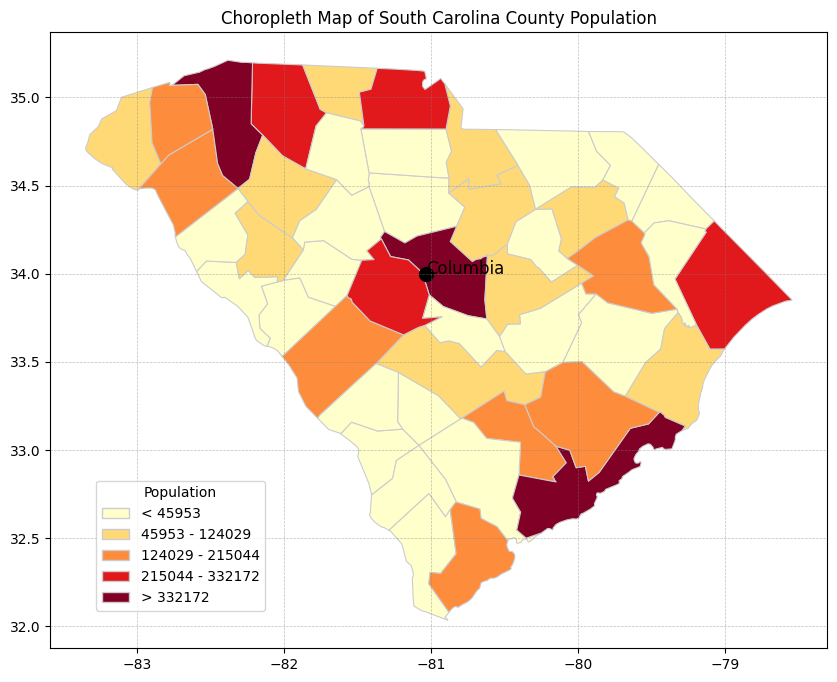

In [ ]:
import cartopy.crs as ccrs

# Define the southern states with coastlines
coastal_states = ["Florida", "Georgia", "Alabama", "Mississippi", "Louisiana", "Texas", "South Carolina", "North Carolina"]

# Classify the population data using natural Jenks classification
num_bins = 5

# Loop through each southern state
for state_name, state_fips in southern_states.items():
    # Extract the data for this state
    state_counties = us_counties[us_counties["STATE"] == state_fips].copy()

    # Apply the classifier to the population data for this state
    classifier = mc.NaturalBreaks.make(k=num_bins)
    state_counties["population_bins"] = state_counties[["Population"]].apply(classifier)

    # Choose the colormap based on whether the state has a coastline
    colormap = "YlOrRd" if state_name in coastal_states else "Greens"

    # Plot the choropleth map
    fig, ax = plt.subplots(1, figsize=(12, 8))
    state_counties.plot(column="population_bins", cmap=colormap, linewidth=0.8, edgecolor="0.8", ax=ax)
    ax.set_title(f"Choropleth Map of {state_name} County Population")
    # ax.set_axis_off()

    # Create discrete legend items
    legend_labels = []
    bins = mc.NaturalBreaks(state_counties[["Population"]], num_bins).bins
    for i, row in enumerate(bins):
        if i == 0:
            legend_labels.append(f"< {row:.0f}")
        elif i == len(bins) - 1:
            legend_labels.append(f"> {bins[i - 1]:.0f}")
        else:
            legend_labels.append(f"{bins[i - 1]:.0f} - {row:.0f}")

    # Create a single polygon for the current state
    state_polygon = state_counties.unary_union

    # Plot the capital on the map
    capital_info = us_state_capitals[state_name]
    ax.scatter(capital_info["longitude"], capital_info["latitude"], color="black", s=100)  # black point for capital
    ax.text(capital_info["longitude"], capital_info["latitude"], capital_info["capital"], fontsize=12)  # capital name

    ax.set_title(f"Choropleth Map of {state_name} County Population")
    # Draw grid
    ax.grid(True, which="both", ls="--", linewidth=0.5, color="gray", alpha=0.5)

    # # Set ticks
    # ax.set_xticks(np.arange(-180, 180, 10), crs=ccrs.PlateCarree())
    # ax.set_yticks(np.arange(-90, 90, 10), crs=ccrs.PlateCarree())



    # Create a list of legend patches and their corresponding labels
    legend_patches = [Patch(facecolor=color, edgecolor="0.8") for color in plt.get_cmap(colormap)(np.linspace(0, 1, num_bins))]
    legend = ax.legend(legend_patches, legend_labels, title="Population", loc="lower left", bbox_to_anchor=(0.05, 0.05), fontsize=10)
    fig.savefig(f"{state_name}_population_map.jpg", dpi=300, format='jpg', bbox_inches='tight')

    plt.show()

/usr/local/lib/python3.10/dist-packages/geopandas/plotting.py:695: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/geopandas/plotting.py:695: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/geopandas/plotting.py:695: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/geopandas/plotting.py:695: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/geopandas/plotting.py:695: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


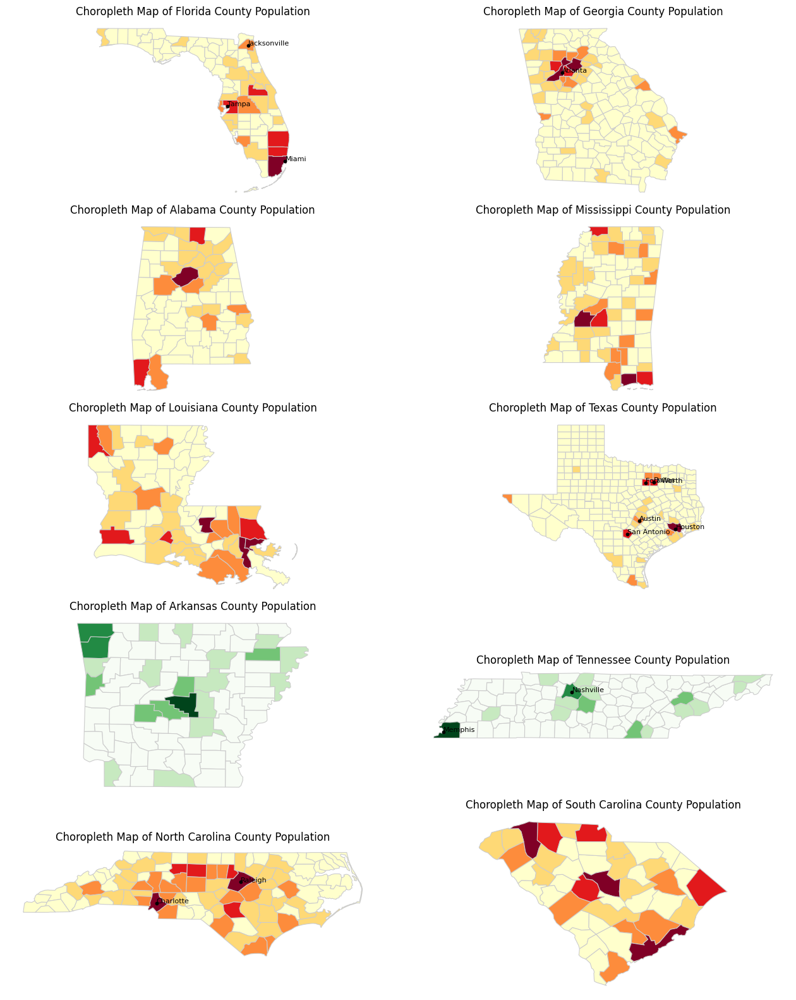

In [ ]:
# Create a figure and a grid of subplots
fig, axs = plt.subplots(nrows, ncols, figsize=(16, 20))

# Adjust spaces between subplots
plt.subplots_adjust(wspace=0.1, hspace=0.1)

# Reshape axs to 1-D array to iterate over
axs = axs.ravel()

for idx, (state_name, state_fips) in enumerate(southern_states.items()):
    if idx < nrows * ncols:  # Ensure we don't exceed the number of subplots
        # Extract the data for this state
        state_counties = us_counties[us_counties["STATE"] == state_fips].copy()

        # Apply the classifier to the population data for this state
        classifier = mc.NaturalBreaks.make(k=num_bins)
        state_counties["population_bins"] = state_counties[["Population"]].apply(classifier)

        # Choose the colormap based on whether the state has a coastline
        colormap = "YlOrRd" if state_name in coastal_states else "Greens"

        # Plot the choropleth map in the current subplot
        state_counties.plot(column="population_bins", cmap=colormap, linewidth=0.8, edgecolor="0.8", ax=axs[idx])
        axs[idx].set_title(f"Choropleth Map of {state_name} County Population")
        axs[idx].set_axis_off()

        # Create a single polygon for the current state
        state_polygon = state_counties.unary_union

        # Filter cities based on whether they fall within the current state
        major_cities_in_state = major_cities_gdf[major_cities_gdf.within(state_polygon)]

        # Add points for each major city
        major_cities_in_state.plot(ax=axs[idx], color='black', markersize=10)

        # Label the cities
        for x, y, label in zip(major_cities_in_state.geometry.x, major_cities_in_state.geometry.y, major_cities_in_state['City']):
            axs[idx].text(x, y, label, fontsize=8)

# Save the figure with high resolution (300 dpi)
plt.savefig('southern_states.png', dpi=300)

# Display the figure
plt.show()


#### 1.1.4.1 add major cities

In [ ]:
from geopy.geocoders import Nominatim
from geopy.exc import GeocoderTimedOut
import time

# Load the data from Wikipedia
url_wiki_us_cities = "https://en.wikipedia.org/wiki/List_of_United_States_cities_by_population"
us_cities = pd.read_html(url_wiki_us_cities)[4] # The fifth table is the one we want

# Keep only the columns we need
us_cities = us_cities[['City', 'State[c]']]

# Filter the largest 50 cities
us_cities = us_cities[:50]

# Initialize the geolocator
geolocator = Nominatim(user_agent="geoapiExercises")

# Function to delay between geocoding calls
geocode = lambda query: geolocator.geocode("%s, USA" % query)

# Add latitude and longitude to each city
latitudes = []
longitudes = []
for city in us_cities['City']:
    try:
        location = geocode(city)
        if location:
            latitudes.append(location.latitude)
            longitudes.append(location.longitude)
        else:
            latitudes.append(np.nan)
            longitudes.append(np.nan)
    except GeocoderTimedOut:
        latitudes.append(np.nan)
        longitudes.append(np.nan)
    time.sleep(1) # to add delay in case of large DFs

# Add coordinates to DataFrame
us_cities['latitude'] = latitudes
us_cities['longitude'] = longitudes

# Convert DataFrame to GeoDataFrame
major_cities_gdf = gpd.GeoDataFrame(
    us_cities,
    geometry=gpd.points_from_xy(us_cities.longitude, us_cities.latitude)
)


In [ ]:
major_cities_gdf['City'] = major_cities_gdf['City'].str.replace(r'\[.*\]', '', regex=True)


In [ ]:
major_cities_gdf

,City,State[c],latitude,longitude,geometry
0,New York,New York,40.712728,-74.006015,POINT (-74.00602 40.71273)
1,Los Angeles,California,34.053691,-118.242766,POINT (-118.24277 34.05369)
2,Chicago,Illinois,41.875562,-87.624421,POINT (-87.62442 41.87556)
3,Houston,Texas,29.758938,-95.367697,POINT (-95.36770 29.75894)
4,Phoenix,Arizona,33.448437,-112.074141,POINT (-112.07414 33.44844)
5,Philadelphia,Pennsylvania,39.952724,-75.163526,POINT (-75.16353 39.95272)
6,San Antonio,Texas,29.424600,-98.495141,POINT (-98.49514 29.42460)
7,San Diego,California,32.717420,-117.162773,POINT (-117.16277 32.71742)
8,Dallas,Texas,32.776272,-96.796856,POINT (-96.79686 32.77627)
9,Austin,Texas,30.271129,-97.743700,POINT (-97.74370 30.27113)


In [ ]:
# Load the data directly from the URL
us_cities = pd.read_csv('https://raw.githubusercontent.com/grammakov/USA-cities-and-states/master/us_cities_states_counties.csv', sep='|')

# Rename columns to match our needs
us_cities = us_cities.rename(columns={"City": "city", "State short": "state_id", "Latitude": "lat", "Longitude": "lng"})

# Since this dataset doesn't have population, we'll just take the first 50 cities (this won't necessarily be the largest)
largest_us_cities = us_cities[:50]

# Convert DataFrame to GeoDataFrame
largest_us_cities_gdf = gpd.GeoDataFrame(
    largest_us_cities,
    geometry=gpd.points_from_xy(largest_us_cities.lng, largest_us_cities.lat)
)


AttributeError: ignored

In [ ]:
import geopandas as gpd
import pandas as pd
import requests
import json
import mapclassify as mc
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# Download Florida census tracts from TIGER/Line shapefiles
florida_tracts = gpd.read_file("https://www2.census.gov/geo/tiger/TIGER2021/TRACT/tl_2021_12_tract.zip")

# Download population data from ACS 5-year estimates
url_acs_population = "https://api.census.gov/data/2019/acs/acs5?get=NAME,B01001_001E&for=tract:*&in=state:12"
response = requests.get(url_acs_population)
population_json = json.loads(response.text)
population_data = pd.DataFrame(population_json[1:], columns=population_json[0])

# Merge population data with Florida tracts shapefile
florida_tracts["GEOID"] = florida_tracts["GEOID"].astype(str)
population_data["GEOID"] = population_data["state"] + population_data["county"] + population_data["tract"]
florida_tracts = florida_tracts.merge(population_data, left_on="GEOID", right_on="GEOID")

# Select the Miami-Dade County tracts
miami_dade_tracts = florida_tracts[florida_tracts["COUNTYFP"] == "086"].copy()

# Classify the population data using natural Jenks classification
num_bins = 5
classifier = mc.NaturalBreaks.make(k=num_bins)
miami_dade_tracts["population_bins"] = miami_dade_tracts[["B01001_001E"]].apply(classifier)

# Create the main figure and axes for the Florida county map
fig, ax = plt.subplots(1, figsize=(12, 8))

# Plot the Florida county map
florida_counties.plot(column="population_bins", cmap="YlOrRd", linewidth=0.8, edgecolor="0.8", ax=ax)

# Create an inset_axes object for the Miami-Dade County inset map
inset_ax = fig.add_axes([0.5, 0.5, 0.3, 0.3])

# Plot the Miami-Dade County inset map
miami_dade_tracts.plot(column="population_bins", cmap="YlOrRd", linewidth=0.1, edgecolor="0.8", ax=inset_ax)

# Set the title and axis labels for the main figure and inset_axes
ax.set_title("Choropleth Map of Florida County Population")
ax.set_axis_off()
inset_ax.set_title("Miami-Dade County Population (Census Tracts)")
inset_ax.set_axis_off()

plt.show()


TypeError: ignored

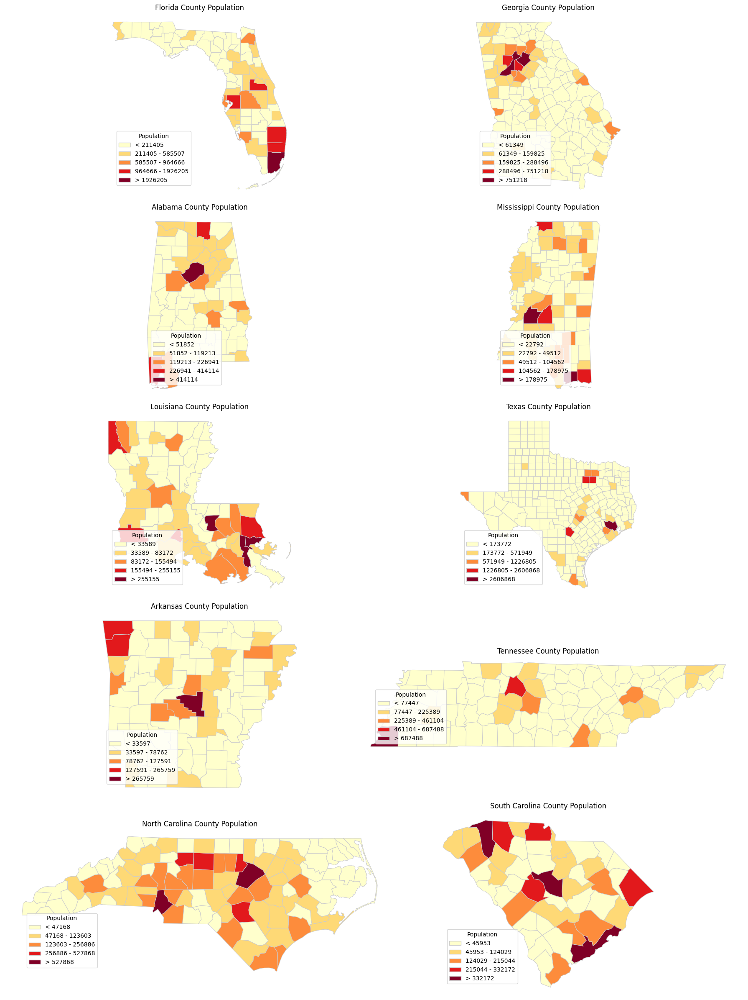

In [ ]:
# Set up the plot grid
fig, axes = plt.subplots(5, 2, figsize=(18, 24))
axes = axes.ravel()

# Loop through each southern state and its index
for index, (state_name, state_fips) in enumerate(southern_states.items()):
    state_counties = us_counties[us_counties["STATE"] == state_fips].copy()

    # Classify the population data using natural Jenks classification
    num_bins = 5
    classifier = mc.NaturalBreaks.make(k=num_bins)
    state_counties["population_bins"] = state_counties[["Population"]].apply(classifier)

    # Plot the choropleth map in the corresponding subplot
    ax = axes[index]
    state_counties.plot(column="population_bins", cmap="YlOrRd", linewidth=0.8, edgecolor="0.8", ax=ax)
    ax.set_title(f"{state_name} County Population")
    ax.set_axis_off()

    # Create discrete legend items
    legend_labels = []
    bins = mc.NaturalBreaks(state_counties[["Population"]], num_bins).bins
    for i, row in enumerate(bins):
        if i == 0:
            legend_labels.append(f"< {row:.0f}")
        elif i == len(bins) - 1:
            legend_labels.append(f"> {bins[i - 1]:.0f}")
        else:
            legend_labels.append(f"{bins[i - 1]:.0f} - {row:.0f}")

    # Create a list of legend patches and their corresponding labels
    legend_patches = [Patch(facecolor=color, edgecolor="0.8") for color in plt.cm.YlOrRd(np.linspace(0, 1, num_bins))]
    legend = ax.legend(legend_patches, legend_labels, title="Population", loc="lower left", bbox_to_anchor=(0.05, 0.05), fontsize=10)

# Adjust the layout to avoid overlapping
fig.tight_layout()
plt.show()


In [ ]:
# Draw thematic maps


## 2. Design maps based on the understanding of space

Test for mental maps, including the awareness of:
*   distance
*   direction/orientation
*   size
*   shape
*   topological relationship
*   hierarchy
*   distribution
*   network
*   spatial association
*   









City A is at the location of (28.1815, -82.4185). City A is 100 miles south 

*   List item
*   List item

of City B, and City A is 100 miles west of City C, and now City D is 100 miles north of City C. How to write Python code to draw these four cities using Matplotlib

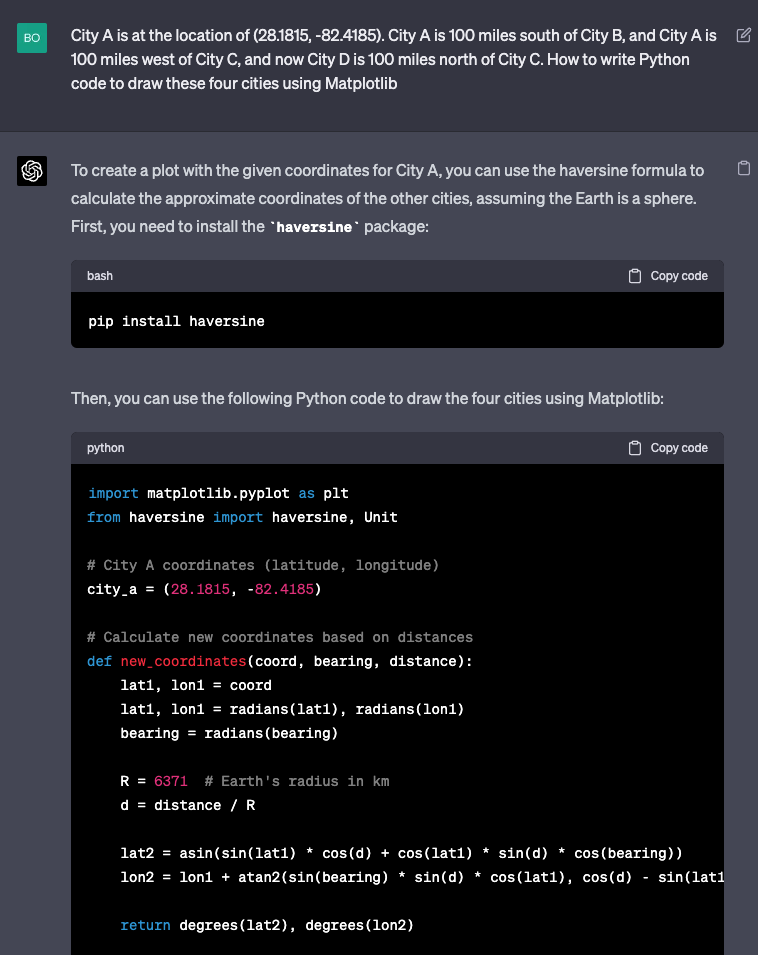

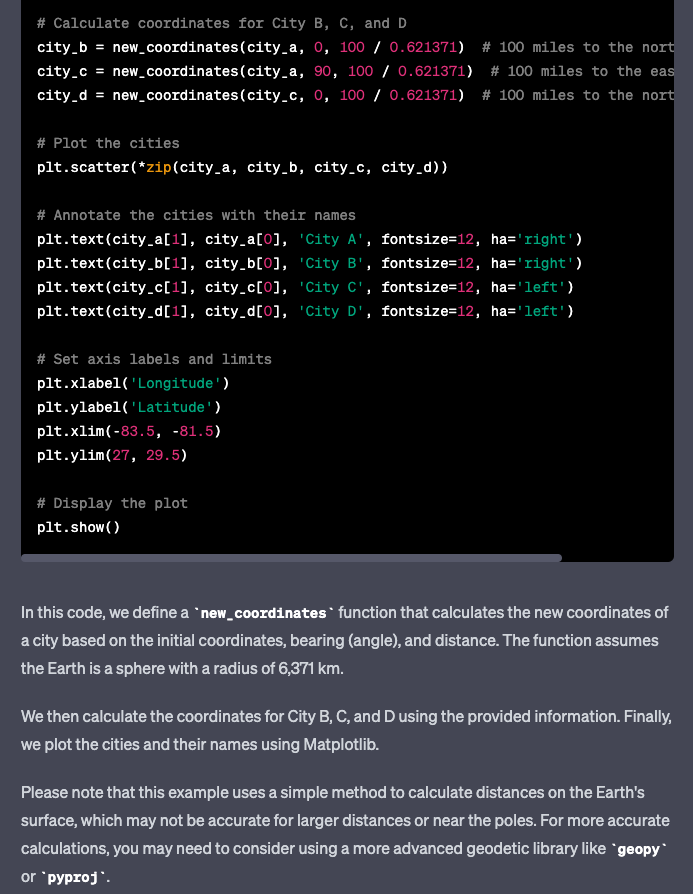

In [ ]:
!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 13.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 51.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.1/16.1 MB 51.6 MB/s eta 0:00:00


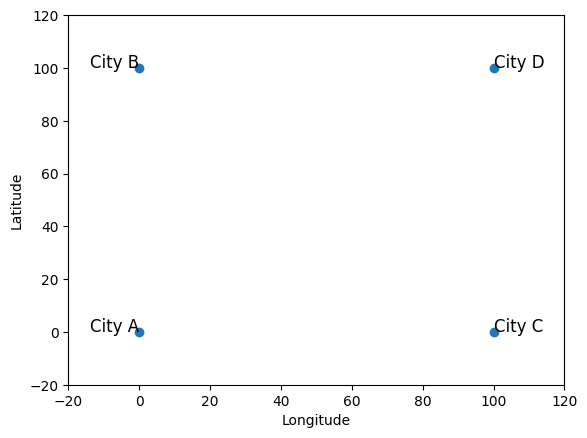

In [ ]:
import matplotlib.pyplot as plt

# Coordinates for each city (x, y)
city_a = (0, 0)
city_b = (0, 100)
city_c = (100, 0)
city_d = (100, 100)

# Plot the cities
plt.scatter(*zip(city_a, city_b, city_c, city_d))

# Annotate the cities with their names
plt.text(city_a[0], city_a[1], 'City A', fontsize=12, ha='right')
plt.text(city_b[0], city_b[1], 'City B', fontsize=12, ha='right')
plt.text(city_c[0], city_c[1], 'City C', fontsize=12, ha='left')
plt.text(city_d[0], city_d[1], 'City D', fontsize=12, ha='left')

# Set axis labels and limits
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.xlim(-20, 120)
plt.ylim(-20, 120)

# Display the plot
plt.show()

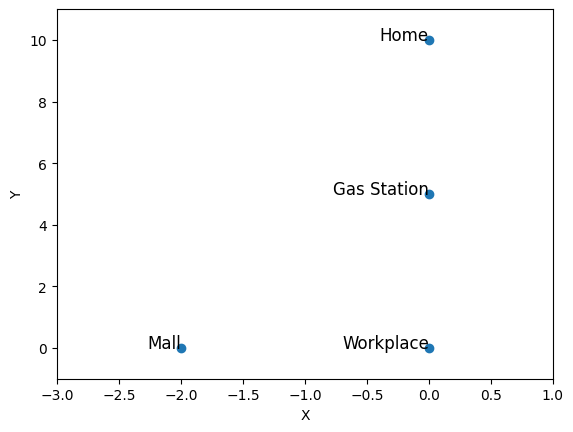

In [ ]:
import matplotlib.pyplot as plt

# Coordinates for each location (x, y)
home = (0, 10)
workplace = (0, 0)
gas_station = (0, 5)
mall = (-2, 0)

# Plot the locations
plt.scatter(*zip(home, workplace, gas_station, mall))

# Annotate the locations with their names
plt.text(home[0], home[1], 'Home', fontsize=12, ha='right')
plt.text(workplace[0], workplace[1], 'Workplace', fontsize=12, ha='right')
plt.text(gas_station[0], gas_station[1], 'Gas Station', fontsize=12, ha='right')
plt.text(mall[0], mall[1], 'Mall', fontsize=12, ha='right')

# Set axis labels and limits
plt.xlabel('X')
plt.ylabel('Y')
plt.xlim(-3, 1)
plt.ylim(-1, 11)

# Display the plot
plt.show()

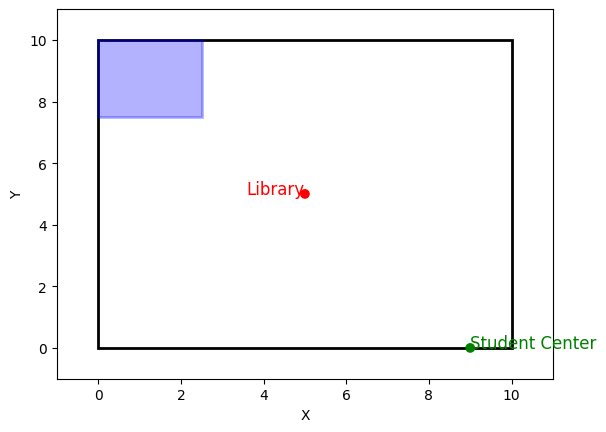

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Campus coordinates (x, y)
campus_bottom_left = (0, 0)
campus_top_right = (10, 10)

# Calculate library and student center coordinates
library = ((campus_top_right[0] + campus_bottom_left[0]) / 2, (campus_top_right[1] + campus_bottom_left[1]) / 2)
student_center = (campus_top_right[0] * 0.9, campus_bottom_left[1] * 0.1)

# Calculate parking lot coordinates
parking_lot_bottom_left = (0, 7.5)
parking_lot_top_right = (2.5, 10)

# Create a figure and axis
fig, ax = plt.subplots()

# Draw campus as a polygon
campus = patches.Rectangle(campus_bottom_left, 10, 10, edgecolor='black', facecolor='none', linewidth=2)
ax.add_patch(campus)

# Draw parking lot as a polygon
parking_lot = patches.Rectangle(parking_lot_bottom_left, 2.5, 2.5, edgecolor='blue', facecolor='blue', alpha=0.3, linewidth=2)
ax.add_patch(parking_lot)

# Plot the library and student center as points
ax.scatter(*zip(library, student_center), c=['red', 'green'])

# Annotate the points with their names
ax.text(library[0], library[1], 'Library', fontsize=12, ha='right', color='red')
ax.text(student_center[0], student_center[1], 'Student Center', fontsize=12, ha='left', color='green')

# Set axis labels and limits
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_xlim(-1, 11)
ax.set_ylim(-1, 11)

# Display the plot
plt.show()

The campus is in the shape of a square, 2 km by 2km. Inside the campus, Library is at the very center. Student Center is inside campus and sits near campus's southern boundary. A curvy road connects Library and Student Center. There is a parking lot at the top-left corner of the campus, whose area is about 1/4 of the campus.  A straight road connects Library and the parking lot. How to write code to draw the above features in a map?

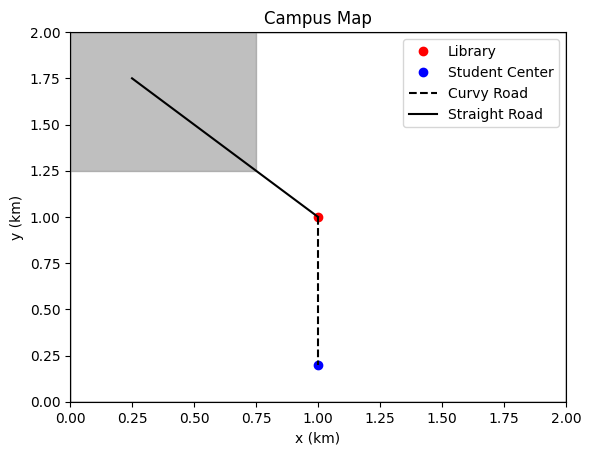

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def draw_square(ax, center, size, **kwargs):
    """Draw a square given center and size."""
    bottom_left = center - size / 2
    square = plt.Rectangle(bottom_left, size, size, **kwargs)
    ax.add_patch(square)

# Campus boundary
campus_center = np.array([1, 1])
campus_size = 2

# Library
library = campus_center

# Student Center
student_center = np.array([1, 0.2])

# Parking lot
parking_lot_center = np.array([0.25, 1.75])
parking_lot_size = campus_size / 2

# Draw map
fig, ax = plt.subplots()

# Draw campus
draw_square(ax, campus_center, campus_size, edgecolor="black", facecolor="none")

# Draw parking lot
draw_square(ax, parking_lot_center, parking_lot_size, edgecolor="gray", facecolor="gray", alpha=0.5)

# Draw Library and Student Center
ax.plot(library[0], library[1], 'ro', label='Library')
ax.plot(student_center[0], student_center[1], 'bo', label='Student Center')

# Draw roads
ax.plot(*zip(library, student_center), 'k--', label='Curvy Road')
ax.plot(*zip(library, parking_lot_center), 'k-', label='Straight Road')

# Set labels and legend
ax.set_xlabel("x (km)")
ax.set_ylabel("y (km)")
ax.set_xlim(0, 2)
ax.set_ylim(0, 2)
ax.legend()
plt.title("Campus Map")
plt.show()

the total area of parking lot is 1/4 of the campus, not the edge length. Also, you forgot to add parking lot in the legend. I also want the curvy road to be realistic, use 'bezier curves' on the map. Can you take care of these additional comments and regenerate the code for the map?

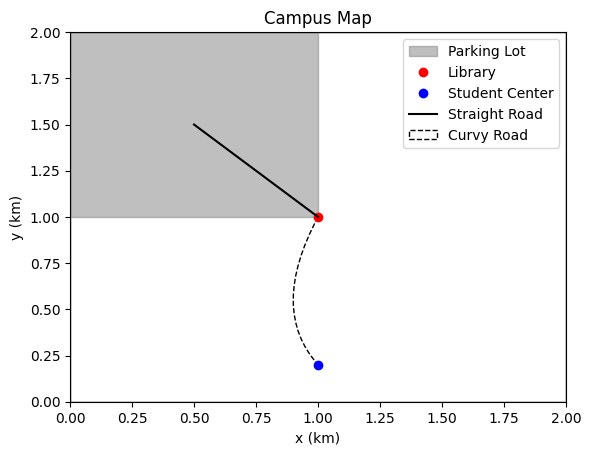

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.path import Path
import matplotlib.patches as patches

def draw_square(ax, center, size, **kwargs):
    """Draw a square given center and size."""
    bottom_left = center - size / 2
    square = plt.Rectangle(bottom_left, size, size, **kwargs)
    ax.add_patch(square)

# Campus boundary
campus_center = np.array([1, 1])
campus_size = 2

# Library
library = campus_center

# Student Center
student_center = np.array([1, 0.2])

# Parking lot
parking_lot_edge = np.sqrt(campus_size**2 / 4)
parking_lot_center = np.array([0.5 * parking_lot_edge, 1.5 * parking_lot_edge])
parking_lot_size = parking_lot_edge

# Draw map
fig, ax = plt.subplots()

# Draw campus
draw_square(ax, campus_center, campus_size, edgecolor="black", facecolor="none")

# Draw parking lot
draw_square(ax, parking_lot_center, parking_lot_size, edgecolor="gray", facecolor="gray", alpha=0.5,label='Parking Lot')

# Draw Library and Student Center
ax.plot(library[0], library[1], 'ro', label='Library')
ax.plot(student_center[0], student_center[1], 'bo', label='Student Center')

# Draw roads
# Straight road
ax.plot(*zip(library, parking_lot_center), 'k-', label='Straight Road')

# Curvy road (Bezier curve)
curve_points = [library, [0.8, 0.5], student_center]
codes = [Path.MOVETO, Path.CURVE3, Path.CURVE3]
path = Path(curve_points, codes)
patch = patches.PathPatch(path, edgecolor='k', linestyle='--', facecolor='none', label='Curvy Road')
ax.add_patch(patch)

# Set labels and legend
ax.set_xlabel("x (km)")
ax.set_ylabel("y (km)")
ax.set_xlim(0, 2)
ax.set_ylim(0, 2)
ax.legend()
plt.title("Campus Map")
plt.show()


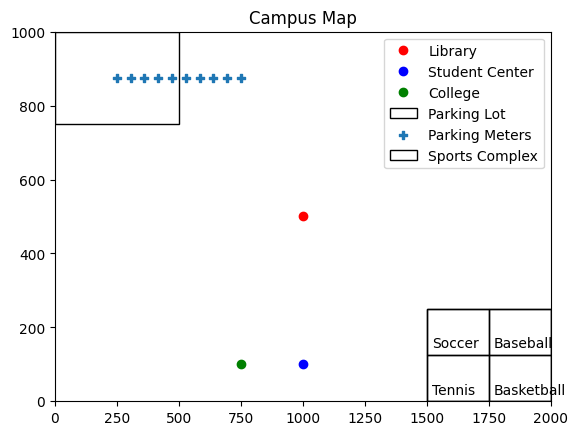

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Campus dimensions
campus_width = 2000
campus_height = 1000

# Library
library_x = campus_width / 2
library_y = campus_height / 2

# Student Center
student_center_x = campus_width / 2
student_center_y = campus_height * 0.1

# College
college_x = student_center_x - 250
college_y = student_center_y

# Parking lot
parking_width = campus_width / 4
parking_height = campus_height / 4
parking_meters = 10
parking_x = np.linspace(parking_width / 2, parking_width * 3 / 2, parking_meters)

# Sports complex
sports_complex_width = campus_width / 4
sports_complex_height = campus_height / 4

# Plotting the campus and its features
fig, ax = plt.subplots()
ax.set_xlim(0, campus_width)
ax.set_ylim(0, campus_height)

# Plot Library, Student Center, and College
ax.plot(library_x, library_y, 'ro', label='Library')
ax.plot(student_center_x, student_center_y, 'bo', label='Student Center')
ax.plot(college_x, college_y, 'go', label='College')

# Plot Parking lot and parking meters
parking_rect = plt.Rectangle((0, campus_height - parking_height), parking_width, parking_height, fill=None, label='Parking Lot')
ax.add_patch(parking_rect)
ax.scatter(parking_x, np.full(parking_meters, campus_height - parking_height / 2), marker='P', label='Parking Meters')

# Plot Sports Complex and fields
sports_complex_rect = plt.Rectangle((campus_width - sports_complex_width, 0), sports_complex_width, sports_complex_height, fill=None, label='Sports Complex')
ax.add_patch(sports_complex_rect)
fields = ['Tennis', 'Basketball', 'Soccer', 'Baseball']
for i, field in enumerate(fields):
    field_rect = plt.Rectangle((campus_width - sports_complex_width + (sports_complex_width / 2) * (i % 2), (sports_complex_height / 2) * (i // 2)), sports_complex_width / 2, sports_complex_height / 2, fill=None)
    ax.add_patch(field_rect)
    ax.text(campus_width - sports_complex_width + (sports_complex_width / 2) * (i % 2) + 20, (sports_complex_height / 2) * (i // 2) + 20, field)

ax.legend()
plt.title('Campus Map')
plt.show()


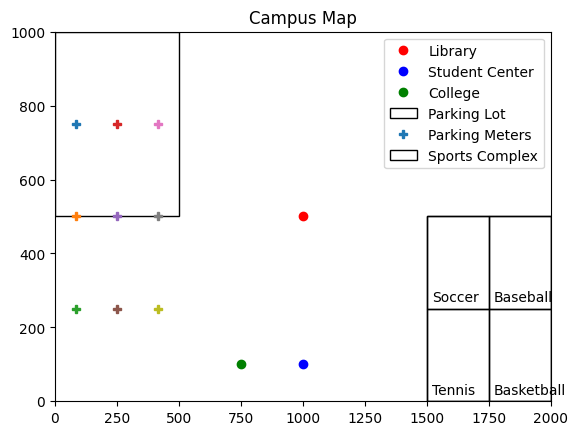

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Campus dimensions
campus_width = 2000
campus_height = 1000

# Library
library_x = campus_width / 2
library_y = campus_height / 2

# Student Center
student_center_x = campus_width / 2
student_center_y = campus_height * 0.1

# College
college_x = student_center_x - 250
college_y = student_center_y

# Parking lot
parking_area = (campus_width * campus_height) / 8
parking_edge = np.sqrt(parking_area)
parking_meters = 10
meters_per_row = int(np.sqrt(parking_meters))
parking_x = np.linspace(parking_edge / (2 * meters_per_row), parking_edge - parking_edge / (2 * meters_per_row), meters_per_row)
parking_y = np.linspace(campus_height - parking_edge / 2, campus_height - 3 * parking_edge / 2, meters_per_row)

# Sports complex
sports_complex_edge = np.sqrt(parking_area)

# Plotting the campus and its features
fig, ax = plt.subplots()
ax.set_xlim(0, campus_width)
ax.set_ylim(0, campus_height)

# Plot Library, Student Center, and College
ax.plot(library_x, library_y, 'ro', label='Library')
ax.plot(student_center_x, student_center_y, 'bo', label='Student Center')
ax.plot(college_x, college_y, 'go', label='College')

# Plot Parking lot and parking meters
parking_rect = plt.Rectangle((0, campus_height - parking_edge), parking_edge, parking_edge, fill=None, label='Parking Lot')
ax.add_patch(parking_rect)
for i in range(meters_per_row):
    for j in range(meters_per_row):
        ax.plot(parking_x[i], parking_y[j], 'P', label='Parking Meters' if i == 0 and j == 0 else "")

# Plot Sports Complex and fields
sports_complex_rect = plt.Rectangle((campus_width - sports_complex_edge, 0), sports_complex_edge, sports_complex_edge, fill=None, label='Sports Complex')
ax.add_patch(sports_complex_rect)
fields = ['Tennis', 'Basketball', 'Soccer', 'Baseball']
for i, field in enumerate(fields):
    field_rect = plt.Rectangle((campus_width - sports_complex_edge + (sports_complex_edge / 2) * (i % 2), (sports_complex_edge / 2) * (i // 2)), sports_complex_edge / 2, sports_complex_edge / 2, fill=None)
    ax.add_patch(field_rect)
    ax.text(campus_width - sports_complex_edge + (sports_complex_edge / 2) * (i % 2) + 20, (sports_complex_edge / 2) * (i // 2) + 20, field)

ax.legend()
plt.title('Campus Map')
plt.show()


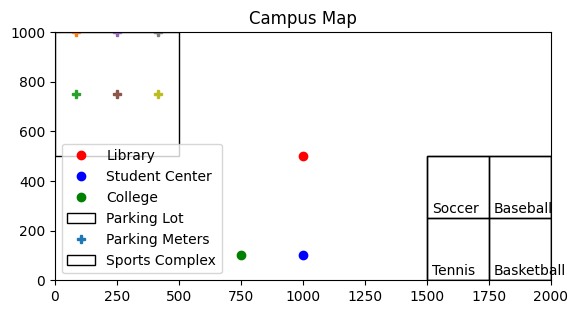

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Campus dimensions
campus_width = 2000
campus_height = 1000

# Library
library_x = campus_width / 2
library_y = campus_height / 2

# Student Center
student_center_x = campus_width / 2
student_center_y = campus_height * 0.1

# College
college_x = student_center_x - 250
college_y = student_center_y

# Parking lot
parking_area = (campus_width * campus_height) / 8
parking_edge = np.sqrt(parking_area)
parking_meters = 10
meters_per_row = int(np.sqrt(parking_meters))
parking_x = np.linspace(parking_edge / (2 * meters_per_row), parking_edge - parking_edge / (2 * meters_per_row), meters_per_row)
parking_y = np.linspace(campus_height - parking_edge / 2, campus_height - 3 * parking_edge / 2, meters_per_row)

# Sports complex
sports_complex_edge = np.sqrt(parking_area)

# Plotting the campus and its features
fig, ax = plt.subplots()
ax.set_xlim(0, campus_width)
ax.set_ylim(0, campus_height)
ax.set_aspect('equal', adjustable='box')

# Plot Library, Student Center, and College
ax.plot(library_x, library_y, 'ro', label='Library')
ax.plot(student_center_x, student_center_y, 'bo', label='Student Center')
ax.plot(college_x, college_y, 'go', label='College')

# Plot Parking lot and parking meters
parking_rect = plt.Rectangle((0, campus_height - parking_edge), parking_edge, parking_edge, fill=None, label='Parking Lot')
ax.add_patch(parking_rect)
for i in range(meters_per_row):
    for j in range(meters_per_row):
        ax.plot(parking_x[i], campus_height - parking_edge + parking_y[j], 'P', label='Parking Meters' if i == 0 and j == 0 else "")

# Plot Sports Complex and fields
sports_complex_rect = plt.Rectangle((campus_width - sports_complex_edge, 0), sports_complex_edge, sports_complex_edge, fill=None, label='Sports Complex')
ax.add_patch(sports_complex_rect)
fields = ['Tennis', 'Basketball', 'Soccer', 'Baseball']
for i, field in enumerate(fields):
    field_rect = plt.Rectangle((campus_width - sports_complex_edge + (sports_complex_edge / 2) * (i % 2), (sports_complex_edge / 2) * (i // 2)), sports_complex_edge / 2, sports_complex_edge / 2, fill=None)
    ax.add_patch(field_rect)
    ax.text(campus_width - sports_complex_edge + (sports_complex_edge / 2) * (i % 2) + 20, (sports_complex_edge / 2) * (i // 2) + 20, field)

ax.legend()
plt.title('Campus Map')
plt.show()


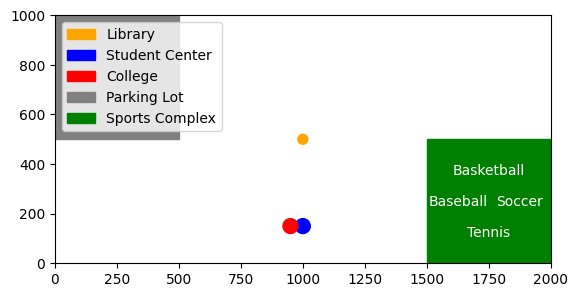

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Campus dimensions
campus_length = 2000
campus_width = 1000

# Calculate parking lot and sports complex dimensions
parking_lot_side = ((campus_length * campus_width) / 8) ** 0.5
sports_complex_side = parking_lot_side

# Plot campus
fig, ax = plt.subplots()
ax.set_xlim(0, campus_length)
ax.set_ylim(0, campus_width)
ax.set_aspect('equal')

# Plot library
library = patches.Circle((campus_length / 2, campus_width / 2), 20, color='orange', label='Library')
ax.add_patch(library)

# Plot student center
student_center = patches.Circle((campus_length / 2, campus_width * 0.15), 30, color='blue', label='Student Center')
ax.add_patch(student_center)

# Plot college
college = patches.Circle((campus_length / 2 - (campus_width * 0.05), campus_width * 0.15), 30, color='red', label='College')
ax.add_patch(college)

# Plot parking lot
parking_lot = patches.Rectangle((0, campus_width - parking_lot_side), parking_lot_side, parking_lot_side, color='gray', label='Parking Lot')
ax.add_patch(parking_lot)

# Plot sports complex
sports_complex = patches.Rectangle((campus_length - sports_complex_side, 0), sports_complex_side, sports_complex_side, color='green', label='Sports Complex')
ax.add_patch(sports_complex)

# Add labels for sports fields
ax.text(campus_length - (sports_complex_side / 2), sports_complex_side / 4, 'Tennis', ha='center', va='center', color='white')
ax.text(campus_length - (sports_complex_side / 2), sports_complex_side * (3/4), 'Basketball', ha='center', va='center', color='white')
ax.text(campus_length - (sports_complex_side / 4), sports_complex_side / 2, 'Soccer', ha='center', va='center', color='white')
ax.text(campus_length - (sports_complex_side * (3/4)), sports_complex_side / 2, 'Baseball', ha='center', va='center', color='white')

# Add legend
ax.legend(loc='upper left')

# Display the map
plt.show()


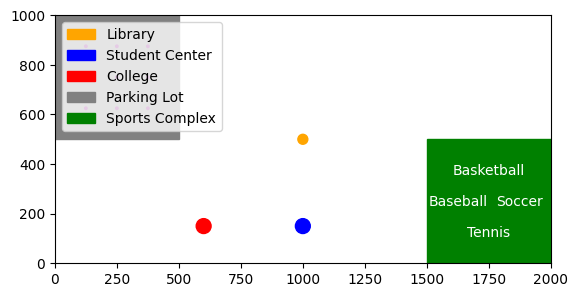

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Campus dimensions
campus_length = 2000
campus_width = 1000

# Calculate parking lot and sports complex dimensions
parking_lot_side = ((campus_length * campus_width) / 8) ** 0.5
sports_complex_side = parking_lot_side

# Plot campus
fig, ax = plt.subplots()
ax.set_xlim(0, campus_length)
ax.set_ylim(0, campus_width)
ax.set_aspect('equal')

# Plot library
library = patches.Circle((campus_length / 2, campus_width / 2), 20, color='orange', label='Library')
ax.add_patch(library)

# Plot student center
student_center = patches.Circle((campus_length / 2, campus_width * 0.15), 30, color='blue', label='Student Center')
ax.add_patch(student_center)

# Plot college (5-minute walk distance = ~400 meters)
college = patches.Circle((campus_length / 2 - 400, campus_width * 0.15), 30, color='red', label='College')
ax.add_patch(college)

# Plot parking lot
parking_lot = patches.Rectangle((0, campus_width - parking_lot_side), parking_lot_side, parking_lot_side, color='gray', label='Parking Lot')
ax.add_patch(parking_lot)

# Plot parking meters (3x3 grid)
parking_meter_distance = parking_lot_side / 4
for i in range(3):
    for j in range(3):
        meter = patches.Circle((parking_meter_distance * (i + 1), campus_width - parking_lot_side + parking_meter_distance * (j + 1)), 5, color='purple')
        ax.add_patch(meter)

# Plot sports complex
sports_complex = patches.Rectangle((campus_length - sports_complex_side, 0), sports_complex_side, sports_complex_side, color='green', label='Sports Complex')
ax.add_patch(sports_complex)

# Add labels for sports fields
ax.text(campus_length - (sports_complex_side / 2), sports_complex_side / 4, 'Tennis', ha='center', va='center', color='white')
ax.text(campus_length - (sports_complex_side / 2), sports_complex_side * (3/4), 'Basketball', ha='center', va='center', color='white')
ax.text(campus_length - (sports_complex_side / 4), sports_complex_side / 2, 'Soccer', ha='center', va='center', color='white')
ax.text(campus_length - (sports_complex_side * (3/4)), sports_complex_side / 2, 'Baseball', ha='center', va='center', color='white')

# Add legend
ax.legend(loc='upper left')

# Display the map
plt.show()


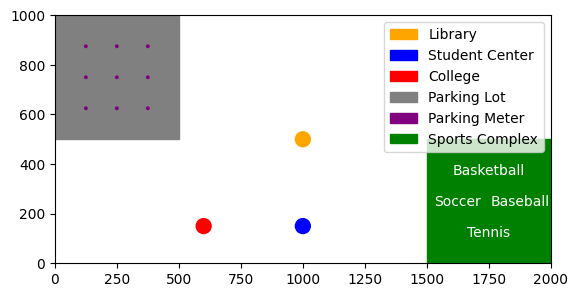

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Campus dimensions
campus_length = 2000
campus_width = 1000

# Calculate parking lot and sports complex dimensions
parking_lot_side = ((campus_length * campus_width) / 8) ** 0.5
sports_complex_side = parking_lot_side

# Plot campus
fig, ax = plt.subplots()
ax.set_xlim(0, campus_length)
ax.set_ylim(0, campus_width)
ax.set_aspect('equal')

# Plot library (same size as College)
library = patches.Circle((campus_length / 2, campus_width / 2), 30, color='orange', label='Library')
ax.add_patch(library)

# Plot student center
student_center = patches.Circle((campus_length / 2, campus_width * 0.15), 30, color='blue', label='Student Center')
ax.add_patch(student_center)

# Plot college (5-minute walk distance = ~400 meters)
college = patches.Circle((campus_length / 2 - 400, campus_width * 0.15), 30, color='red', label='College')
ax.add_patch(college)

# Plot parking lot
parking_lot = patches.Rectangle((0, campus_width - parking_lot_side), parking_lot_side, parking_lot_side, color='gray', label='Parking Lot')
ax.add_patch(parking_lot)

# Plot parking meters (3x3 grid)
parking_meter_distance = parking_lot_side / 4
for i in range(3):
    for j in range(3):
        meter = patches.Circle((parking_meter_distance * (i + 1), campus_width - parking_lot_side + parking_meter_distance * (j + 1)), 5, color='purple')
        ax.add_patch(meter)

# Plot sports complex
sports_complex = patches.Rectangle((campus_length - sports_complex_side, 0), sports_complex_side, sports_complex_side, color='green', label='Sports Complex')
ax.add_patch(sports_complex)

# Add labels for sports fields
sports_complex_half_side = sports_complex_side / 2
ax.text(campus_length - sports_complex_half_side, sports_complex_half_side / 2, 'Tennis', ha='center', va='center', color='white')
ax.text(campus_length - sports_complex_half_side, sports_complex_half_side * (3/2), 'Basketball', ha='center', va='center', color='white')
ax.text(campus_length - sports_complex_half_side * (3/2), sports_complex_half_side, 'Soccer', ha='center', va='center', color='white')
ax.text(campus_length - sports_complex_half_side / 2, sports_complex_half_side, 'Baseball', ha='center', va='center', color='white')

# Add legend (with parking meter)
legend_elements = [
    patches.Patch(color='orange', label='Library'),
    patches.Patch(color='blue', label='Student Center'),
    patches.Patch(color='red', label='College'),
    patches.Patch(color='gray', label='Parking Lot'),
    patches.Patch(color='purple', label='Parking Meter'),
    patches.Patch(color='green', label='Sports Complex')
]
ax.legend(handles=legend_elements, loc='upper right')

# Display the map


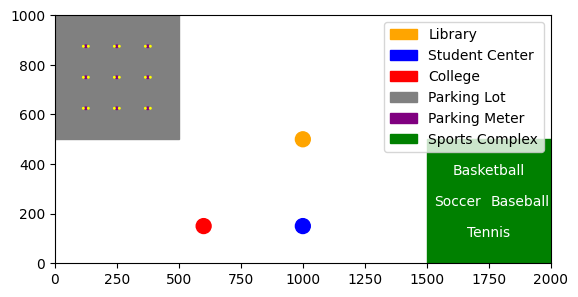

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Campus dimensions
campus_length = 2000
campus_width = 1000

# Calculate parking lot and sports complex dimensions
parking_lot_side = ((campus_length * campus_width) / 8) ** 0.5
sports_complex_side = parking_lot_side

# Plot campus
fig, ax = plt.subplots()
ax.set_xlim(0, campus_length)
ax.set_ylim(0, campus_width)
ax.set_aspect('equal')

# Plot library (same size as College)
library = patches.Circle((campus_length / 2, campus_width / 2), 30, color='orange', label='Library')
ax.add_patch(library)

# Plot student center
student_center = patches.Circle((campus_length / 2, campus_width * 0.15), 30, color='blue', label='Student Center')
ax.add_patch(student_center)

# Plot college (5-minute walk distance = ~400 meters)
college = patches.Circle((campus_length / 2 - 400, campus_width * 0.15), 30, color='red', label='College')
ax.add_patch(college)

# Plot parking lot
parking_lot = patches.Rectangle((0, campus_width - parking_lot_side), parking_lot_side, parking_lot_side, color='gray', label='Parking Lot')
ax.add_patch(parking_lot)

# Plot parking meters (3x3 grid) and EV chargers
parking_meter_distance = parking_lot_side / 4
for i in range(3):
    for j in range(3):
        meter = patches.Circle((parking_meter_distance * (i + 1), campus_width - parking_lot_side + parking_meter_distance * (j + 1)), 5, color='purple')
        ax.add_patch(meter)
        charger1 = patches.Circle((parking_meter_distance * (i + 1) - 10, campus_width - parking_lot_side + parking_meter_distance * (j + 1)), 3, color='yellow')
        ax.add_patch(charger1)
        charger2 = patches.Circle((parking_meter_distance * (i + 1) + 10, campus_width - parking_lot_side + parking_meter_distance * (j + 1)), 3, color='yellow')
        ax.add_patch(charger2)

# Plot sports complex
sports_complex = patches.Rectangle((campus_length - sports_complex_side, 0), sports_complex_side, sports_complex_side, color='green', label='Sports Complex')
ax.add_patch(sports_complex)

# Add labels for sports fields
sports_complex_half_side = sports_complex_side / 2
ax.text(campus_length - sports_complex_half_side, sports_complex_half_side / 2, 'Tennis', ha='center', va='center', color='white')
ax.text(campus_length - sports_complex_half_side, sports_complex_half_side * (3/2), 'Basketball', ha='center', va='center', color='white')
ax.text(campus_length - sports_complex_half_side * (3/2), sports_complex_half_side, 'Soccer', ha='center', va='center', color='white')
ax.text(campus_length - sports_complex_half_side / 2, sports_complex_half_side, 'Baseball', ha='center', va='center', color='white')

# Add legend (with parking meter)
legend_elements = [
    patches.Patch(color='orange', label='Library'),
    patches.Patch(color='blue', label='Student Center'),
    patches.Patch(color='red', label='College'),
    patches.Patch(color='gray', label='Parking Lot'),
    patches.Patch(color='purple', label='Parking Meter'),
    patches.Patch(color='green', label='Sports Complex')
]
ax.legend(handles=legend_elements, loc='upper right')

# Display the map


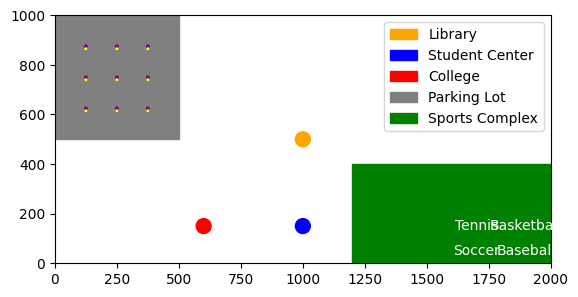

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Campus dimensions
campus_length = 2000
campus_width = 1000

# Calculate parking lot and sports complex dimensions
parking_lot_side = ((campus_length * campus_width) / 8) ** 0.5
sports_complex_length = 800
sports_complex_width = 400

# Plot campus
fig, ax = plt.subplots()
ax.set_xlim(0, campus_length)
ax.set_ylim(0, campus_width)
ax.set_aspect('equal')

# Plot library (center of the campus)
library = patches.Circle((campus_length / 2, campus_width / 2), 30, color='orange', label='Library')
ax.add_patch(library)

# Plot student center (near southern boundary)
student_center = patches.Circle((campus_length / 2, campus_width * 0.15), 30, color='blue', label='Student Center')
ax.add_patch(student_center)

# Plot college (5-minute walk west of Student Center)
college = patches.Circle((campus_length / 2 - 400, campus_width * 0.15), 30, color='red', label='College')
ax.add_patch(college)

# Plot parking lot
parking_lot = patches.Rectangle((0, campus_width - parking_lot_side), parking_lot_side, parking_lot_side, color='gray', label='Parking Lot')
ax.add_patch(parking_lot)

# Plot parking meters (3x3 grid) and EV chargers
parking_meter_distance = parking_lot_side / 4
for i in range(3):
    for j in range(3):
        meter = patches.Circle((parking_meter_distance * (i + 1), campus_width - parking_lot_side + parking_meter_distance * (j + 1)), 5, color='purple')
        ax.add_patch(meter)
        charger = patches.Circle((parking_meter_distance * (i + 1), campus_width - parking_lot_side + parking_meter_distance * (j + 1) - 10), 3, color='yellow')
        ax.add_patch(charger)

# Plot sports complex
sports_complex = patches.Rectangle((campus_length - sports_complex_length, 0), sports_complex_length, sports_complex_width, color='green', label='Sports Complex')
ax.add_patch(sports_complex)

# Add labels for sports fields
sports_complex_half_length = sports_complex_length / 2
sports_complex_half_width = sports_complex_width / 2
ax.text(campus_length - sports_complex_half_length * (3/4), sports_complex_half_width * (3/4), 'Tennis', ha='center', va='center', color='white')
ax.text(campus_length - sports_complex_half_length / 4, sports_complex_half_width * (3/4), 'Basketball', ha='center', va='center', color='white')
ax.text(campus_length - sports_complex_half_length * (3/4), sports_complex_half_width / 4, 'Soccer', ha='center', va='center', color='white')
ax.text(campus_length - sports_complex_half_length / 4, sports_complex_half_width / 4, 'Baseball', ha='center', va='center', color='white')

# Set legend location
ax.legend(loc='upper right')

# Display the map
plt.show()


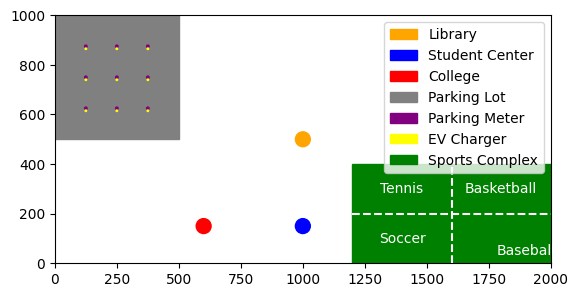

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Campus dimensions
campus_length = 2000
campus_width = 1000

# Calculate parking lot and sports complex dimensions
parking_lot_side = ((campus_length * campus_width) / 8) ** 0.5
sports_complex_length = 800
sports_complex_width = 400

# Plot campus
fig, ax = plt.subplots()
ax.set_xlim(0, campus_length)
ax.set_ylim(0, campus_width)
ax.set_aspect('equal')

# Plot library (center of the campus)
library = patches.Circle((campus_length / 2, campus_width / 2), 30, color='orange', label='Library')
ax.add_patch(library)

# Plot student center (near southern boundary)
student_center = patches.Circle((campus_length / 2, campus_width * 0.15), 30, color='blue', label='Student Center')
ax.add_patch(student_center)

# Plot college (5-minute walk west of Student Center)
college = patches.Circle((campus_length / 2 - 400, campus_width * 0.15), 30, color='red', label='College')
ax.add_patch(college)

# Plot parking lot
parking_lot = patches.Rectangle((0, campus_width - parking_lot_side), parking_lot_side, parking_lot_side, color='gray', label='Parking Lot')
ax.add_patch(parking_lot)

# Plot parking meters (3x3 grid) and EV chargers
parking_meter_distance = parking_lot_side / 4
for i in range(3):
    for j in range(3):
        meter = patches.Circle((parking_meter_distance * (i + 1), campus_width - parking_lot_side + parking_meter_distance * (j + 1)), 5, color='purple', label='Parking Meter' if i == 0 and j == 0 else "")
        ax.add_patch(meter)
        charger = patches.Circle((parking_meter_distance * (i + 1), campus_width - parking_lot_side + parking_meter_distance * (j + 1) - 10), 3, color='yellow', label='EV Charger' if i == 0 and j == 0 else "")
        ax.add_patch(charger)

# Plot sports complex
sports_complex = patches.Rectangle((campus_length - sports_complex_length, 0), sports_complex_length, sports_complex_width, color='green', label='Sports Complex')
ax.add_patch(sports_complex)

# Divide Sports Complex into four even parts
for i in range(1, 2):
    ax.plot([campus_length - sports_complex_length * i / 2, campus_length - sports_complex_length * i / 2], [0, sports_complex_width], 'w--')
    ax.plot([campus_length - sports_complex_length, campus_length], [sports_complex_width * i / 2, sports_complex_width * i / 2], 'w--')

# Add labels for sports fields
ax.text(campus_length - sports_complex_length * (3/4), sports_complex_width * (3/4), 'Tennis', ha='center', va='center', color='white')
ax.text(campus_length - sports_complex_length / 4, sports_complex_width * (3/4), 'Basketball', ha='center', va='center', color='white')
ax.text(campus_length - sports_complex_length * (3/4), sports_complex_width / 4, 'Soccer', ha='center', va='center', color='white')
ax.text(campus_length - sports_complex_half_length / 4, sports_complex_half_width / 4, 'Baseball', ha='center', va='center', color='white')

# Set legend location
ax.legend(loc='upper right')

# Display the map
plt.show()
